# Lending Club Case Study

## Problem Statement

The company wants to understand the driving factors (or driver variables) behind loan default, i.e. 
the variables which are strong indicators of default.  
The company can utilise this knowledge for its portfolio and risk assessment. 

If one is able to identify these risky loan applicants, 
then such loans can be reduced thereby cutting down the amount of credit loss.
Identification of such applicants using EDA is the aim of this case study.

Our aim is to idenify the loan application which can be defaulted or deliquanted which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate



## Steps 

- Data Cleaning Missing Data Teatment
- Data Cleaning Removing Customer Behavior Variables
- Data Cleaning - Standardizing Values, Units, Date & Text
- Data Cleaning - Outlier Analysis
- Dervied Metrics & Binnning
- Univariate Analysis
 - Continous variable
 - Categorical variable
- Segmented Univariate Analysis
- Bivariate Analysis
 - Continuous vs Continuous
 - Continuous vs Categorical
 - Categorical vs Categorical
- MultiVariate Analysis & Correlation Matrix
- Summary Statistics
- Missing Data Teatment Analysis Report
- Univariate Data Analysis Report
- Bivariate Data Analysis Report
- Final Conclusion

Important Points and Assumptions

- Considering values greater than Q3+1.5IQR(Upper Bound) & Q1-1.5IQR(Lower Bound) for Outliers treatment provided we got approval from Business

- Loan_status Chargedoff Conversion - 0 & FullyPaid Conversion -1 

- Custom functions created for visualisation for code readibility

- Graph used : Power Law Distribution , Barchart - Horizontal & Vertical , piechart , boxplot , scatterplot, barplot ,catplot, violinplot , heatmap , countplot

- used pivot table & pandasql for Data Analysis

In [1]:
# Required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from pandasql import sqldf

In [2]:
# Data Load
loan = pd.read_csv("loan.csv",low_memory=False)

 # Data Overview

In [3]:
loan.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

# Metadata Information

In [4]:
print ("Rows     : " ,loan.shape[0])
print ("Columns  : " ,loan.shape[1])
print ("\nFeatures : \n" ,loan.columns.tolist())
print ("\nMissing values :  ", loan.isnull().sum().values.sum())
print ("\nUnique values :  \n",loan.nunique())

Rows     :  39717
Columns  :  111

Features : 
 ['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med', 'mths_since_last_major_derog', 'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'ope

We have a data set which contains 39717 rows and 111 columns which have total 2263364 missing values 

id and member_id column contains the unique values

No of rows = 0 which have null values in all columns

# Data Cleaning - Missing Data Analysis

In [5]:
# Dropping ID and MEMBER_ID columns since all values are unique

loan_v1 = loan.drop(columns=['id','member_id'])

In [6]:
# Percentage of Missing Columns
pd.options.display.max_rows = None #(<< This function is use to display all rows >>)
round(100 * loan_v1.isnull().sum()/len(loan_v1.index),2)


loan_amnt                           0.00
funded_amnt                         0.00
funded_amnt_inv                     0.00
term                                0.00
int_rate                            0.00
installment                         0.00
grade                               0.00
sub_grade                           0.00
emp_title                           6.19
emp_length                          2.71
home_ownership                      0.00
annual_inc                          0.00
verification_status                 0.00
issue_d                             0.00
loan_status                         0.00
pymnt_plan                          0.00
url                                 0.00
desc                               32.58
purpose                             0.00
title                               0.03
zip_code                            0.00
addr_state                          0.00
dti                                 0.00
delinq_2yrs                         0.00
earliest_cr_line

In [7]:
    ## No of rows which have the all null values

print("No of rows = {} which have null values in all columns".format(loan_v1.isnull().all(axis=1).sum()))

No of rows = 0 which have null values in all columns


In [8]:
    ## No of columns which have the null values in all rows

print("No of columns = {} which have null values in all rows".format(loan_v1.isnull().all(axis=0).sum()))

No of columns = 54 which have null values in all rows


In [9]:
    # dropping columns which have null values in all the rows i.e. 100 % Null Values

loan_v1.dropna(axis=1, how='all',inplace=True)

In [10]:
    # Checking Columns which have null values in all the rows

print("No of columns = {} which have null values in all rows".format(loan_v1.isnull().all(axis=0).sum()))

No of columns = 0 which have null values in all rows


In [11]:
    # Check Duplicate Rows - No Duplicate rows found

duplicate = loan_v1[loan_v1.duplicated()]

duplicate

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens


In [12]:
# Percentage of records which have loan_status = Current 
# Since our aim is to idenify the loan application which can we defaulted or deliquanted
# we will not be needing the records which have loan_status = 'Current' 
# since we are not sure that the Customer be able to pay loan completed or he can be defaulted"""

print("Percentage of records loan_status = Current is {}%".format(round(100 * len(loan[loan['loan_status'] == 'Current'].index)/(len(loan.index)))));

Percentage of records loan_status = Current is 3%


In [13]:
    #dropping rows where loan_status = 'Current' 

loan_v1 = loan_v1[~(loan_v1['loan_status'] == 'Current')]

In [14]:
    # Removing funded_amnt & funded_amnt_inv columns since we are interested in loan_amnt columns only 
    # i.e. before approval/Rejection

loan_v1 = loan_v1.drop(['funded_amnt','funded_amnt_inv'],axis=1)

In [15]:
# Shape of the data set 

loan_v1.shape

(38577, 53)

In [16]:
# Percentage of Missing Columns left
pd.options.display.max_rows = None #(<< This function is use to display all rows >>)
round(100 * loan_v1.isnull().sum()/len(loan_v1.index),2)

loan_amnt                       0.00
term                            0.00
int_rate                        0.00
installment                     0.00
grade                           0.00
sub_grade                       0.00
emp_title                       6.19
emp_length                      2.68
home_ownership                  0.00
annual_inc                      0.00
verification_status             0.00
issue_d                         0.00
loan_status                     0.00
pymnt_plan                      0.00
url                             0.00
desc                           32.47
purpose                         0.00
title                           0.03
zip_code                        0.00
addr_state                      0.00
dti                             0.00
delinq_2yrs                     0.00
earliest_cr_line                0.00
inq_last_6mths                  0.00
mths_since_last_delinq         64.56
mths_since_last_record         92.90
open_acc                        0.00
p

In [17]:
                            # MISSING DATA TREATMENT ANALYSIS SUMMARY #
# # Columns which are left with Null Values Updating status followed by sequential steps and analysis below

# emp_title                  - Dropping Column since Percentage of unique values  is 72.65 imputing this column is insignificant.
# emp_length                 - It can be a significant column imputing values with mode since its a categorical column
# desc                       - Dropping Column since 32.47 % values are missing from this columns and have significant unique values cannot be use for EDA
# mths_since_last_delinq     - Dropping Column since 64.56 % of values are null imputing this column will add bias
# mths_since_last_record     - Dropping Column since it has more than 80 % of Null values
# last_pymnt_d               - Dropping Column since this feature will be useful once the loan is approved and user starts making payments 
# next_pymnt_d               - Dropping Column since it has more than 80 % of Null values
# title                      - Dropping Rows we have 0.03 % Missing Values i.e 10 rows and 50 % Distinct value instead of removing this columns we will remove the rows which are null
# revol_util                 - Dropping Rows where this column is null revolving credit utilization is an imp aspect
# last_credit_pull_d         - Dropping column Since column is not much significant in taking the decision for approvals
# collections_12_mths_ex_med - Dropping Column Since Only 1 unique value is present for all the rows i.e 0.0 hence this column is insignificant  hence no use of replaceing 56 Nan values
# chargeoff_within_12_mths   - Dropping Column Since Only 1 unique value is present for all the rows i.e 0.0 hence this column is insignificant  hence no use of replaceing 56 Nan values
# tax_liens                  - Dropping since All the rows have sing value 0.0 hence this column is insignificant for analysis
# pub_rec_bankruptcies       - Dropping Column Please refer below analysis
                                ## Have outliers Considering Outliers imputed median and observed we have only one value 0.0 
                                ## Hence it is not significant for analysis hence dropped the columns 


In [18]:
# Drop Columns which have 80% of Missing Values

# Featured Column next_pymnt_d & mths_since_last_record have more than 80 % of Missing values dropping them

loan_v1 = loan_v1.drop(['next_pymnt_d','mths_since_last_record'],axis=1)

In [19]:
# Featured Column : mths_since_last_delinq - 

# Delinquency means that you are behind on payments. Once you are delinquent for a certain period of time 
# your lender will declare the loan to be in default. The entire loan balance will become due at that time.


loan_v1 = loan_v1.drop(['mths_since_last_delinq'],axis=1)

In [20]:
# Featured Column :  desc - 32.47 % values are missing from this columns

# Every Borrower has its own description hence we cannot impute the value with max vote .
# May require text classification sentiment analysis to understand this but since we cannot utilize this column for EDA it contain text data 
# Dropping this columns 

loan_v1 = loan_v1.drop('desc',axis=1)

print("Shape After dropping desc column" ,loan_v1.shape)

Shape After dropping desc column (38577, 49)


In [21]:
#Featured Column : emp_title - Percentage of unique values  is 72.65 imputing this column is insignificant dropping this colun

print("emp_title Percentage of unique values  is :",round(100*loan_v1[['emp_title']].nunique()[0]/len(loan_v1.index),2))

loan_v1 = loan_v1.drop('emp_title',axis=1)

print("Shape After dropping emp_title column" ,loan_v1.shape)

emp_title Percentage of unique values  is : 72.65
Shape After dropping emp_title column (38577, 48)


In [22]:
loan_v1['emp_length'].value_counts()

10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: emp_length, dtype: int64

In [23]:
# Featured Column : emp_length - It can be a significant column and we have 2.7 % of missing values in this column hence imputing the data
# Since it is a categorical column imputing the data with mode

loan_v1['emp_length'] = loan_v1['emp_length'].fillna(loan_v1['emp_length'].mode()[0])

loan_v1['emp_length'].value_counts()

10+ years    9521
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: emp_length, dtype: int64

In [24]:
# Featured Column : last_pymnt_d - Based on the analysis all the 66 rows where the last month payment date is null have loan status as Charged off 
# i.e. those accounts are defaulted
# Based on the Fedral complaince after 6 months or nine months, of past-due payments: 
# Your federal loan goes into default and different type of loans will have differen guidelines for this

# Since this feature will be useful once the loan is approved and user starts making payments 
# Based on our aim dropping this column

loan_v1[loan_v1['last_pymnt_d'].isnull()]

loan_v1 = loan_v1.drop('last_pymnt_d',axis =1)

In [25]:
# Featured Column : title The loan title provided by the borrower It is an imp column used for Reject stats and
# we have 0.3 % Missing Values and 50 % Distinct value
# instead of removing this columns we will remove the rows which are null

loan_v1 = loan_v1[~loan_v1['title'].isnull()]

In [26]:
# Featured Column - revol_util How much you currently owe divided by your credit limit. Its an important columns hence 
#dropping rows which have Null instead of imputing

loan_v1 = loan_v1.dropna(axis=0, subset=['revol_util'])

In [27]:
# Featured Column - last_credit_pull_d i.e The most recent month Last credit pulled 
# i.e. credit information pull date for this loan is insignficant for taking approval decisions.
# This column is not much significant in taking the decision hence dropping this columns

loan_v1 = loan_v1.drop('last_credit_pull_d',axis=1)

In [28]:
# Featured Column - collections_12_mths_ex_med 

print("Total Null Values :",loan_v1.collections_12_mths_ex_med.isnull().sum())
print("Value Counts :",loan_v1.collections_12_mths_ex_med.value_counts())

# Dropping Column Since Only 1 unique value is present for all the rows i.e 0.0 hence this column is insignificant  hence no use of replaceing 56 Nan values
loan_v1 = loan_v1.drop('collections_12_mths_ex_med',axis=1)

Total Null Values : 56
Value Counts : 0.0    38460
Name: collections_12_mths_ex_med, dtype: int64


In [29]:
# Featured Column - chargeoff_within_12_mths

print("Total Null Values :",loan_v1.chargeoff_within_12_mths.isnull().sum())
print("Value Counts :",loan_v1.chargeoff_within_12_mths.value_counts())

# Dropping Column Since Only 1 unique value is present for all the rows i.e 0.0 hence this column is insignificant  hence no use of replaceing 56 Nan values
loan_v1 = loan_v1.drop('chargeoff_within_12_mths',axis=1)

Total Null Values : 56
Value Counts : 0.0    38460
Name: chargeoff_within_12_mths, dtype: int64


In [30]:
# Featured Columns - pub_rec_bankruptcies

print(loan_v1['pub_rec_bankruptcies'].describe())

# Can see that we have outliers hence imputing the data with median

loan_v1.loc[np.isnan(loan_v1['pub_rec_bankruptcies']),['pub_rec_bankruptcies']] = loan_v1['pub_rec_bankruptcies'].median()

print("After Imputation ",loan_v1['pub_rec_bankruptcies'].describe())

# Dropping Column since we have only single value 0.0

loan_v1 = loan_v1.drop('pub_rec_bankruptcies',axis=1)

count    37819.000000
mean         0.043523
std          0.204681
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: pub_rec_bankruptcies, dtype: float64
After Imputation  count    38516.000000
mean         0.042735
std          0.202904
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: pub_rec_bankruptcies, dtype: float64


In [31]:
# Featured Columns - tax_liens - Dropping column since All the rows have single value 0.0 hence this column is insignificant for analysis

print("Total Null Values :",loan_v1.tax_liens.isnull().sum())
print("Value Counts :",loan_v1.tax_liens.value_counts())

loan_v1 = loan_v1.drop('tax_liens',axis=1)

Total Null Values : 39
Value Counts : 0.0    38477
Name: tax_liens, dtype: int64


In [32]:
#pd.options.display.max_rows = None #(<< This function is use to display all rows >>)
round(100 * loan_v1.isnull().sum()/len(loan_v1.index),2)

loan_amnt                  0.0
term                       0.0
int_rate                   0.0
installment                0.0
grade                      0.0
sub_grade                  0.0
emp_length                 0.0
home_ownership             0.0
annual_inc                 0.0
verification_status        0.0
issue_d                    0.0
loan_status                0.0
pymnt_plan                 0.0
url                        0.0
purpose                    0.0
title                      0.0
zip_code                   0.0
addr_state                 0.0
dti                        0.0
delinq_2yrs                0.0
earliest_cr_line           0.0
inq_last_6mths             0.0
open_acc                   0.0
pub_rec                    0.0
revol_bal                  0.0
revol_util                 0.0
total_acc                  0.0
initial_list_status        0.0
out_prncp                  0.0
out_prncp_inv              0.0
total_pymnt                0.0
total_pymnt_inv            0.0
total_re

# Data Cleaning Removing Customer Behavior Variable

In [33]:
                        #Data Cleaning Ananlysis Summary
#out_prncp & out_prncp_inv contains single values 0.0 in all the rows hence dropping these columns
#policy_code column contain single value 1 in all the rows hence dropping this column
#acc_now_delinq column contain single value 0 in all the rows hence dropping this column
#delinq_amnt column contain single value o in all the rows hence dropping this column
#application_type single valued Individual not useful

loan_v1 = loan_v1.drop(['out_prncp','out_prncp_inv','acc_now_delinq','delinq_amnt','policy_code','application_type'],axis=1)

#Removing Customer Behavior Variables and which have least correlation : collection_recovery_fee, recoveries, total_rec_late_fee
# inq_last_6mnths,delinq_2yrs

loan_v1 = loan_v1.drop(['collection_recovery_fee','recoveries','total_rec_late_fee','delinq_2yrs','inq_last_6mths'],axis=1)

# Removing Customer Behavior Variables and which will be in use for loan tracking and once loan approved

loan_v1 = loan_v1.drop(['total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','last_pymnt_amnt'],axis=1)

# Removing pymnt_plan since it has single value n for all the rows

loan_v1 = loan_v1.drop(['pymnt_plan'],axis=1)

# Removing URL since its not significant

loan_v1 = loan_v1.drop(['url'],axis=1)

# Removing initial_list_status constant value f for all the columns

loan_v1 = loan_v1.drop(['initial_list_status'],axis=1)

# Removing title since it has multiple distinct values for all the columns
loan_v1 = loan_v1.drop(['title'],axis=1)

In [34]:
#Removing Variables which have least correlation : delinq_2yrs, collection_recovery_fee, recoveries, total_rec_late_fee
# inq_last_6mnths,out_prncp,out_prncp_inv

<AxesSubplot:>

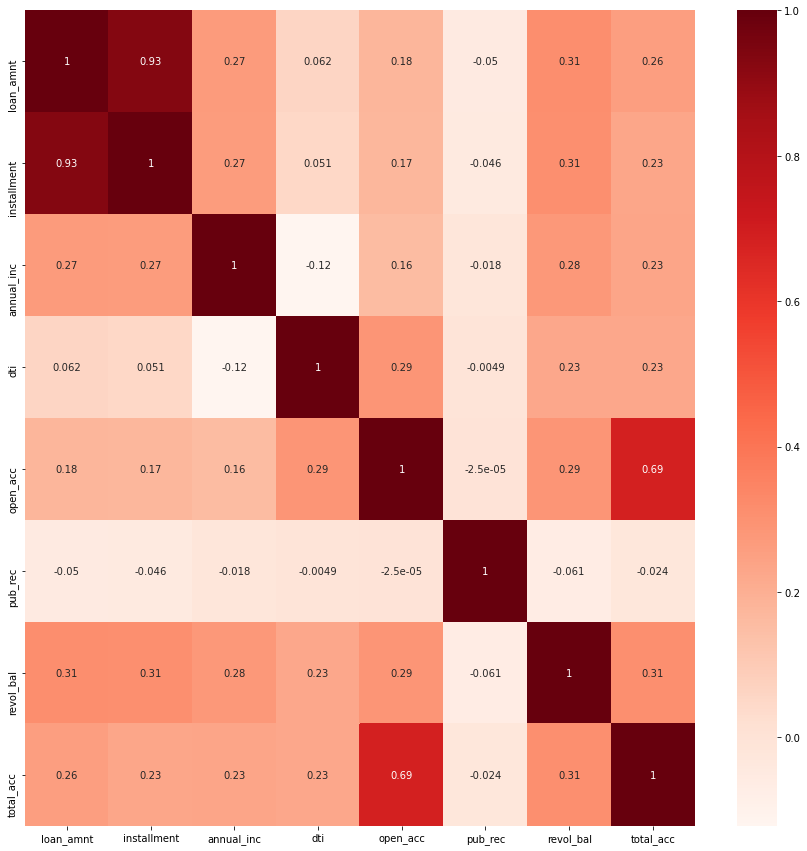

In [35]:
# Correlation 

plt.figure(figsize=(15,15))
sb.heatmap(loan_v1.corr(),cmap="Reds",annot=True)

In [36]:
print ("Rows     : " ,loan_v1.shape[0])
print ("Columns  : " ,loan_v1.shape[1])
print ("\nFeatures : \n" ,loan_v1.columns.tolist())
print ("\nMissing values :  ", loan_v1.isnull().sum().values.sum())
print ("\nPercentage of rows deleted : {}%  ".format(round(100-100*len(loan_v1.index)/len(loan.index),2)))

Rows     :  38516
Columns  :  22

Features : 
 ['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'zip_code', 'addr_state', 'dti', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']

Missing values :   0

Percentage of rows deleted : 3.02%  


## Data Cleaning - Standardizing Values, Units & Text

In [37]:
loan_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38516 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            38516 non-null  int64  
 1   term                 38516 non-null  object 
 2   int_rate             38516 non-null  object 
 3   installment          38516 non-null  float64
 4   grade                38516 non-null  object 
 5   sub_grade            38516 non-null  object 
 6   emp_length           38516 non-null  object 
 7   home_ownership       38516 non-null  object 
 8   annual_inc           38516 non-null  float64
 9   verification_status  38516 non-null  object 
 10  issue_d              38516 non-null  object 
 11  loan_status          38516 non-null  object 
 12  purpose              38516 non-null  object 
 13  zip_code             38516 non-null  object 
 14  addr_state           38516 non-null  object 
 15  dti                  38516 non-null 

In [38]:
pd.options.display.max_columns = None 
loan_v1.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc
0,5000,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,Jan-85,3,0,13648,83.70%,9
1,2500,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,Apr-99,3,0,1687,9.40%,4
2,2400,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,Nov-01,2,0,2956,98.50%,10
3,10000,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,Feb-96,10,0,5598,21%,37
5,5000,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,852xx,AZ,11.20,Nov-04,9,0,7963,28.30%,12


In [39]:
#Removing ' months' from term 

loan_v1['term'] = loan_v1['term'].map(lambda x:x.strip(' months'))

loan_v1['term']  = loan_v1['term'].astype(int)

#Removing '%'' from int_rate

loan_v1['int_rate'] = loan_v1['int_rate'].map(lambda x:x.strip('%'))
loan_v1['int_rate']  = loan_v1['int_rate'].astype(float)

#Removing '%'' from revol_util
loan_v1['revol_util'] = loan_v1['revol_util'].map(lambda x:x.strip('%'))
loan_v1['revol_util']  = loan_v1['revol_util'].astype(float)

#Removing 'xx' from zip_code
loan_v1['zip_code'] = loan_v1['zip_code'].map(lambda x:x.strip('xx'))
loan_v1['zip_code']  = loan_v1['zip_code'].astype(int)

# Standardizing Date
# issue_dt and earliest_cr_line are splited in years and months

In [40]:
#Deriving column emp_length based on the business_rule in Data Dictionary 

#Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

loan_v1['emp_length'] = loan_v1['emp_length'].map(lambda x:x.split('+ years')[0] if x == '10+ years' else ('0' if x == '< 1 year' else(x.strip(' years'))))
loan_v1['emp_length']  = loan_v1['emp_length'].astype(int)

In [41]:
loan_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38516 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            38516 non-null  int64  
 1   term                 38516 non-null  int64  
 2   int_rate             38516 non-null  float64
 3   installment          38516 non-null  float64
 4   grade                38516 non-null  object 
 5   sub_grade            38516 non-null  object 
 6   emp_length           38516 non-null  int64  
 7   home_ownership       38516 non-null  object 
 8   annual_inc           38516 non-null  float64
 9   verification_status  38516 non-null  object 
 10  issue_d              38516 non-null  object 
 11  loan_status          38516 non-null  object 
 12  purpose              38516 non-null  object 
 13  zip_code             38516 non-null  int64  
 14  addr_state           38516 non-null  object 
 15  dti                  38516 non-null 

In [42]:
loan_v1.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc
0,5000,36,10.65,162.87,B,B2,10,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860,AZ,27.65,Jan-85,3,0,13648,83.7,9
1,2500,60,15.27,59.83,C,C4,0,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309,GA,1.00,Apr-99,3,0,1687,9.4,4
2,2400,36,15.96,84.33,C,C5,10,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606,IL,8.72,Nov-01,2,0,2956,98.5,10
3,10000,36,13.49,339.31,C,C1,10,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917,CA,20.00,Feb-96,10,0,5598,21.0,37
5,5000,36,7.90,156.46,A,A4,3,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,852,AZ,11.20,Nov-04,9,0,7963,28.3,12


# Data Cleaning - Outlier Analysis

In [43]:
import warnings
warnings.filterwarnings("ignore")

In [44]:
# Considering values greater than Q3+1.5*IQR as Outliers 
# Performing Outlier treatment provided we got approval from Business
# If values are > Q3+1.5*IQR replacing it with Q3+1.5*IQR and if values are less than  Q1-1.5*IQR replacing it with Q1-1.5*IQR
# Checking annual_income column for ouliers

print("\nBefore Outlier treatment\n",loan_v1['annual_inc'].describe())
print("\nBefore Outlier treatment shape of the dataset : ", loan_v1.shape)

Q3, Q1 = np.percentile(loan_v1['annual_inc'], [75,25])
IQR = Q3-Q1
lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
max_value = loan_v1['annual_inc'].max()
min_value = loan_v1['annual_inc'].min()
print("Columns Name : {} Q1 Value : {} , Q3 value : {} , IQR value : {} , lower_bound : {} ,upper_bound : {} , max : {} , min : {}\n ".format('annual_inc',Q1,Q3,IQR,lower_bound,upper_bound,max_value,min_value))
loan_v1['annual_inc'][loan_v1['annual_inc']<=lower_bound] = lower_bound
loan_v1['annual_inc'][loan_v1['annual_inc']>=upper_bound] = upper_bound

print("After outlier Treatment\n",loan_v1['annual_inc'].describe())


Before Outlier treatment
 count    3.851600e+04
mean     6.881343e+04
std      6.422256e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.900000e+04
75%      8.200000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

Before Outlier treatment shape of the dataset :  (38516, 22)
Columns Name : annual_inc Q1 Value : 40000.0 , Q3 value : 82000.0 , IQR value : 42000.0 , lower_bound : -23000.0 ,upper_bound : 145000.0 , max : 6000000.0 , min : 4000.0
 
After outlier Treatment
 count     38516.000000
mean      65082.226850
std       32644.678411
min        4000.000000
25%       40000.000000
50%       59000.000000
75%       82000.000000
max      145000.000000
Name: annual_inc, dtype: float64


In [45]:
# Considering values greater than Q3+1.5*IQR as Outliers 
# Performing Outlier treatment provided we got approval from Business
# If values are > Q3+1.5*IQR replacing it with Q3+1.5*IQR and if values are less than  Q1-1.5*IQR replacing it with Q1-1.5*IQR
# Checking revol_bal column for ouliers

print("\nBefore Outlier treatment\n ",loan_v1['revol_bal'].describe())
print("\nBefore Outlier treatment shape of the dataset : ", loan_v1.shape)

Q3, Q1 = np.percentile(loan_v1['revol_bal'], [75,25])
IQR = Q3-Q1
lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
max_value = loan_v1['revol_bal'].max()
min_value = loan_v1['revol_bal'].min()
print("Columns Name : {} Q1 Value : {} , Q3 value : {} , IQR value : {} , lower_bound : {} ,upper_bound : {} , max : {} , min : {}\n ".format('revol_bal',Q1,Q3,IQR,lower_bound,upper_bound,max_value,min_value))
loan_v1['revol_bal'][loan_v1['revol_bal']<=lower_bound] = lower_bound
loan_v1['revol_bal'][loan_v1['revol_bal']>=upper_bound] = upper_bound

print("After Outlier Treatment\n",loan_v1['revol_bal'].describe())

print("\nAfter Outlier removal shape of the dataset : ", loan_v1.shape)


Before Outlier treatment
  count     38516.000000
mean      13307.830616
std       15870.144756
min           0.000000
25%        3667.000000
50%        8778.500000
75%       16931.500000
max      149588.000000
Name: revol_bal, dtype: float64

Before Outlier treatment shape of the dataset :  (38516, 22)
Columns Name : revol_bal Q1 Value : 3667.0 , Q3 value : 16931.5 , IQR value : 13264.5 , lower_bound : -16229.75 ,upper_bound : 36828.25 , max : 149588 , min : 0
 
After Outlier Treatment
 count    38516.000000
mean     11829.487778
std      10450.367506
min          0.000000
25%       3667.000000
50%       8778.500000
75%      16931.500000
max      36828.250000
Name: revol_bal, dtype: float64

After Outlier removal shape of the dataset :  (38516, 22)


In [46]:
loan_v1.describe()

,loan_amnt,term,int_rate,installment,emp_length,annual_inc,zip_code,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc
count,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.000000,38516.00000,38516.000000
mean,11055.671669,41.903417,11.926877,322.700611,5.078461,65082.226850,502.866108,13.276922,9.281364,0.055457,11829.487778,48.70412,22.068076
std,7348.558289,10.336075,3.690111,208.664493,3.603167,32644.678411,329.921343,6.671308,4.399821,0.237885,10450.367506,28.36331,11.422373
min,500.000000,36.000000,5.420000,15.690000,0.000000,4000.000000,7.000000,0.000000,2.000000,0.000000,0.000000,0.00000,2.000000
25%,5325.000000,36.000000,8.940000,165.740000,2.000000,40000.000000,200.000000,8.140000,6.000000,0.000000,3667.000000,25.20000,13.000000
50%,9600.000000,36.000000,11.710000,278.150000,4.000000,59000.000000,450.000000,13.370000,9.000000,0.000000,8778.500000,49.10000,20.000000
75%,15000.000000,36.000000,14.350000,426.100000,9.000000,82000.000000,852.000000,18.560000,12.000000,0.000000,16931.500000,72.30000,29.000000
max,35000.000000,60.000000,24.400000,1305.190000,10.000000,145000.000000,999.000000,29.990000,44.000000,4.000000,36828.250000,99.90000,90.000000


In [47]:
print ("Rows     : " ,loan_v1.shape[0])
print ("Columns  : " ,loan_v1.shape[1])
print ("\nFeatures : \n" ,loan_v1.columns.tolist())
print ("\nMissing values :  ", loan_v1.isnull().sum().values.sum())
print ("\nPercentage of rows deleted : {}%  ".format(round(100-100*len(loan_v1.index)/len(loan.index),2)))

Rows     :  38516
Columns  :  22

Features : 
 ['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'zip_code', 'addr_state', 'dti', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']

Missing values :   0

Percentage of rows deleted : 3.02%  


# Univariate Analysis

In [48]:
cat = [] # Categorical Variables
con = [] # Continous Variables
for i in loan_v1.columns:
    if loan_v1[i].dtype == 'object':
        cat.append(i)
    else:
        con.append(i)
    
print("\nList of Categorical Variables:\n\n",cat)
print("\nList of Continous Variables :\n\n",con)


List of Categorical Variables:

 ['grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'earliest_cr_line']

List of Continous Variables :

 ['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'zip_code', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']


In [49]:
# Converting Categorical column loan_status by replacing Fully Paid as 1 and Charged Off as 0

print(loan_v1['loan_status'].value_counts())

loan_v1['loan_status'] = loan_v1['loan_status'].map(lambda x : '1' if x == 'Fully Paid' else '0')

print(loan_v1['loan_status'].value_counts())


Fully Paid     32907
Charged Off     5609
Name: loan_status, dtype: int64
1    32907
0     5609
Name: loan_status, dtype: int64


In [50]:
import warnings

warnings.filterwarnings("ignore")

plt.style.use("ggplot")

# Univariate Analysis - Categorical Variables

In [51]:
def univariate_categorical(category_name,kind='NA',x_size=6,y_size=6):
    
    """
    kind = 'pow' : will be use to show Power law distribution plot
    x_size = "Figure xaxis size"
    y_size = "Figure yaxis size"
    """
    
   
    print("{}\n".format(category_name))
    
    univariate_cat = pd.DataFrame(loan_v1[category_name].value_counts())
    
    univariate_cat.reset_index(level=0, inplace=True)
    
    univariate_cat.rename(columns = {'index':category_name,category_name:'frequency'},inplace =True)

    if kind == 'pow':
        
        # add rank column to below 
    
        univariate_cat['Rank'] = univariate_cat['frequency'].rank(ascending=False)
    
        print(univariate_cat)
    
        univariate_cat['frequency_log'] = np.log2(univariate_cat['frequency'])
    
        univariate_cat['Rank_log'] = np.log2(univariate_cat['Rank'])
    
        plt.plot(univariate_cat['Rank'],univariate_cat['frequency_log'])
    
        plt.title("Rank vs Frequency - Power Law Distribution - purpose")
    
        plt.xlabel("Log2(Rank)")
    
        plt.ylabel("Log2(Frequency)")
    
        plt.show()
    
    else:
        print(loan_v1[category_name].value_counts())
        
    plt.figure(figsize=(x_size,y_size))
    
    loan_v1[category_name].value_counts().plot.barh()
    
    plt.title(category_name)
    
    
    plt.show()
    
    plt.figure(figsize=(x_size,y_size))
    
    loan_v1[category_name].value_counts().plot.pie(shadow=True,autopct='%1.1f%%')
    
    plt.title(category_name)
    
    plt.figure(figsize=(12,12))
    
    plt.show()

grade

  grade  frequency  Rank
0     B      11670   1.0
1     A      10044   2.0
2     C       7819   3.0
3     D       5066   4.0
4     E       2651   5.0
5     F        969   6.0
6     G        297   7.0


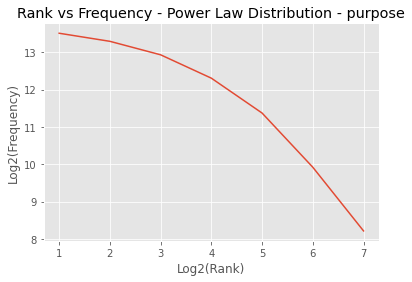

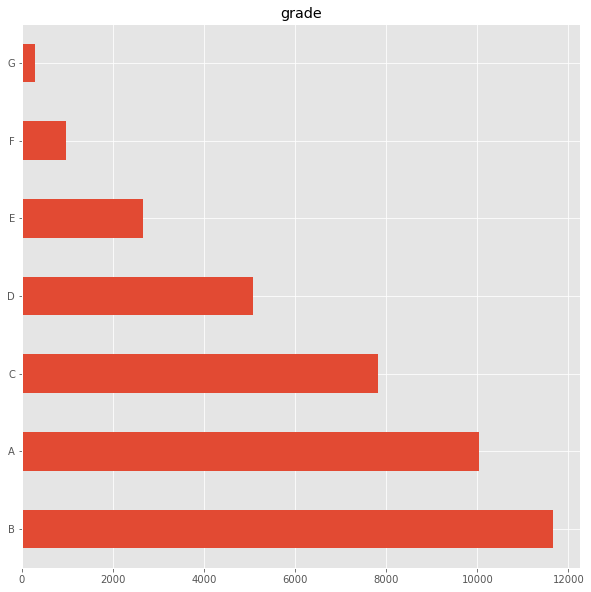

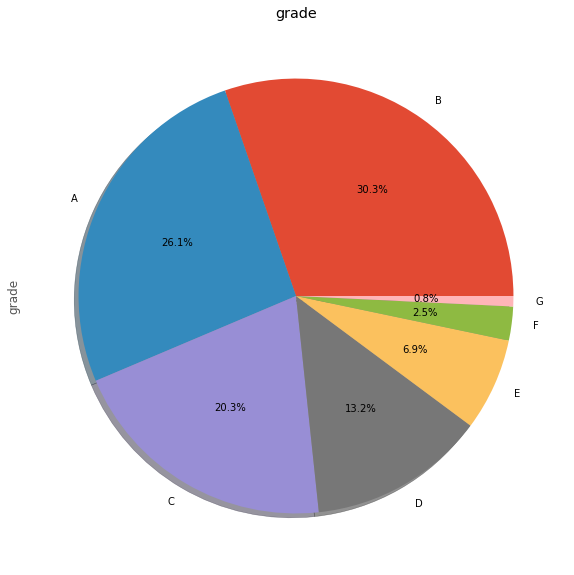

<Figure size 864x864 with 0 Axes>

In [52]:
#grade - unordered Categorical variable analysis

#Excluding Grade B which has constituted to 30.3% of loan application Relative change in grade will decrease in the no of loan application recieved 
# 57.4 % of loan applications are from Grade A & B

univariate_categorical('grade','pow',10,10)

sub_grade

A4    2873
B3    2825
A5    2715
B5    2614
B4    2434
C1    2053
B2    2001
C2    1925
A3    1809
B1    1796
A2    1508
C3    1486
D2    1283
C4    1205
C5    1150
A1    1139
D3    1112
D1     925
D4     916
D5     830
E1     722
E2     611
E3     512
E4     424
E5     382
F1     304
F2     231
F3     174
F4     148
F5     112
G1      93
G2      76
G4      54
G3      45
G5      29
Name: sub_grade, dtype: int64


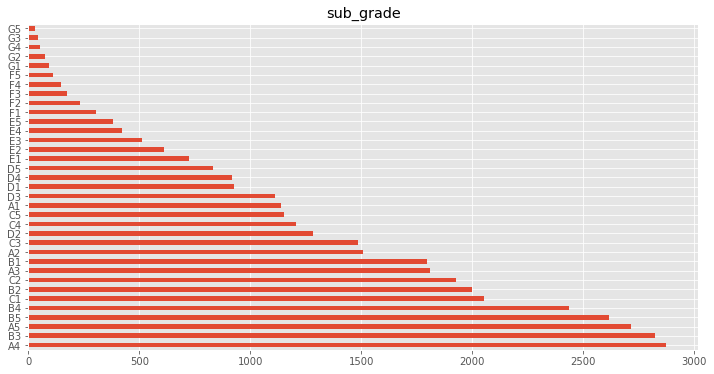

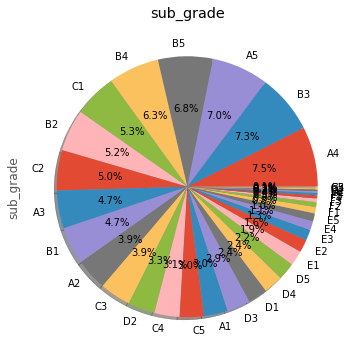

<Figure size 864x864 with 0 Axes>

In [53]:
#sub_grade - ordered Categorical variable analysis
# Highest no of Loan application are received from sub-Grade A4

# 57.4 % of loan applications are from Grade A & B
# 34.9% of total applications belongs to sub category A - A4, A5 & B - B3,B4,B5

univariate_categorical('sub_grade',12,12)

loan_status

1    32907
0     5609
Name: loan_status, dtype: int64


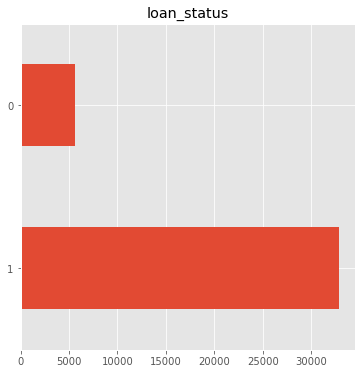

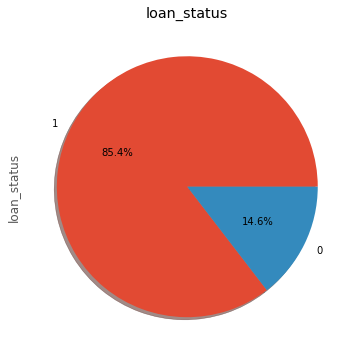

<Figure size 864x864 with 0 Axes>

In [54]:
# loan_status
#Analysis around 14.6%  of applications are Charged off
# 85.4 % of loans are fully paid

univariate_categorical('loan_status')

home_ownership

  home_ownership  frequency  Rank
0           RENT      18444   1.0
1       MORTGAGE      17006   2.0
2            OWN       2967   3.0
3          OTHER         96   4.0
4           NONE          3   5.0


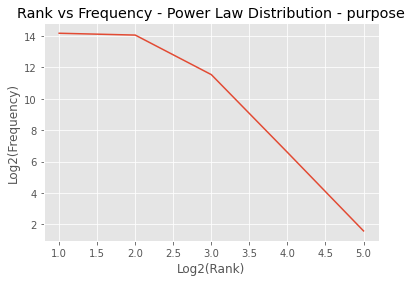

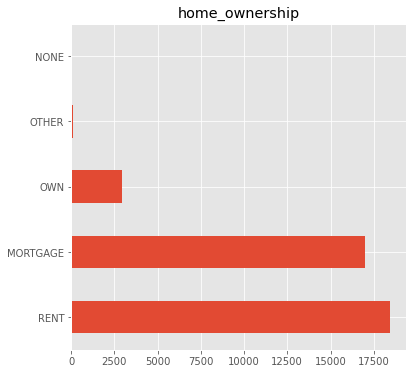

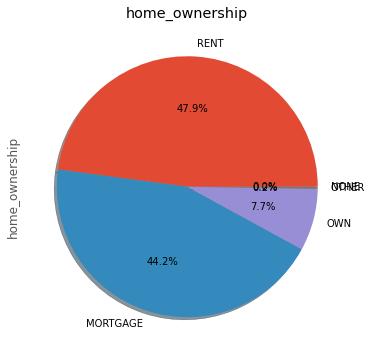

<Figure size 864x864 with 0 Axes>

In [55]:
# Featured Columns home_ownership - unordered categorical variable

#Power Law Distribution 

# Analysis Result - A relative change in home_ownership loan type result in proportional change in loan applied
# i.e. The Most of loan applied by the Customers are usually living on Rent i.e 47.9% and then having Mortgage
# i.e 44.2%

univariate_categorical('home_ownership','pow')

# # Checking Relationship between home_ownership and loan_status

# sb.countplot(loan_v1['loan_status'],hue=loan_v1['home_ownership'])

verification_status

  verification_status  frequency  Rank
0        Not Verified      16660   1.0
1            Verified      12194   2.0
2     Source Verified       9662   3.0


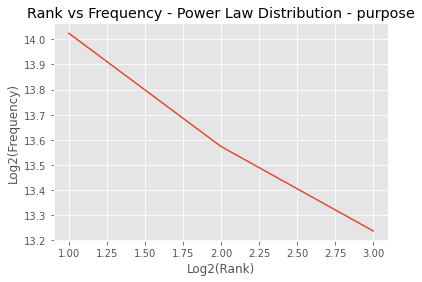

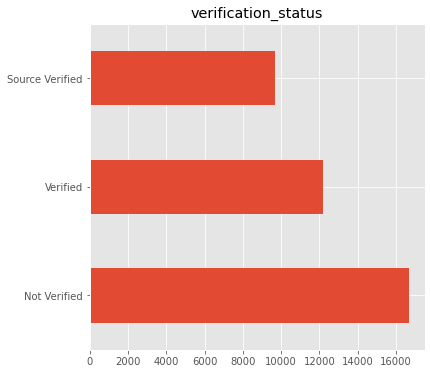

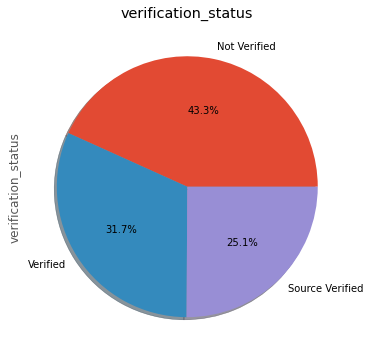

<Figure size 864x864 with 0 Axes>

In [56]:
# Featured Columns verification_status - unordered categorical variable

# Analysis Result - Maximum no around 44.3 % of loan applications are present for which the verification_status is not verified

univariate_categorical('verification_status','pow')

# # # Checking Relationship between home_ownership and loan_status

# sb.countplot(loan_v1['loan_status'],hue=loan_v1['verification_status'])

purpose

               purpose  frequency  Rank
0   debt_consolidation      18040   1.0
1          credit_card       5024   2.0
2                other       3850   3.0
3     home_improvement       2870   4.0
4       major_purchase       2143   5.0
5       small_business       1751   6.0
6                  car       1497   7.0
7              wedding        925   8.0
8              medical        679   9.0
9               moving        574  10.0
10            vacation        374  11.0
11               house        367  12.0
12         educational        320  13.0
13    renewable_energy        102  14.0


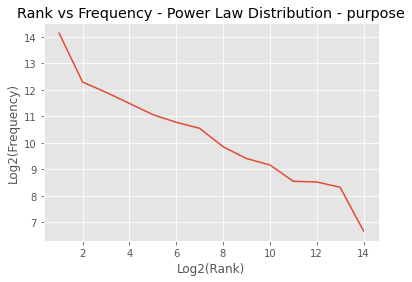

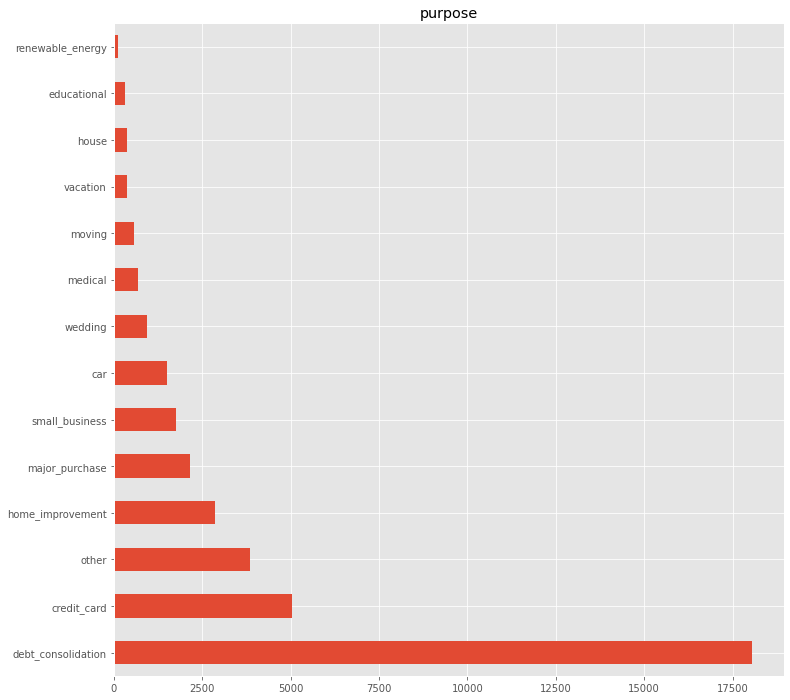

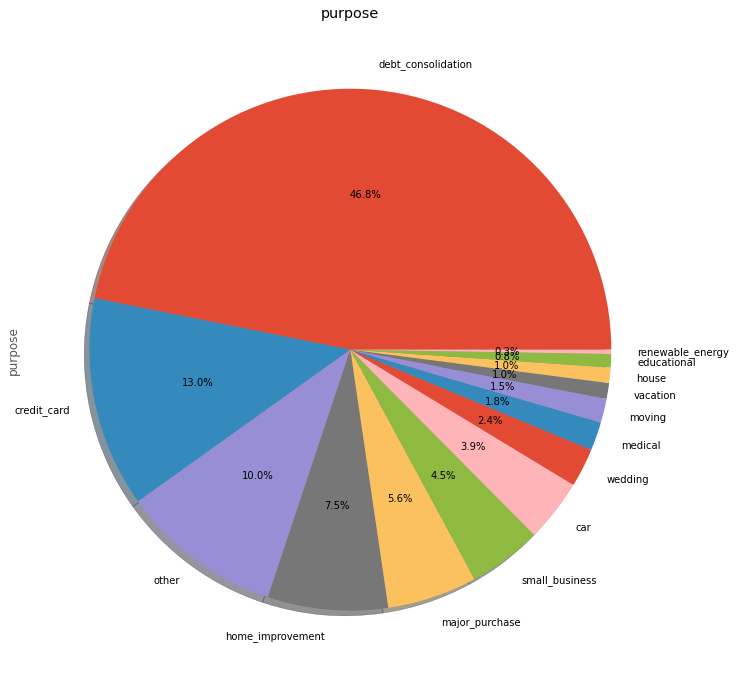

<Figure size 864x864 with 0 Axes>

In [57]:
# Featured Columns purpose - unordered categorical variable

# The relative change change in purpose will result in no of loans applied
# Majority of loans were taken for Debt Consolidation around 46.8 %

univariate_categorical('purpose','pow',12,12)

addr_state

   addr_state  frequency  Rank
0          CA       6941   1.0
1          NY       3696   2.0
2          FL       2778   3.0
3          TX       2654   4.0
4          NJ       1785   5.0
5          IL       1477   6.0
6          PA       1464   7.0
7          VA       1368   8.0
8          GA       1359   9.0
9          MA       1296  10.0
10         OH       1173  11.0
11         MD       1021  12.0
12         AZ        845  13.0
13         WA        817  14.0
14         CO        765  15.0
15         NC        749  16.0
16         CT        726  17.0
17         MI        704  18.0
18         MO        668  19.0
19         MN        602  20.0
20         NV        478  21.0
21         SC        459  22.0
22         WI        439  23.0
23         OR        434  24.5
24         AL        434  24.5
25         LA        427  26.0
26         KY        311  27.0
27         OK        286  28.0
28         KS        254  29.0
29         UT        252  30.0
30         AR        234  3

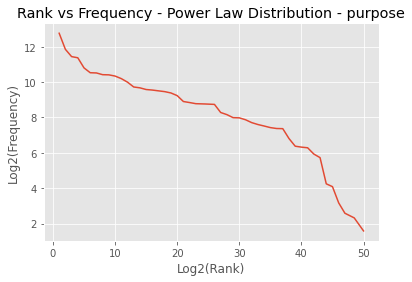

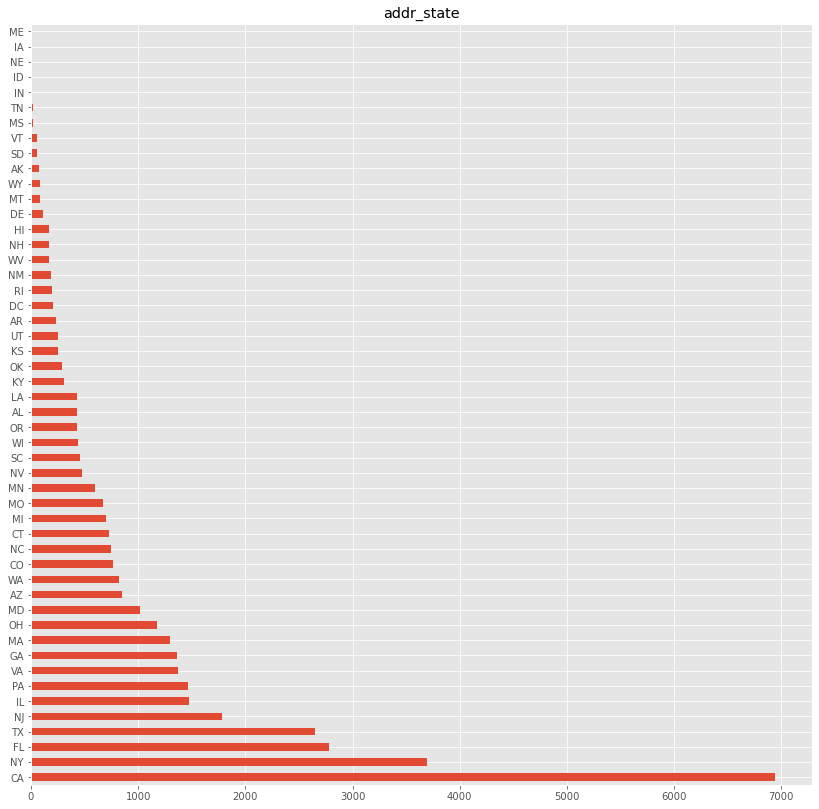

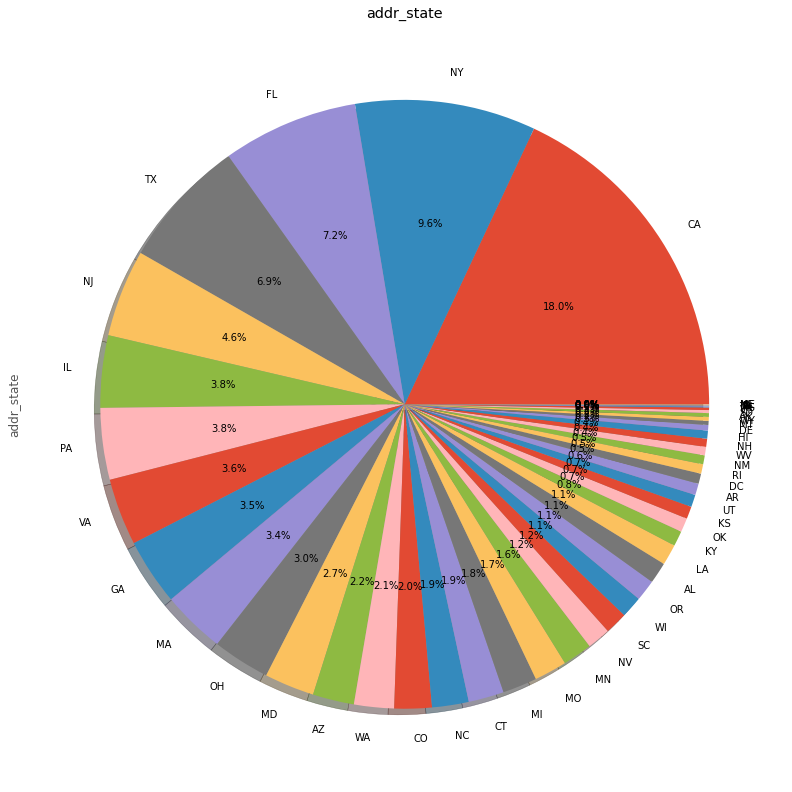

<Figure size 864x864 with 0 Axes>

In [58]:
#addr_state - unordered Categorical variable analysis

# Power Law distribution
# The relative change is state will result in no of loans applied to that state
# Analysis : Most no of loans are applied from addr_state "CA" i.e 18 % of totall loan applied

univariate_categorical('addr_state','pow',14,14)



In [59]:
#issue_d

# Splitting issue_d to Month (issue_date_month) and Year (issue_date_year) for further analysis

#univariate_categorical('issue_d','pow',14,14)

# loan_v1['issue_d'].head()

# loan_v1['issue_date_month'] = loan_v1['issue_d'].map(lambda x:x[0:3])
# loan_v1['issue_date_year'] = loan_v1['issue_d'].map(lambda x:x[4:6])

loan_v1['issue_d'] = pd.to_datetime(loan_v1['issue_d'],format='%b-%y')

loan_v1['issue_date_year'] = loan_v1['issue_d'].apply(lambda x : x.year)

loan_v1['issue_date_month'] = loan_v1['issue_d'].apply(lambda x : x.month)


issue_date_month

    issue_date_month  frequency  Rank
0                 12       4211   1.0
1                 11       4002   2.0
2                 10       3755   3.0
3                  9       3496   4.0
4                  8       3384   5.0
5                  7       3343   6.0
6                  6       3167   7.0
7                  5       2918   8.0
8                  4       2829   9.0
9                  3       2682  10.0
10                 1       2373  11.0
11                 2       2356  12.0


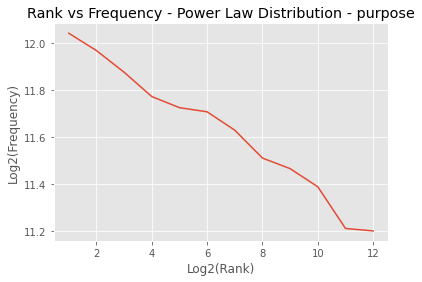

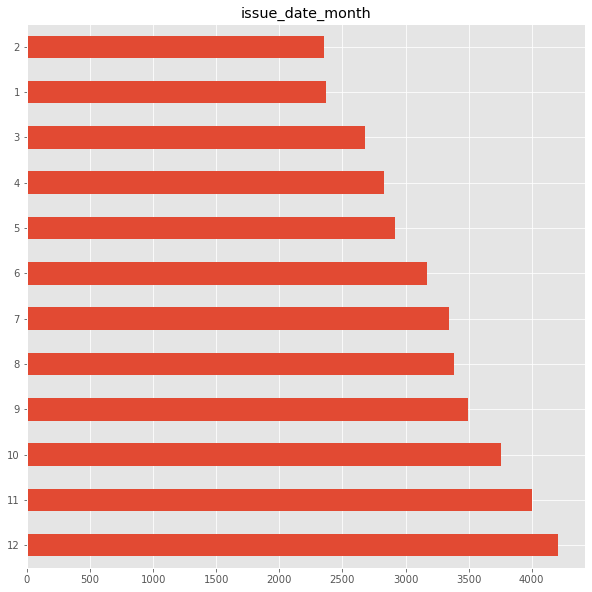

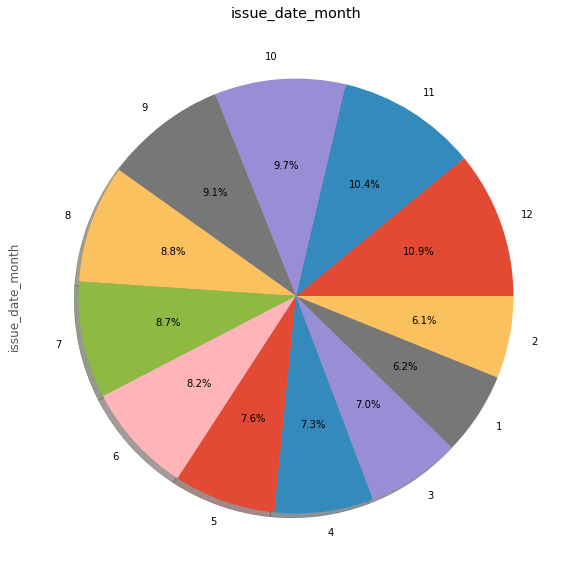

<Figure size 864x864 with 0 Axes>

In [60]:
#issue_date_month analysis ordered categorical variable

# We can see a trend most of the loan application are received in Dec 
# Dec to Jan a continous decrease in the amount of loan application applied except Feb which have more application than Jan

univariate_categorical('issue_date_month','pow',10,10)

issue_date_year

   issue_date_year  frequency  Rank
0             2011      20507   1.0
1             2010      11503   2.0
2             2009       4701   3.0
3             2008       1554   4.0
4             2007        251   5.0


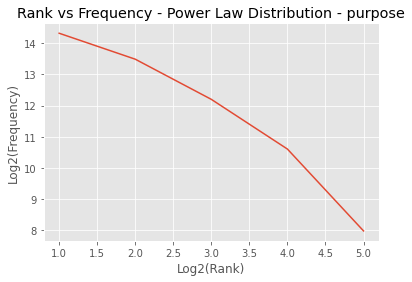

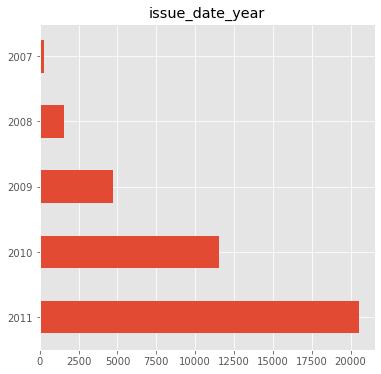

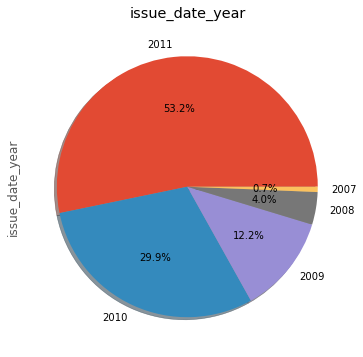

<Figure size 864x864 with 0 Axes>

In [61]:
#issue_date_year analysis ordered categorical variable

#53.2 % of total applications were received in 2011 itself and no of applications are decreasing with no of years
univariate_categorical('issue_date_year','pow',6,6)

In [62]:
#earliest_cr_line 

# Splitting earliest_cr_line to Month (earliest_cr_line_month) and Year (earliest_cr_line_year) for further analysis

# loan_v1['earliest_cr_line'].head()

# loan_v1['earliest_cr_line_month'] = loan_v1['earliest_cr_line'].map(lambda x:x[0:3])
# loan_v1['earliest_cr_line_year'] = loan_v1['earliest_cr_line'].map(lambda x:x[4:6])

loan_v1['earliest_cr_line'] = pd.to_datetime(loan_v1['earliest_cr_line'],format='%b-%y')

loan_v1['earliest_cr_line_year'] = loan_v1['earliest_cr_line'].apply(lambda x : x.year)

loan_v1['earliest_cr_line_month'] = loan_v1['earliest_cr_line'].apply(lambda x : x.month)

earliest_cr_line_month

10    3959
12    3945
11    3807
9     3492
1     3328
8     3210
7     2964
6     2859
5     2820
2     2779
3     2708
4     2645
Name: earliest_cr_line_month, dtype: int64


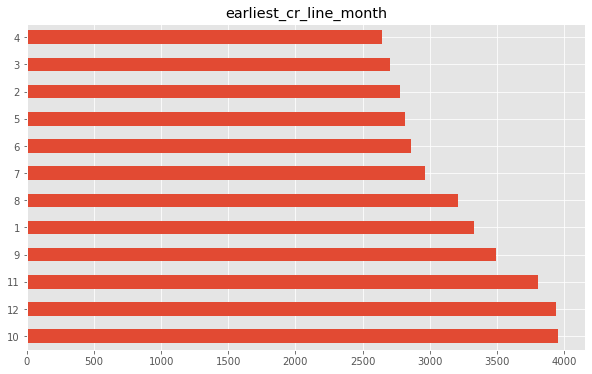

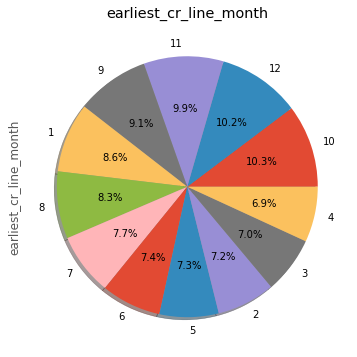

<Figure size 864x864 with 0 Axes>

In [63]:
#earliest_cr_line_month

# Its seems to be distributed across month no much information deduction from univariate analysis except max and min no of loans applied ine which yearexcept max and min no of loans applied ine which month

univariate_categorical('earliest_cr_line_month',10,10)

earliest_cr_line_year

2000    3158
1999    2895
1998    2770
2001    2459
1997    2384
1996    2200
1995    2075
1994    1943
2002    1886
2003    1807
2004    1722
1993    1460
2005    1460
2006    1145
1992    1028
1990    1004
1991     945
1989     833
1988     709
2007     695
1987     590
1986     478
1985     439
1984     394
1983     322
1982     215
1981     181
1980     175
1978     161
1979     157
2008     152
1977     112
1976      93
1975      83
1974      62
1973      61
1972      49
1970      47
1971      45
1969      37
2068      19
2067      18
2066      11
2063      10
2065       8
2064       6
2062       5
2054       2
2061       2
2050       1
2056       1
2059       1
2046       1
Name: earliest_cr_line_year, dtype: int64


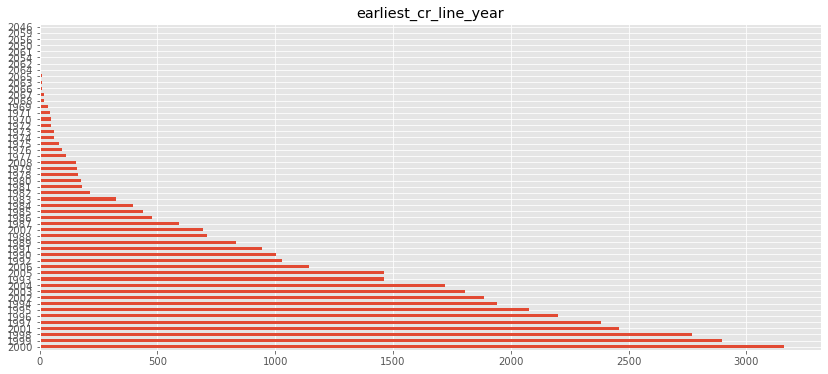

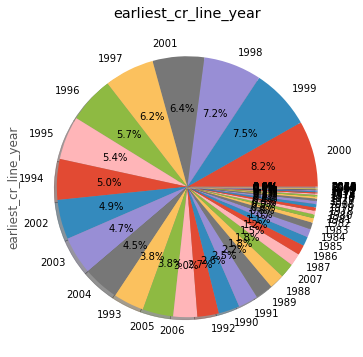

<Figure size 864x864 with 0 Axes>

In [64]:
#earliest_cr_line_year

#no much information deducted from univariate analysis except max and min no of loans applied ine which year

univariate_categorical('earliest_cr_line_year',14,14)

# Univariate Analysis - Continous Variable

In [65]:
def univariate_continous(continous_variable,x_size=6,y_size=6,color_v="g",bin="auto"):
    """
    continous_variabe: Continous featured column name
    bins : no of bins
    x_size : Figure xaxis size
    y_size : Figure yaxis size
    color_v : color parameter to the plot
    
    Assumption : Subject to business approval we will be removing values greater than greater than Q3 + 1.5 *IQR  hence Calculating Third and First Quartile values
    """
    
    print("\n Variable : {} \n\nSummary : \n\n{}\n\n".format(continous_variable,loan_v1[continous_variable].describe([.25, .5, .75,.95])))
    
    Q3, Q1 = np.percentile(loan_v1[continous_variable], [75,0])
    IQR = Q3 - Q1
    
    print("\n Q3  Percentile Value : {} and Q1 Value : {} and IQR Value : {}\n".format(Q3,Q1,IQR))
    #print("\n If values are are greater than Q3 + 1.5 *IQR : {} we will consider them as outliers ".format(Q3 + 1.5 *IQR))
    
    plt.figure(figsize=(x_size,y_size))
    
    plt.boxplot(loan_v1[continous_variable])
    
    plt.title(continous_variable)
    
    plt.xlabel(continous_variable)
    
    plt.show()
    
    plt.hist(loan_v1[continous_variable],color=color_v,bins=bin,edgecolor='red')
    
    plt.title(continous_variable)
    
    plt.xlabel(continous_variable)
    
    plt.show()
    
    sb.distplot(loan_v1[continous_variable],kde=True,color=color_v,bins=bin)
    
    plt.title(continous_variable)
    
    plt.xlabel(continous_variable)
    
    plt.show()
    
    

In [66]:
#List of Continous variables

print(con)

['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'zip_code', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']



 Variable : loan_amnt 

Summary : 

count    38516.000000
mean     11055.671669
std       7348.558289
min        500.000000
25%       5325.000000
50%       9600.000000
75%      15000.000000
95%      25000.000000
max      35000.000000
Name: loan_amnt, dtype: float64



 Q3  Percentile Value : 15000.0 and Q1 Value : 500.0 and IQR Value : 14500.0



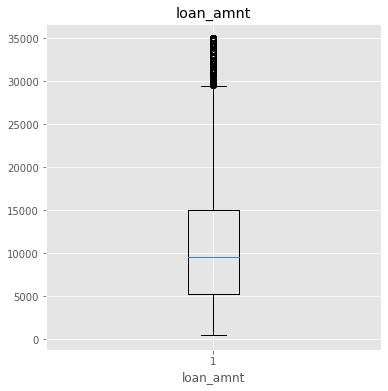

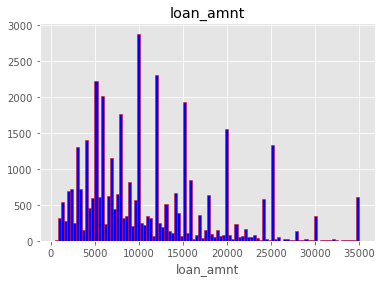

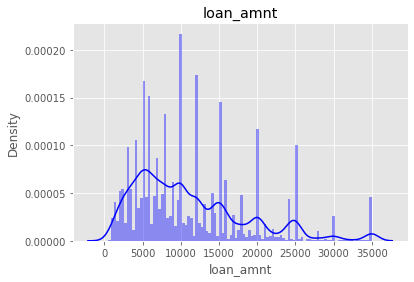

Percentage of total loan applicants in Q1 & Q3  range : 52.63 %
Percentage of total loan applicants greater than Q3  range : 22.37 %
Percentage of total loan applicants less than Q1  range : 25.0 %


10000    2807
12000    2247
5000     2022
6000     1885
15000    1837
Name: loan_amnt, dtype: int64

In [67]:
#loan_amnt:

#Analysis 

# min : 500.00 , max : 35000 , No outliers based on the Outlier Business Rule Assumption 

# median : 9600, mean : 11055.671669 ,std : 7348.558289

# Maximum no of loans are applied for loan_amnt : 10000 around 2807 loan applicants

#Percentage of total loan applicants in Q1 & Q3  range : 52.63 %
#Percentage of total loan applicants greater than Q3  range : 22.37 %
#Percentage of total loan applicants less than Q1  range : 25.0 %


univariate_continous('loan_amnt',color_v='b',bin=100)

query = sqldf('select count(*) as loan_amnt_freq from loan_v1 where loan_amnt between 5325 and 15000')

print("Percentage of total loan applicants in Q1 & Q3  range : {} %".format(round(100*query['loan_amnt_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as loan_amnt_freq from loan_v1 where loan_amnt > 15000')

print("Percentage of total loan applicants greater than Q3  range : {} %".format(round(100*query['loan_amnt_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as loan_amnt_freq from loan_v1 where loan_amnt < 5325')

print("Percentage of total loan applicants less than Q1  range : {} %".format(round(100*query['loan_amnt_freq'][0]/len(loan_v1.index),2)))

loan_v1['loan_amnt'].value_counts().head()



 Variable : term 

Summary : 

count    38516.000000
mean        41.903417
std         10.336075
min         36.000000
25%         36.000000
50%         36.000000
75%         36.000000
95%         60.000000
max         60.000000
Name: term, dtype: float64



 Q3  Percentile Value : 36.0 and Q1 Value : 36.0 and IQR Value : 0.0



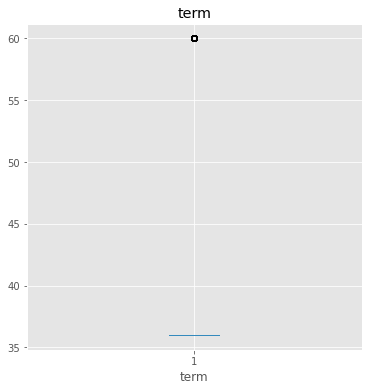

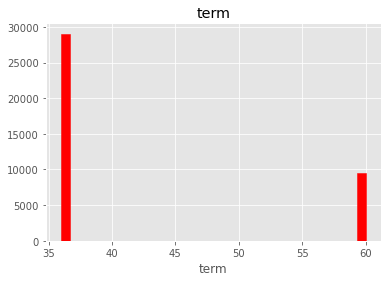

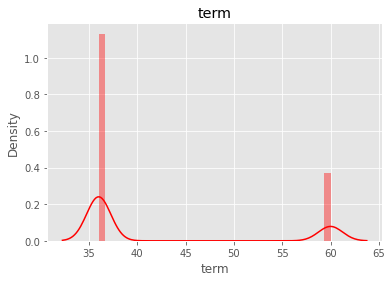

36    29042
60     9474
Name: term, dtype: int64

In [68]:
#term

# Based on the Analysis there are two loan terms exits 36 & 60 

# Maximum number of loans has been applied for the term 36 months

univariate_continous('term',color_v='r',bin=36)

loan_v1['term'].value_counts()


 Variable : int_rate 

Summary : 

count    38516.000000
mean        11.926877
std          3.690111
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
95%         18.300000
max         24.400000
Name: int_rate, dtype: float64



 Q3  Percentile Value : 14.35 and Q1 Value : 5.42 and IQR Value : 8.93



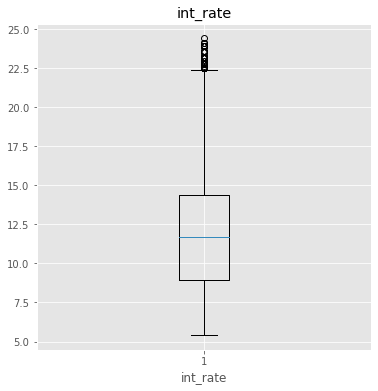

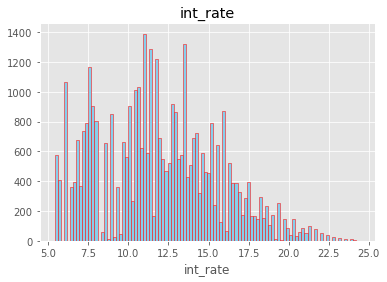

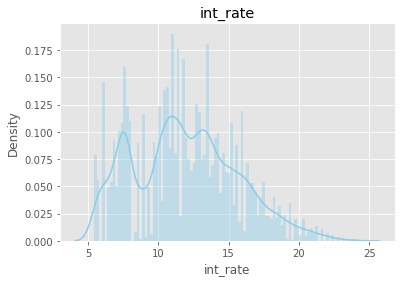

Percentage of total loan applicants in Q1 & Q3 interest rate range : 51.36 %
Percentage of total loan applicants greater than Q3 interest rate  range : 25.25 %
Percentage of total loan applicants less than Q1 interest rate  range : 24.7 %


In [69]:
#int_rate

# Maximum no of approved loans are on 10.99 int rate

#Q3  Percentile Value : 14.35 and Q1 Value : 5.42 and IQR Value : 8.93

#Percentage of total loan applicants in Q1 & Q3 interest rate range : 51.36 %
#Percentage of total loan applicants greater than Q3 interest rate  range : 25.25 %
#Percentage of total loan applicants less than Q1 interest rate  range : 24.7 %
    
univariate_continous('int_rate',color_v='skyblue',bin=100)
plt.show()

query = sqldf('select count(*) as loan_int_freq from loan_v1 where int_rate between 8.9 and 14.35')

print("Percentage of total loan applicants in Q1 & Q3 interest rate range : {} %".format(round(100*query['loan_int_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as loan_int_freq from loan_v1 where int_rate >= 14.35')

print("Percentage of total loan applicants greater than Q3 interest rate  range : {} %".format(round(100*query['loan_int_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as loan_int_freq from loan_v1 where int_rate <= 8.9')

print("Percentage of total loan applicants less than Q1 interest rate  range : {} %".format(round(100*query['loan_int_freq'][0]/len(loan_v1.index),2)))



 Variable : installment 

Summary : 

count    38516.000000
mean       322.700611
std        208.664493
min         15.690000
25%        165.740000
50%        278.150000
75%        426.100000
95%        760.820000
max       1305.190000
Name: installment, dtype: float64



 Q3  Percentile Value : 426.1 and Q1 Value : 15.69 and IQR Value : 410.41



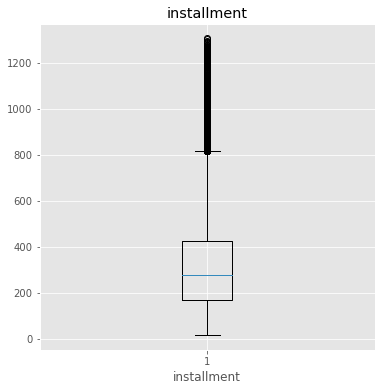

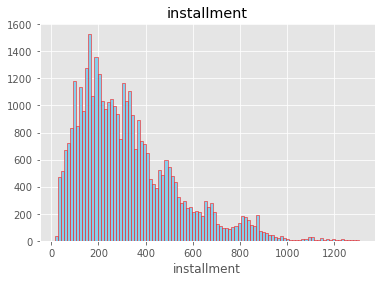

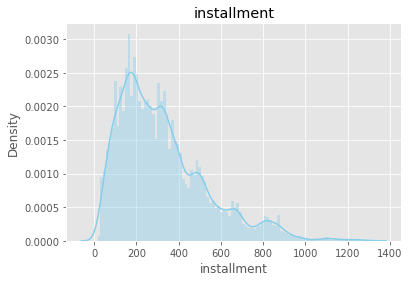

Percentage of total loan applicants where installment between Q1 and Q3 range : 75.05 %
Percentage of total loan applicants greater than Q3 installment : 24.95 %
Percentage of total loan applicants less than Q1 installment : 0.0 %


In [70]:
#installment

#Q3  Percentile Value : 426.1 and Q1 Value : 15.69 and IQR Value : 410.41

#Percentage of total loan applicants where installment between Q1 and Q3range : 75.05 %
#Percentage of total loan applicants greater than Q3 installment : 24.95 %
#Percentage of total loan applicants less than Q1 installment : 0.0 %


univariate_continous('installment',color_v='skyblue',bin=100)
plt.show()

query = sqldf('select count(*) as loan_installment_freq from loan_v1 where installment between 15.69 and 426.1')

print("Percentage of total loan applicants where installment between Q1 and Q3 range : {} %".format(round(100*query['loan_installment_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as loan_installment_freq from loan_v1 where installment > 426.1')

print("Percentage of total loan applicants greater than Q3 installment : {} %".format(round(100*query['loan_installment_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as loan_installment_freq from loan_v1 where installment < 15.69')

print("Percentage of total loan applicants less than Q1 installment : {} %".format(round(100*query['loan_installment_freq'][0]/len(loan_v1.index),2)))


 Variable : emp_length 

Summary : 

count    38516.000000
mean         5.078461
std          3.603167
min          0.000000
25%          2.000000
50%          4.000000
75%          9.000000
95%         10.000000
max         10.000000
Name: emp_length, dtype: float64



 Q3  Percentile Value : 9.0 and Q1 Value : 0.0 and IQR Value : 9.0



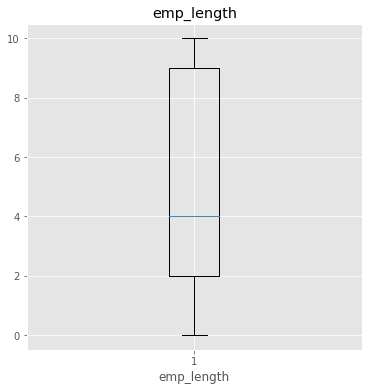

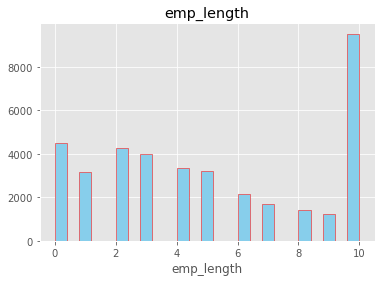

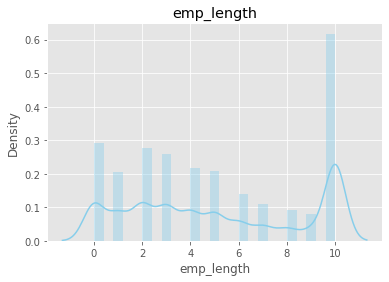

Percentage of total loan applicants when length of employment between Q1 and Q3 : 55.42 %
Percentage of total loan applicants when length of employment greater than Q3 : 24.7 %
Percentage of total loan applicants when length of employment less than Q1 : 19.88 %


10    9515
Name: emp_length, dtype: int64

In [71]:
# emp_length

#Percentage of total loan applicants when length of employment between Q1 and Q3 : 55.42 %
#Percentage of total loan applicants when length of employment greater than Q3 : 24.7 %
#Percentage of total loan applicants when length of employment less than Q1 : 19.88 %
    
# Max no of loans applied  by the employee whose emp_length is greater than 10 years

univariate_continous('emp_length',color_v='skyblue')
plt.show()

query = sqldf('select count(*) as emp_length_freq from loan_v1 where emp_length between 2 and 9')

print("Percentage of total loan applicants when length of employment between Q1 and Q3 : {} %".format(round(100*query['emp_length_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as emp_length_freq from loan_v1 where emp_length > 9')

print("Percentage of total loan applicants when length of employment greater than Q3 : {} %".format(round(100*query['emp_length_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as emp_length_freq from loan_v1 where emp_length < 2')

print("Percentage of total loan applicants when length of employment less than Q1 : {} %".format(round(100*query['emp_length_freq'][0]/len(loan_v1.index),2)))

loan_v1['emp_length'].value_counts().head(1)


 Variable : annual_inc 

Summary : 

count     38516.000000
mean      65082.226850
std       32644.678411
min        4000.000000
25%       40000.000000
50%       59000.000000
75%       82000.000000
95%      140004.000000
max      145000.000000
Name: annual_inc, dtype: float64



 Q3  Percentile Value : 82000.0 and Q1 Value : 4000.0 and IQR Value : 78000.0



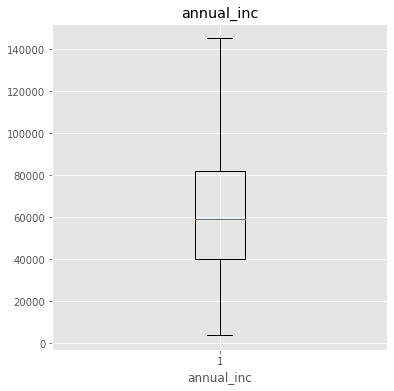

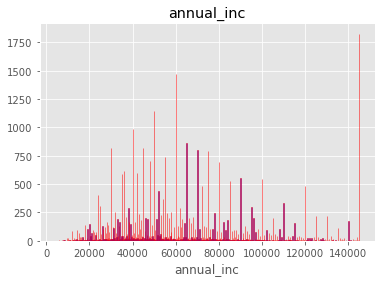

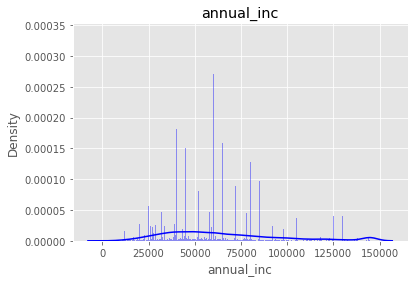

Percentage of total loan applicants where annual Income between Q1 and Q3 : 52.26 %
Percentage of total loan applicants where annual Income greater Q3 : 24.88 %
Percentage of total loan applicants where annual Income  less Q1 : 22.86 %


145000.0    1822
60000.0     1466
50000.0     1027
40000.0      855
45000.0      807
Name: annual_inc, dtype: int64

In [72]:
#annual_inc
# We have some outliers it could be possible their annual income is way ahead of people applied for loan

#Percentage of total loan applicants where annual Income between Q1 and Q3 : 52.26 %
#Percentage of total loan applicants where annual Income greater Q3 : 24.88 %
#Percentage of total loan applicants where annual Income  less Q1 : 22.86 %

univariate_continous('annual_inc',color_v='blue',bin=1000)
plt.show()

query = sqldf('select count(*) as annual_inc_freq from loan_v1 where annual_inc between 40000 and 82000')

print("Percentage of total loan applicants where annual Income between Q1 and Q3 : {} %".format(round(100*query['annual_inc_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as annual_inc_freq from loan_v1 where annual_inc > 82000')

print("Percentage of total loan applicants where annual Income greater Q3 : {} %".format(round(100*query['annual_inc_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as annual_inc_freq from loan_v1 where annual_inc < 40000')

print("Percentage of total loan applicants where annual Income  less Q1 : {} %".format(round(100*query['annual_inc_freq'][0]/len(loan_v1.index),2)))

loan_v1['annual_inc'].value_counts().head()

In [73]:
#zip_code

loan_v1['zip_code'].value_counts()

# Highest no of loan application are applied from the region where the zip code = 100

query = sqldf('select count(*) , zip_code from loan_v1 group by zip_code order by count(*) desc')

query.head()


,count(*),zip_code
0,583,100
1,531,945
2,502,112
3,493,606
4,454,70


In [74]:
con

['loan_amnt',
 'term',
 'int_rate',
 'installment',
 'emp_length',
 'annual_inc',
 'zip_code',
 'dti',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc']


 Variable : dti 

Summary : 

count    38516.000000
mean        13.276922
std          6.671308
min          0.000000
25%          8.140000
50%         13.370000
75%         18.560000
95%         23.800000
max         29.990000
Name: dti, dtype: float64



 Q3  Percentile Value : 18.56 and Q1 Value : 0.0 and IQR Value : 18.56



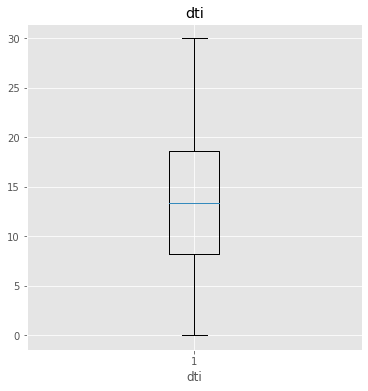

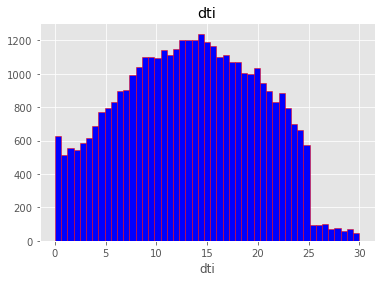

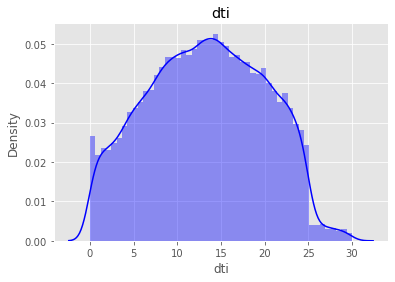

Percentage of total loan applicants where Debt to income ratio between Q1 and Q3 : 50.03 %
Percentage of total loan applicants where  Debt to income ratio greater Q3 : 24.97 %
Percentage of total loan applicants where Debt to income ratio less then Q1 : 24.99 %


In [75]:
#dti

#Percentage of total loan applicants where Debt to income ratio between Q1 and Q3 : 50.03 %
#Percentage of total loan applicants where  Debt to income ratio greater Q3 : 24.97 % Highly Risky
#Percentage of total loan applicants where Debt to income ratio less then Q1 : 24.99 % Less Risky
    
univariate_continous('dti',color_v='blue')
plt.show()

query = sqldf('select count(*) as dti_freq from loan_v1 where dti between 8.14 and 18.56')

print("Percentage of total loan applicants where Debt to income ratio between Q1 and Q3 : {} %".format(round(100*query['dti_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as dti_freq from loan_v1 where dti > 18.56')

print("Percentage of total loan applicants where  Debt to income ratio greater Q3 : {} %".format(round(100*query['dti_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as dti_freq from loan_v1 where dti < 8.14')

print("Percentage of total loan applicants where Debt to income ratio less then Q1 : {} %".format(round(100*query['dti_freq'][0]/len(loan_v1.index),2)))


 Variable : pub_rec 

Summary : 

count    38516.000000
mean         0.055457
std          0.237885
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
95%          1.000000
max          4.000000
Name: pub_rec, dtype: float64



 Q3  Percentile Value : 0.0 and Q1 Value : 0.0 and IQR Value : 0.0



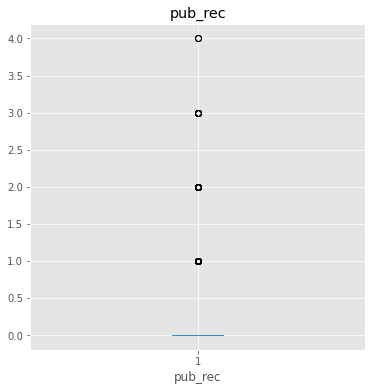

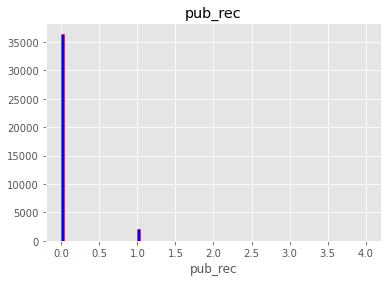

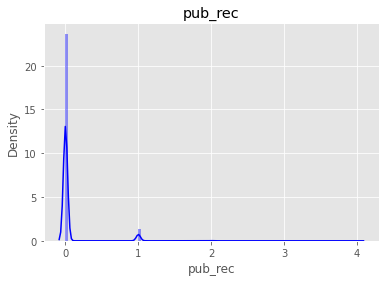

Percentage of total loan applicants where no Degoratory Public Record availaible : 94.63 %
Percentage of total loan applicants where  Degoratory Public Record greater than 0: 5.37 %


0    36448
1     2011
2       48
3        7
4        2
Name: pub_rec, dtype: int64

In [76]:
#pub_rec

#Percentage of total loan applicants where no Degoratory Public Record availaible : 94.63 %
#Percentage of total loan applicants where  Degoratory Public Record greater than 0: 5.37 %

univariate_continous('pub_rec',color_v='blue',bin=100)
plt.show()

query = sqldf('select count(*) as pub_rec_freq from loan_v1 where pub_rec = 0')

print("Percentage of total loan applicants where no Degoratory Public Record availaible : {} %".format(round(100*query['pub_rec_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as pub_rec_freq from loan_v1 where pub_rec > 0')

print("Percentage of total loan applicants where  Degoratory Public Record greater than 0: {} %".format(round(100*query['pub_rec_freq'][0]/len(loan_v1.index),2)))

loan_v1['pub_rec'].value_counts()



 Variable : revol_util 

Summary : 

count    38516.00000
mean        48.70412
std         28.36331
min          0.00000
25%         25.20000
50%         49.10000
75%         72.30000
95%         93.52500
max         99.90000
Name: revol_util, dtype: float64



 Q3  Percentile Value : 72.3 and Q1 Value : 0.0 and IQR Value : 72.3



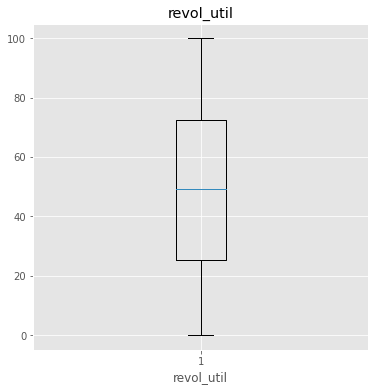

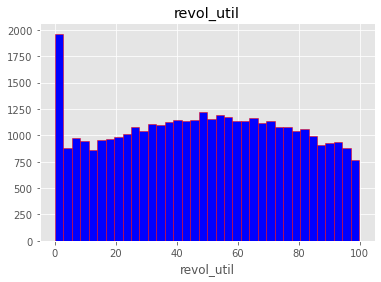

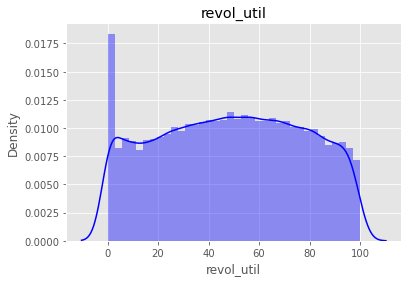

Percentage of total loan applicants where revolving credit utilization between Q1 and Q3  : 49.97 %
Percentage of total loan applicants where  where revolving credit utilization greater than Q3 : 25.26 %


In [77]:
#revol_util

#Percentage of total loan applicants where revolving credit utilization between Q1 and Q3  : 49.97 %
#Percentage of total loan applicants where  where revolving credit utilization greater than Q3 : 25.26 %

univariate_continous('revol_util',color_v='blue')
plt.show()

query = sqldf('select count(*) as revol_util_freq from loan_v1 where revol_util between 25 and 72')

print("Percentage of total loan applicants where revolving credit utilization between Q1 and Q3  : {} %".format(round(100*query['revol_util_freq'][0]/len(loan_v1.index),2)))

query = sqldf('select count(*) as revol_util_freq from loan_v1 where revol_util > 72')

print("Percentage of total loan applicants where  where revolving credit utilization greater than Q3 : {} %".format(round(100*query['revol_util_freq'][0]/len(loan_v1.index),2)))


 Variable : open_acc 

Summary : 

count    38516.000000
mean         9.281364
std          4.399821
min          2.000000
25%          6.000000
50%          9.000000
75%         12.000000
95%         17.000000
max         44.000000
Name: open_acc, dtype: float64



 Q3  Percentile Value : 12.0 and Q1 Value : 2.0 and IQR Value : 10.0



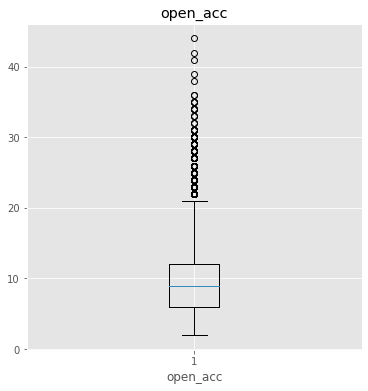

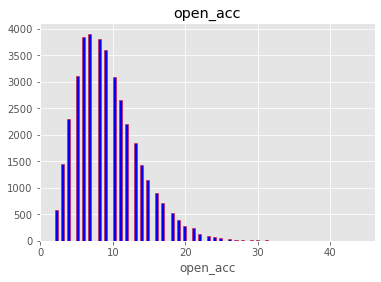

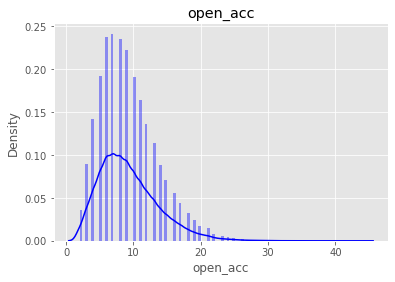

In [78]:
#open_acc The number of open credit lines in the borrower's credit file.

# Min : 2 , Max : 44

# InterQuartile Range  Q3  Percentile Value : 12.0 and Q1 Value : 2.0 and IQR Value : 10.0

univariate_continous('open_acc',color_v='blue',bin=100)
plt.show()


 Variable : total_acc 

Summary : 

count    38516.000000
mean        22.068076
std         11.422373
min          2.000000
25%         13.000000
50%         20.000000
75%         29.000000
95%         43.000000
max         90.000000
Name: total_acc, dtype: float64



 Q3  Percentile Value : 29.0 and Q1 Value : 2.0 and IQR Value : 27.0



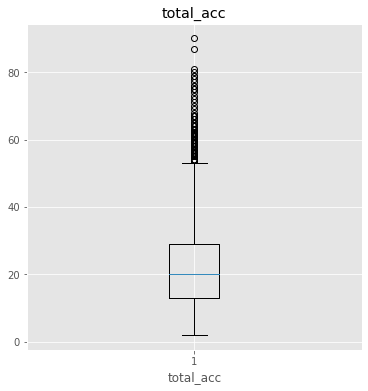

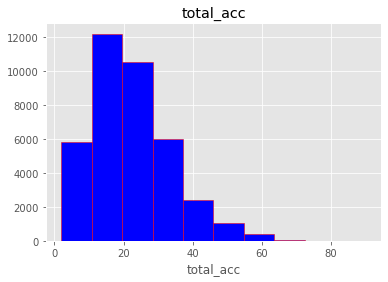

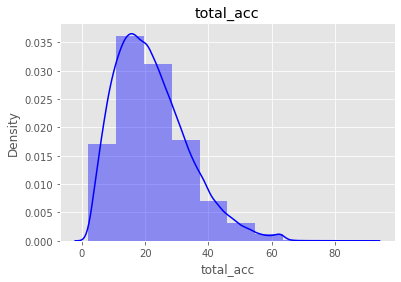

In [79]:
#total_acc

# Min : 2 , Max : 90

# InterQuartile Range Q3  Percentile Value : 29.0 and Q1 Value : 2.0 and IQR Value : 27.0

univariate_continous('total_acc',color_v='blue',bin=10)
plt.show()


In [80]:
print(cat)
print(con)

['grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'earliest_cr_line']
['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'zip_code', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']


# Segmented Univariate Analysis

In [81]:
def segmented_univariate(table,x,y,col,title_label,x_size,y_size):
    """
    Function for Barchart bar
    table : DataFrame
    x : x axis Columns
    y : y axis columns
    title_label : Title Name
    x_size : Figure x size
    y_size : Figure y size
    """
    table = table.reset_index().drop('index', axis=1, errors='ignore')
    table.columns = [str(c) for c in table.columns]  # update columns to strings in case they are numbers

    plt.figure(figsize=(x_size,y_size))
    plt.bar(table[x],table[y],color=col)
    plt.title(title_label)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()
    
def segmented_univariate_h(table,x,y,col,title_label,x_size,y_size):
    """
    Function for Horizontal Barchart barh
    table : DataFrame
    x : x axis Columns
    y : y axis columns
    title_label : Title Name
    x_size : Figure x size
    y_size : Figure y size
    """
    table = table.reset_index().drop('index', axis=1, errors='ignore')
    table.columns = [str(c) for c in table.columns]  # update columns to strings in case they are numbers

    plt.figure(figsize=(y_size,y_size))
    plt.barh(table[x],table[y],color=col)
    plt.title(title_label)
    plt.xlabel(y)
    plt.ylabel(x)
    plt.show()

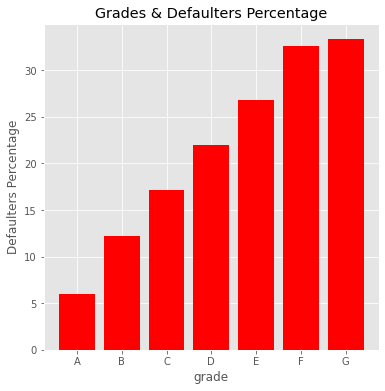

loan_status,0,1,Total,Defaulters Percentage
grade,,,,
A,602,9442,10044,5.99
B,1424,10246,11670,12.20
C,1343,6476,7819,17.18
D,1115,3951,5066,22.01
E,710,1941,2651,26.78
F,316,653,969,32.61
G,99,198,297,33.33


In [82]:
# Relationship between Grades and Loan_status
# Highest no of charged off - Belongs to Grade G
# Grade A have less no of Defaulters

table = pd.pivot_table(loan_v1,index=['grade'],columns=['loan_status'],values='addr_state',aggfunc='count')

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

segmented_univariate(table,'grade','Defaulters Percentage','red','Grades & Defaulters Percentage',6,6)

table

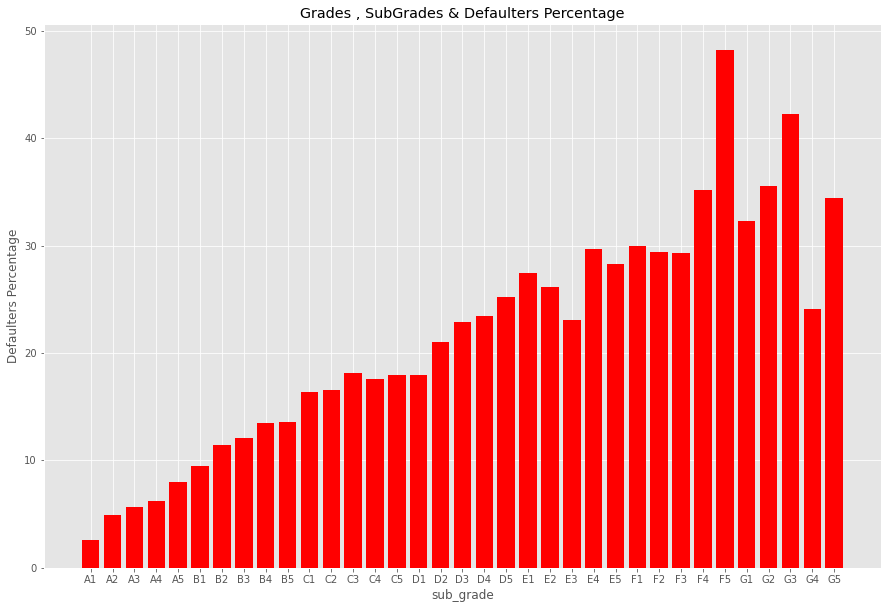

loan_status        0     1  Total  Defaulters Percentage
grade sub_grade                                         
A     A1          30  1109   1139                   2.63
      A2          74  1434   1508                   4.91
      A3         103  1706   1809                   5.69
      A4         178  2695   2873                   6.20
      A5         217  2498   2715                   7.99
B     B1         171  1625   1796                   9.52
      B2         228  1773   2001                  11.39
      B3         341  2484   2825                  12.07
      B4         328  2106   2434                  13.48
      B5         356  2258   2614                  13.62
C     C1         336  1717   2053                  16.37
      C2         318  1607   1925                  16.52
      C3         270  1216   1486                  18.17
      C4         212   993   1205                  17.59
      C5         207   943   1150                  18.00
D     D1         166   759    925                  17.95
      D2         270  1013   1283                  21.04
      D3         255   857   1112                  22.93
      D4         215   701    916                  23.47
      D5         209   621    830                  25.18
E     E1         198   524    722                  27.42
      E2         160   451    611                  26.19
      E3         118   394    512                  23.05
      E4         126   298    424                  29.72
      E5         108   274    382                  28.27
F     F1          91   213    304                  29.93
      F2          68   163    231                  29.44
      F3          51   123    174                  29.31
      F4          52    96    148                  35.14
      F5          54    58    112                  48.21
G     G1          30    63     93                  32.26
      G2          27    49     76                  35.53
      G3          19    26     45                  42.22
      G4          13    41     54                  24.07
      G5          10    19     29                  34.48

In [83]:
# Relationship between Grades , SubGrades and loan_status

# Below grades & Sub grades have highest Percentage of Defaulters

# Highest % of sub grades defaulters are in F5

# From Below plot we can infer that the probability of Charged Off is increasing from A1 - A5

# A-> A5 - 7.99  %
# B-> B5 - 13.62 %
# C-> C3 - 18.17 %
# D-> D5 - 25.18 %
# E-> E4 - 29.72 %
# F-> F5 - 48.21 %
# G-> G3 - 42.22 %

table = pd.pivot_table(loan_v1,index=['grade','sub_grade'],columns=['loan_status'],values='addr_state',aggfunc='count')


table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

#table = table.sort_values(by='Defaulters Percentage')

segmented_univariate(table,'sub_grade','Defaulters Percentage','red','Grades , SubGrades & Defaulters Percentage',15,10)

table

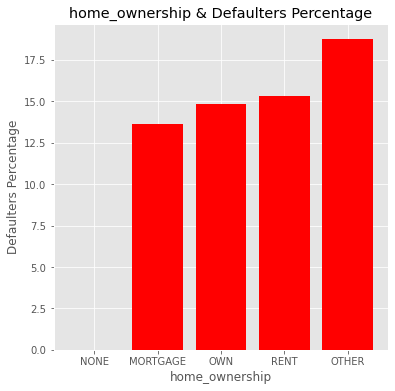

loan_status,0,1,Total,Defaulters Percentage
home_ownership,,,,
NONE,0.0,3.0,3.0,0.00
MORTGAGE,2322.0,14684.0,17006.0,13.65
OWN,441.0,2526.0,2967.0,14.86
RENT,2828.0,15616.0,18444.0,15.33
OTHER,18.0,78.0,96.0,18.75


In [84]:
# Relationship between home_ownership & loan_status

# Highest No of Defaulters are observed with home_ownership OTHER Type

table = pd.pivot_table(loan_v1,index=['home_ownership'],columns=['loan_status'],values='addr_state',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(by='Defaulters Percentage')

segmented_univariate(table,'home_ownership','Defaulters Percentage','red','home_ownership & Defaulters Percentage',6,6)

table

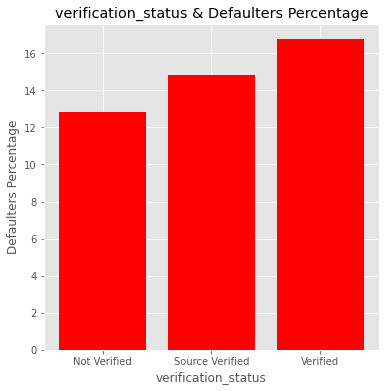

loan_status,0,1,Total,Defaulters Percentage
verification_status,,,,
Not Verified,2134,14526,16660,12.81
Source Verified,1431,8231,9662,14.81
Verified,2044,10150,12194,16.76


In [85]:
# Relationship between loan_status & verification_status

#loan_status                    Defaulters Percentage
#verification_status                                           
#Not Verified                          12.81
#Source Verified                       14.81
#Verified                              16.76

# Default rate of Verified is more observed

table = pd.pivot_table(loan_v1,index=['verification_status'],columns=['loan_status'],values='addr_state',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(by='Defaulters Percentage')

segmented_univariate(table,'verification_status','Defaulters Percentage','red','verification_status & Defaulters Percentage',6,6)

table

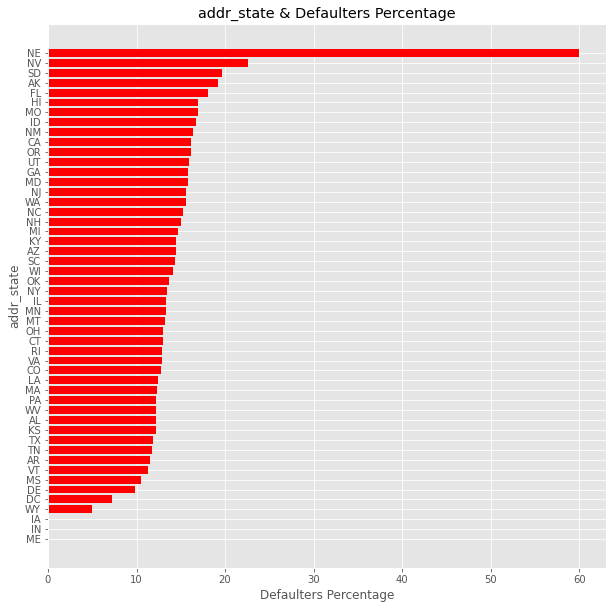

loan_status,0,1,Total,Defaulters Percentage
addr_state,,,,
NE,3.0,2.0,5.0,60.00
NV,108.0,370.0,478.0,22.59
SD,12.0,49.0,61.0,19.67
AK,15.0,63.0,78.0,19.23
FL,503.0,2275.0,2778.0,18.11
HI,28.0,137.0,165.0,16.97
MO,113.0,555.0,668.0,16.92
ID,1.0,5.0,6.0,16.67
NM,30.0,153.0,183.0,16.39


In [86]:
# Relationship between addr_state and loan_status

# 60 % of Defaulters  are observed from addr_state 'NE' but no of loan application are very less

#Top 5 states where most no of defaulters are observed
#addr_state
#NE    60.00
#NV    22.59
#SD    19.67
#FL    19.23
#HI    18.11

table = pd.pivot_table(loan_v1,index=['addr_state'],columns=['loan_status'],values='grade',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(by='Defaulters Percentage',ascending='False')

segmented_univariate_h(table,'addr_state','Defaulters Percentage','red','addr_state & Defaulters Percentage',10,10)

table.sort_values(by="Defaulters Percentage",ascending=False)

In [87]:
# Relationship between verification_status , addr_state & loan_status

#Below verification_status and addr state have more no of defaulters

#Not Verified         NE            60.00
#Verified             TN            50.00
#                     AK            30.43
#                     NV            25.88
#                     SD            25.00

# Source Verified     NM.           25.00

table = pd.pivot_table(loan_v1,index=['verification_status','addr_state'],columns=['loan_status'],values='grade',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table.sort_values(by="Defaulters Percentage",ascending=False)

loan_status                         0       1   Total  Defaulters Percentage
verification_status addr_state                                              
Not Verified        NE            3.0     2.0     5.0                  60.00
Verified            TN            2.0     2.0     4.0                  50.00
                    AK            7.0    16.0    23.0                  30.43
                    NV           44.0   126.0   170.0                  25.88
                    SD            3.0     9.0    12.0                  25.00
Source Verified     NM           14.0    42.0    56.0                  25.00
Verified            MT            5.0    16.0    21.0                  23.81
                    UT           20.0    65.0    85.0                  23.53
Source Verified     NH            7.0    24.0    31.0                  22.58
                    AK            6.0    21.0    27.0                  22.22
Not Verified        NV           43.0   152.0   195.0                  22.05
Source Verified     KY           19.0    72.0    91.0                  20.88
Verified            FL          179.0   684.0   863.0                  20.74
Not Verified        HI           14.0    58.0    72.0                  19.44
Verified            AL           25.0   107.0   132.0                  18.94
                    NJ          107.0   462.0   569.0                  18.80
Source Verified     SD            3.0    13.0    16.0                  18.75
                    NV           21.0    92.0   113.0                  18.58
Verified            OK           17.0    75.0    92.0                  18.48
Source Verified     MO           29.0   129.0   158.0                  18.35
Verified            CA          417.0  1856.0  2273.0                  18.35
Not Verified        SD            6.0    27.0    33.0                  18.18
Verified            OH           66.0   300.0   366.0                  18.03
                    HI            9.0    41.0    50.0                  18.00
                    MN           31.0   142.0   173.0                  17.92
                    WA           47.0   216.0   263.0                  17.87
Source Verified     MD           47.0   219.0   266.0                  17.67
                    MI           30.0   140.0   170.0                  17.65
                    DE            3.0    14.0    17.0                  17.65
                    LA           22.0   105.0   127.0                  17.32
Not Verified        FL          205.0   991.0  1196.0                  17.14
Source Verified     OR           15.0    73.0    88.0                  17.05
                    RI            9.0    44.0    53.0                  16.98
Verified            NC           40.0   197.0   237.0                  16.88
Source Verified     SC           20.0    99.0   119.0                  16.81
                    GA           56.0   278.0   334.0                  16.77
Verified            GA           76.0   379.0   455.0                  16.70
Not Verified        ID            1.0     5.0     6.0                  16.67
Source Verified     WI           16.0    80.0    96.0                  16.67
Verified            MI           38.0   190.0   228.0                  16.67
Source Verified     AZ           33.0   165.0   198.0                  16.67
Verified            MO           34.0   171.0   205.0                  16.59
Source Verified     FL          119.0   600.0   719.0                  16.55
Not Verified        MO           50.0   255.0   305.0                  16.39
Verified            NM            9.0    46.0    55.0                  16.36
Not Verified        OR           33.0   169.0   202.0                  16.34
Verified            MD           56.0   289.0   345.0                  16.23
                    NH           10.0    52.0    62.0                  16.13
Source Verified     CA          295.0  1538.0  1833.0                  16.09
Verified            VA           71.0   371.0   442.0                  16

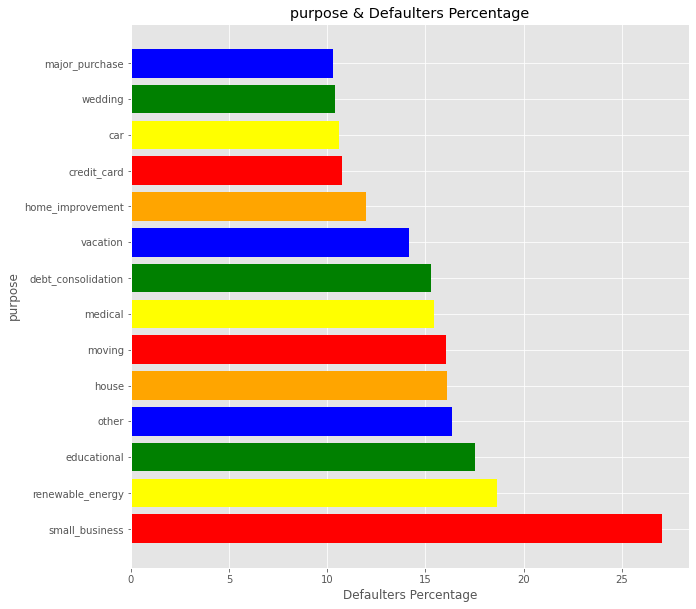

,purpose,0,1,Total,Defaulters Percentage
0,small_business,474,1277,1751,27.07
1,renewable_energy,19,83,102,18.63
2,educational,56,264,320,17.50
3,other,629,3221,3850,16.34
4,house,59,308,367,16.08
5,moving,92,482,574,16.03
6,medical,105,574,679,15.46
7,debt_consolidation,2761,15279,18040,15.30
8,vacation,53,321,374,14.17
9,home_improvement,344,2526,2870,11.99


In [88]:
# Relationship between Purpose , loan_status

#loans applied for small_business are most likely to be defaulted Percentage will be 27.07 : 

table = pd.pivot_table(loan_v1,index=['purpose'],columns=['loan_status'],values='grade',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate_h(table,'purpose','Defaulters Percentage',['red','yellow','green','blue','orange'],'purpose & Defaulters Percentage',10,10)

table = table.reset_index().drop('index', axis=1, errors='ignore')
table.columns = [str(c) for c in table.columns]  # update columns to strings in case they are numbers


table

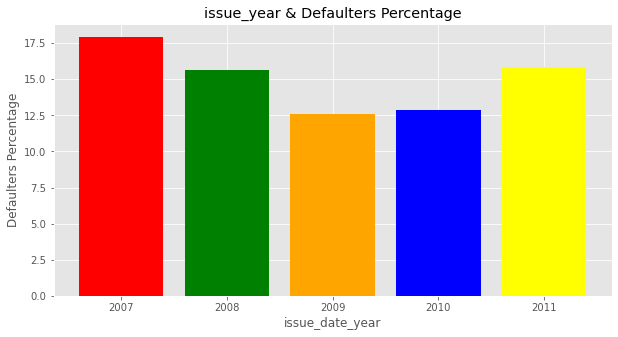

loan_status,0,1,Total,Defaulters Percentage
issue_date_year,,,,
2007,45,206,251,17.93
2011,3252,17255,20507,15.86
2008,243,1311,1554,15.64
2010,1478,10025,11503,12.85
2009,591,4110,4701,12.57


In [89]:
#i Relationship between issue_date_year , loan_status

# Highest no loans were defaulted in Year 2007

table = pd.pivot_table(loan_v1,index=['issue_date_year'],columns=['loan_status'],values='grade',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'issue_date_year','Defaulters Percentage',['red','yellow','green','blue','orange'],'issue_year & Defaulters Percentage',10,5)

table

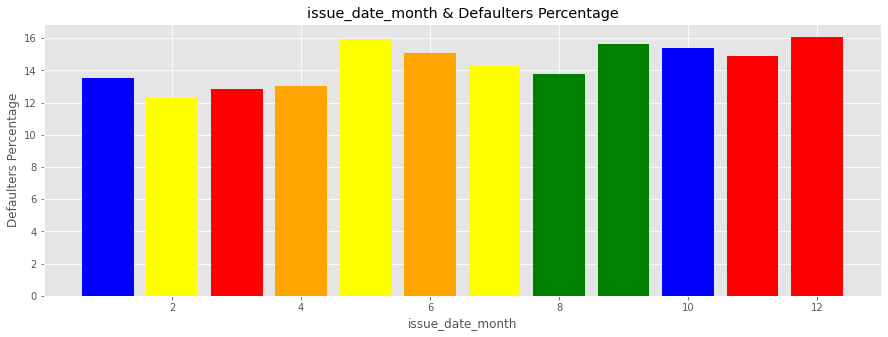

loan_status,0,1,Total,Defaulters Percentage
issue_date_month,,,,
12,677,3534,4211,16.08
5,466,2452,2918,15.97
9,546,2950,3496,15.62
10,579,3176,3755,15.42
6,477,2690,3167,15.06
11,596,3406,4002,14.89
7,478,2865,3343,14.30
8,466,2918,3384,13.77
1,321,2052,2373,13.53


In [90]:
# Relationship between issue_date_month , loan_status


# Highes Default Rate observed for Dec , May , Sep & Oct Month

table = pd.pivot_table(loan_v1,index=['issue_date_month'],columns=['loan_status'],values='grade',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'issue_date_month','Defaulters Percentage',['red','yellow','green','blue','orange'],'issue_date_month & Defaulters Percentage',15,5)

table

In [91]:
print(cat)
print(con)

['grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'earliest_cr_line']
['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'zip_code', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']


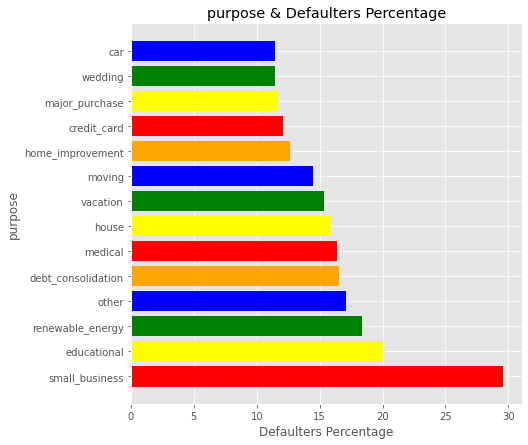

loan_status,0,1,Total,Defaulters Percentage
purpose,,,,
small_business,6927325,16497675,23425000,29.57
educational,440100,1760300,2200400,20.00
renewable_energy,160000,710875,870875,18.37
other,5231125,25365875,30597000,17.10
debt_consolidation,37342400,188308425,225650825,16.55
medical,906250,4621550,5527800,16.39
house,745775,3934725,4680500,15.93
vacation,311425,1718775,2030200,15.34
moving,546125,3233050,3779175,14.45


In [92]:
# Relationship between purpose , loan_status & loan amount

# Out of the amount invested around 29.57 % of amount has been defaluted in small business

# Small business loans are more likely to be defaulted

table = pd.pivot_table(loan_v1,index=['purpose'],columns=['loan_status'],values='loan_amnt',aggfunc='sum')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate_h(table,'purpose','Defaulters Percentage',['red','yellow','green','blue','orange'],'purpose & Defaulters Percentage',20,7)

table

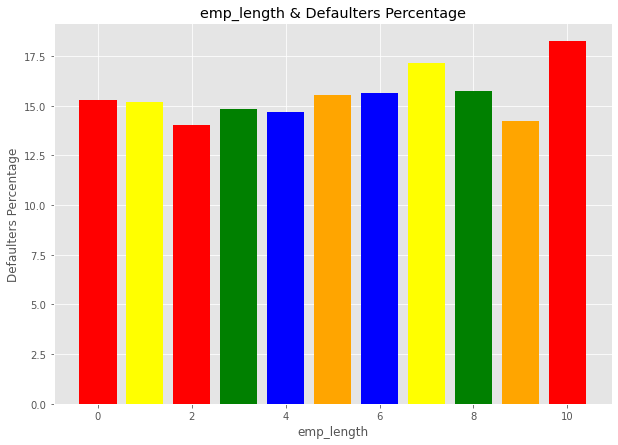

loan_status,0,1,Total,Defaulters Percentage
emp_length,,,,
10,21394725,95965900,117360625,18.23
7,3391375,16376550,19767925,17.16
8,2647825,14194300,16842125,15.72
6,3846525,20794950,24641475,15.61
5,5513150,29940925,35454075,15.55
0,6578300,36518800,43097100,15.26
1,4823475,27002650,31826125,15.16
3,6330050,36328325,42658375,14.84
4,5308350,30860750,36169100,14.68


In [93]:
#Relationship betweenn emp_length, loan_status & loan_amnt

# Highest no of loan amount has been allocated to employee length 10 or 10 + , Also it has the highest defaullt percentage

table = pd.pivot_table(loan_v1,index=['emp_length'],columns=['loan_status'],values='loan_amnt',aggfunc='sum')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'emp_length','Defaulters Percentage',['red','yellow','green','blue','orange'],'emp_length & Defaulters Percentage',10,7)

table



# Dervied Metrics & Binnning

In [94]:
def binning_cut(bin , bucket,feature):
    return pd.cut(loan_v1[feature],bin,labels=bucket)

Before Binning count    38516.000000
mean     11055.671669
std       7348.558289
min        500.000000
25%       5325.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


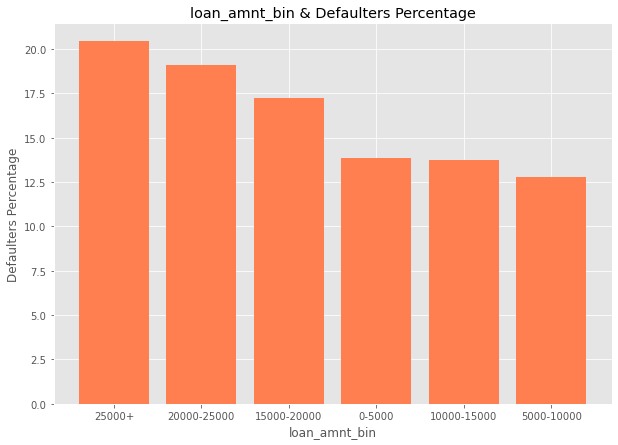

loan_status       0      1  Total  Defaulters Percentage
loan_amnt_bin                                           
25000+          143    557    700                  20.43
20000-25000     541   2294   2835                  19.08
15000-20000     750   3597   4347                  17.25
0-5000         1305   8131   9436                  13.83
10000-15000    1055   6625   7680                  13.74
5000-10000     1635  11148  12783                  12.79


In [95]:
# Relationship between loan_status & loan_amount_bin range

#Analysis : Defaulter percentage on loan > 25000 is more around 24.49 %

# Higher the loan amount higher the chances of getting defaulted

print("Before Binning",loan_v1['loan_amnt'].describe())

bins = [0,5000,10000,15000,20000,25000,30000]
bucket = ['0-5000','5000-10000','10000-15000','15000-20000','20000-25000','25000+']

loan_v1['loan_amnt_bin'] = binning_cut(bins,bucket,'loan_amnt')

cat.append('loan_amnt_bin')

table = pd.pivot_table(loan_v1,index=['loan_amnt_bin'],columns=['loan_status'],values='grade',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'loan_amnt_bin','Defaulters Percentage','coral','loan_amnt_bin & Defaulters Percentage',10,7)

print(table)

count    38516.000000
mean        13.276922
std          6.671308
min          0.000000
25%          8.140000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64


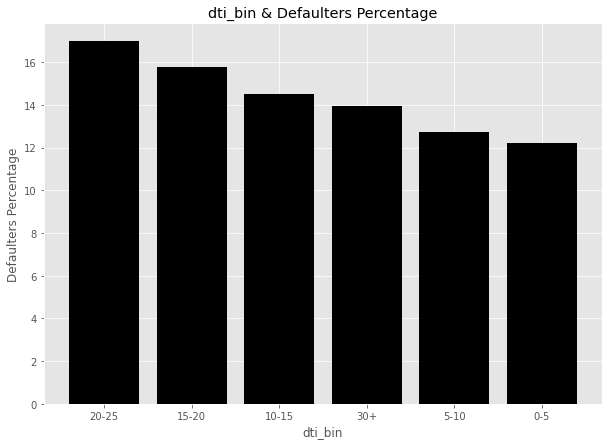

loan_status     0     1  Total  Defaulters Percentage
dti_bin                                              
20-25        1115  5456   6571                  16.97
15-20        1387  7412   8799                  15.76
10-15        1395  8222   9617                  14.51
30+            87   536    623                  13.96
5-10         1002  6859   7861                  12.75
0-5           595  4279   4874                  12.21


In [96]:
# Relation dti range & loan_status

# Between 20-25 Defaulter percentage is highest

# Higher the DTI rate higher the defaulter percentage

print(loan_v1['dti'].describe())

bin = [0,5,10,15,20,25,30]
bucket = ['0-5','5-10','10-15','15-20','20-25','30+']

loan_v1['dti_bin'] = binning_cut(bin,bucket,'dti')

cat.append('dti_bin')

table = pd.pivot_table(loan_v1,index=['dti_bin'],columns=['loan_status'],values='loan_amnt',aggfunc='count')


table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'dti_bin','Defaulters Percentage','black','dti_bin & Defaulters Percentage',10,7)

print(table)

count    38516.000000
mean        11.926877
std          3.690111
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
max         24.400000
Name: int_rate, dtype: float64


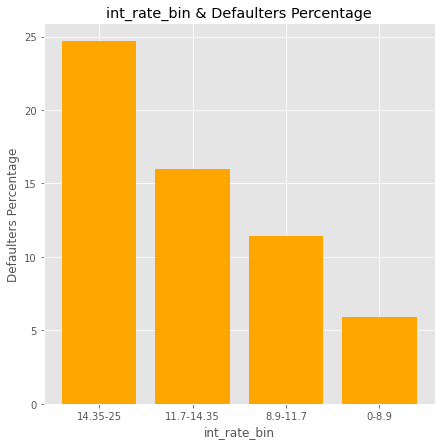

loan_status      0     1  Total  Defaulters Percentage
int_rate_bin                                          
14.35-25      2370  7238   9608                  24.67
11.7-14.35    1625  8534  10159                  16.00
8.9-11.7      1053  8183   9236                  11.40
0-8.9          561  8952   9513                   5.90
25+              0     0      0                    NaN


In [97]:
# Binning int_rate range

# Defaulter Percentage is more between int range 14.35-25 around 24.67 %

# Default rate is decreasing with decrease in interest rate

print(loan_v1['int_rate'].describe())

bin = [0,8.9,11.7,14.35,25,100]
bucket = ['0-8.9','8.9-11.7','11.7-14.35','14.35-25','25+']

loan_v1['int_rate_bin'] = binning_cut(bin,bucket,'int_rate')

cat.append('int_rate_bin')

table = pd.pivot_table(loan_v1,index=['int_rate_bin'],columns=['loan_status'],values='loan_amnt',aggfunc='count')

table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'int_rate_bin','Defaulters Percentage','orange','int_rate_bin & Defaulters Percentage',7,7)

print(table) 


count    38516.000000
mean       322.700611
std        208.664493
min         15.690000
0%          15.690000
25%        165.740000
50%        278.150000
75%        426.100000
95%        760.820000
max       1305.190000
Name: installment, dtype: float64


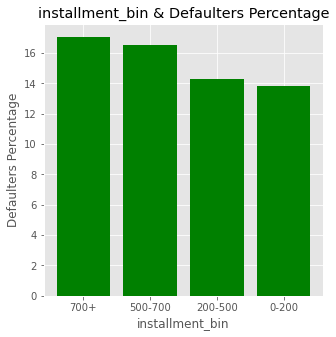

loan_status         0      1  Total  Defaulters Percentage
installment_bin                                           
700+              409   1989   2398                  17.06
500-700           729   3684   4413                  16.52
200-500          2666  16004  18670                  14.28
0-200            1803  11230  13033                  13.83


In [98]:
# Relationship between installment & loan_status

# Binning installment 

# Around 17.06 % of defaulters re in range of installments 700+ 

# Default rate is highest for higher installment

print(loan_v1['installment'].describe([0,.25,.5,.75,.95]))

bin = [0,200,500,700,1300]
bucket = ['0-200','200-500','500-700','700+']

loan_v1['installment_bin'] = binning_cut(bin,bucket,'installment')

cat.append('installment_bin')

table = pd.pivot_table(loan_v1,index=['installment_bin'],columns=['loan_status'],values='installment',aggfunc='count')

table.loc[np.isnan(table['0']),['0']] = 0

table.loc[np.isnan(table['1']),['1']] = 0

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'installment_bin','Defaulters Percentage','green','installment_bin & Defaulters Percentage',5,5)

print(table) 



count     38516.000000
mean      65082.226850
std       32644.678411
min        4000.000000
0%         4000.000000
25%       40000.000000
50%       59000.000000
75%       82000.000000
95%      140004.000000
max      145000.000000
Name: annual_inc, dtype: float64


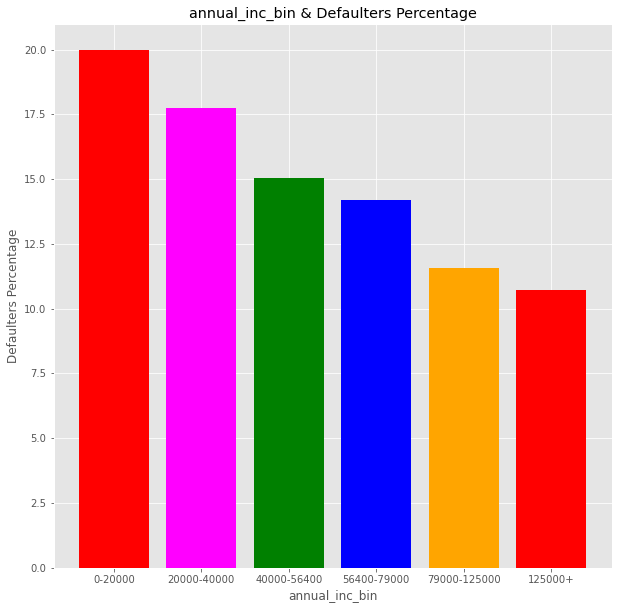

loan_status        0     1  Total  Defaulters Percentage
annual_inc_bin                                          
0-20000          233   933   1166                  19.98
20000-40000     1506  6988   8494                  17.73
40000-56400     1325  7472   8797                  15.06
56400-79000     1331  8038   9369                  14.21
79000-125000     915  6991   7906                  11.57
125000+          299  2485   2784                  10.74


In [99]:
# Binning annual_inc 

# Around 20 % of defaulters are in range of installments 0-20000 and rate is decreasing with annual_inc ranges.

print(loan_v1['annual_inc'].describe([0,.25,.5,.75,.95]))

bin = [0,20000,40000,56400,79000,125000,250000]
bucket = ['0-20000','20000-40000','40000-56400','56400-79000','79000-125000','125000+']

loan_v1['annual_inc_bin'] = binning_cut(bin,bucket,'annual_inc')

cat.append('annual_inc_bin')

table = pd.pivot_table(loan_v1,index=['annual_inc_bin'],columns=['loan_status'],values='annual_inc',aggfunc='count')
 

table['Total'] = table['0'] + table['1']

table['Defaulters Percentage'] = round(100 * table['0']/table['Total'],2)

table = table.sort_values(ascending=False,by="Defaulters Percentage")

segmented_univariate(table,'annual_inc_bin','Defaulters Percentage',['red','magenta','green','blue','orange'],'annual_inc_bin & Defaulters Percentage',10,10)

print(table) 



#                               Bivariate Analysis

## 1-) Categorical vs Categorical
## 2-) Categorical vs Continuous
## 3-) Continuous vs Continuous


In [100]:
print(cat) # Categorical variables
print(con) # Continous Variables

['grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'earliest_cr_line', 'loan_amnt_bin', 'dti_bin', 'int_rate_bin', 'installment_bin', 'annual_inc_bin']
['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'zip_code', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']


In [101]:
loan_v1['loan_status_con'] = loan_v1['loan_status'].copy()

loan_v1['loan_status_con'] = loan_v1['loan_status_con'].astype("int")

In [102]:
# Important Columns 

#loan_amnt,installment,

## Bivariate Analysis

## Approach :- Analysis will be done for two variables with respect to loan_status 

In [103]:
def bivariate_categorical(plot_list,x,y,z,x_size,y_size):
    """
    plot_list : list of plot types
    x : x axis variable
    y : y axis variable
    z : hue
    x_size : figure x axis size
    y_size : figure y axis size
    """
    
    if 'box' in plot_list:
        plt.figure(figsize=(x_size,y_size),facecolor='y')
        sb.boxplot(x,y,hue=z,data=loan_v1,palette="hot")
        plt.show()
    if 'cat' in plot_list:
        plt.figure(figsize=(x_size,y_size),facecolor='y')
        sb.catplot(x,y,hue=z,data=loan_v1,palette="hot")
        plt.show()
    if 'violin' in plot_list:
        plt.figure(figsize=(x_size,y_size),facecolor='y')
        sb.violinplot(x,y,hue=z,data=loan_v1,palette="hot")
        plt.show()
    if 'bar' in plot_list:
        plt.figure(figsize=(x_size,y_size),facecolor='y')
        sb.barplot(x,y,hue=z,data=loan_v1,palette="hot")
        plt.show()
        

def bivariate_continuous(plot_list,x,y,z,x_size=6,y_size=6):
     """
     plot_list : list of plot types
     x : x axis variable
     y : y axis variable
     z : hue
     x_size : figure x axis size
     y_size : figure y axis size
     """
     if 'joint' in plot_list:
        if x == y or y ==z : 
            pass
        else:
            print("Relationship with {},{} & {}".format(x,y,z))
            plt.figure(figsize=(x_size,y_size),facecolor='y')
            sb.jointplot(x,y,hue=z,data=loan_v1,palette="hot")
            plt.show()
        
     if 'scatter' in plot_list:
        if x == y or y == z: 
            pass
        else:
            print("Relationship with {},{} & {}".format(x,y,z))
            plt.figure(figsize=(x_size,y_size),facecolor='y')
            sb.scatterplot(x,y,hue=z,data=loan_v1,palette="hot")
            plt.show()
    

# Continuous vs Continous

# Categorical encoding loan_status
### 0 - Defaulted
### 1-  Fully Paid

Relationship with loan_amnt,term & loan_status_con


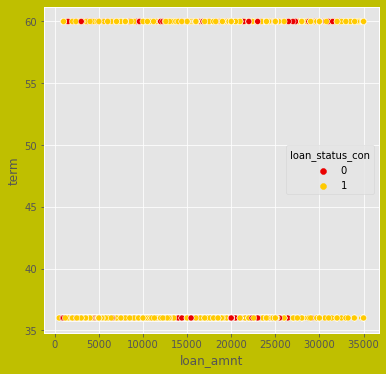

Relationship with loan_amnt,int_rate & loan_status_con


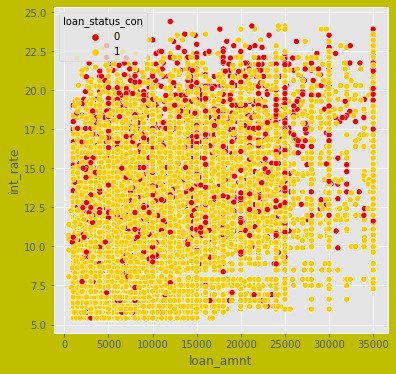

Relationship with loan_amnt,installment & loan_status_con


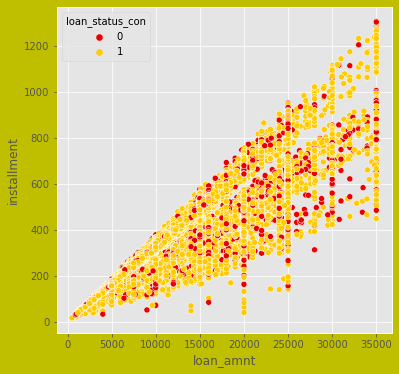

Relationship with loan_amnt,emp_length & loan_status_con


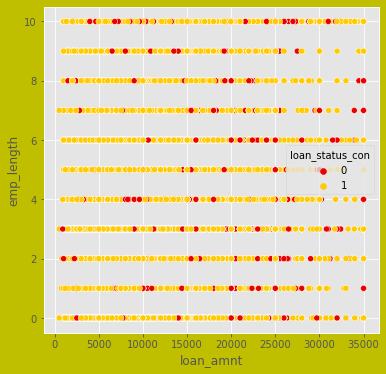

Relationship with loan_amnt,annual_inc & loan_status_con


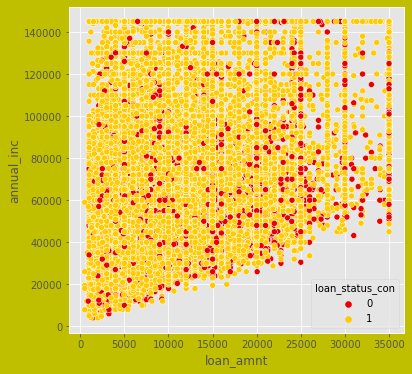

Relationship with loan_amnt,zip_code & loan_status_con


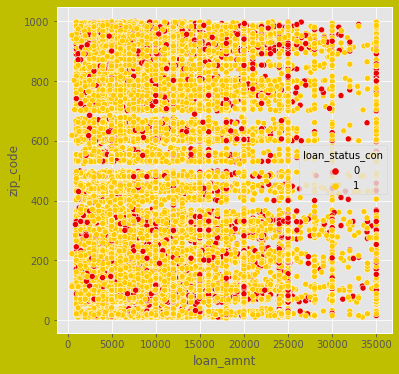

Relationship with loan_amnt,dti & loan_status_con


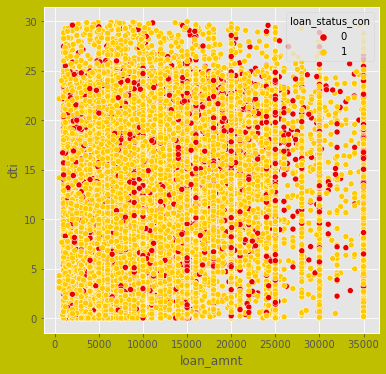

Relationship with loan_amnt,open_acc & loan_status_con


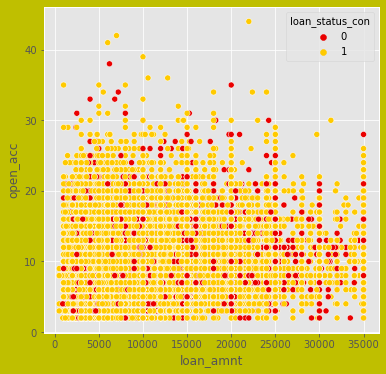

Relationship with loan_amnt,pub_rec & loan_status_con


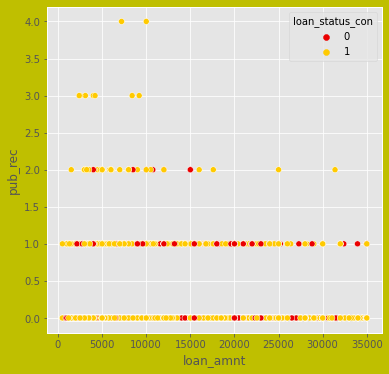

Relationship with loan_amnt,revol_bal & loan_status_con


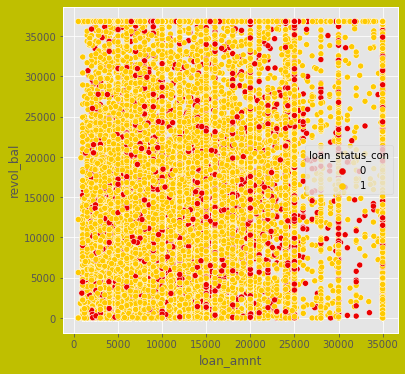

Relationship with loan_amnt,revol_util & loan_status_con


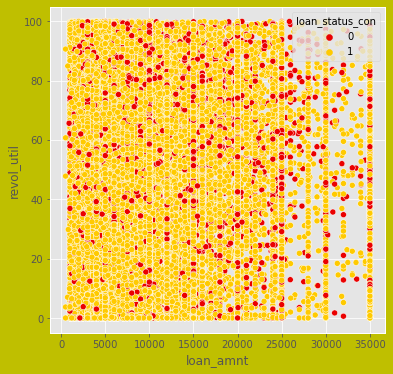

Relationship with loan_amnt,total_acc & loan_status_con


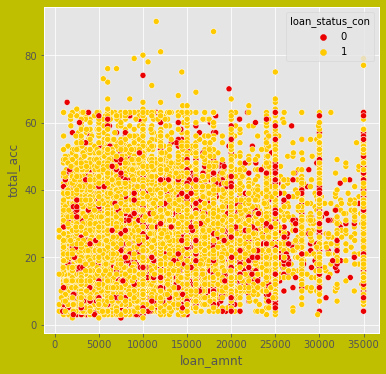

In [104]:
#Analysis#

#loan_amnt# relation with all continous variables

#Related

#installment & loan_amnt are related 
#loan_amnt & annual_inc are related

for i in con : 
        bivariate_continuous(['scatter'],'loan_amnt',i,'loan_status_con')

Relationship with term,loan_amnt & loan_status_con


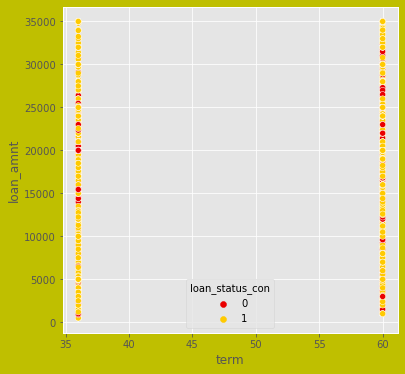

Relationship with term,int_rate & loan_status_con


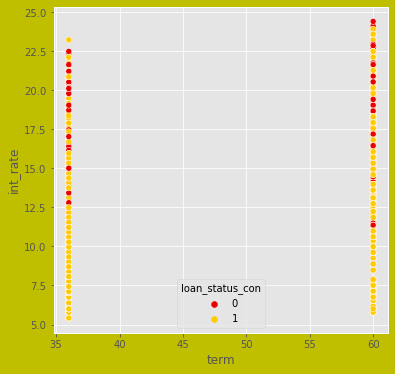

Relationship with term,installment & loan_status_con


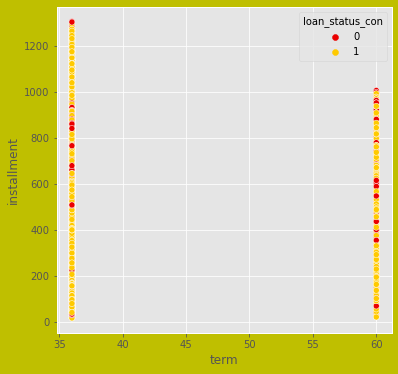

Relationship with term,emp_length & loan_status_con


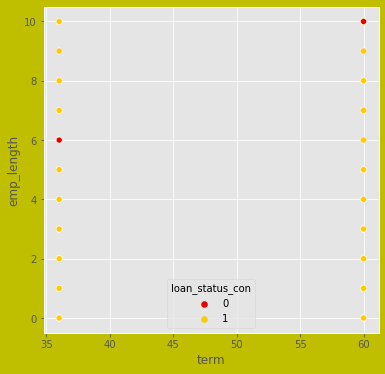

Relationship with term,annual_inc & loan_status_con


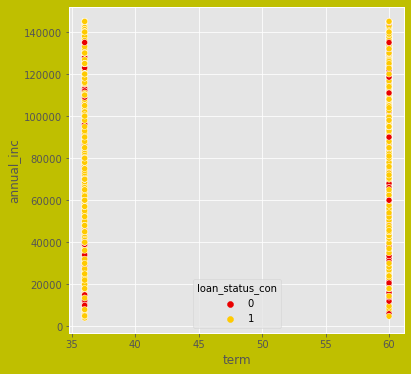

Relationship with term,zip_code & loan_status_con


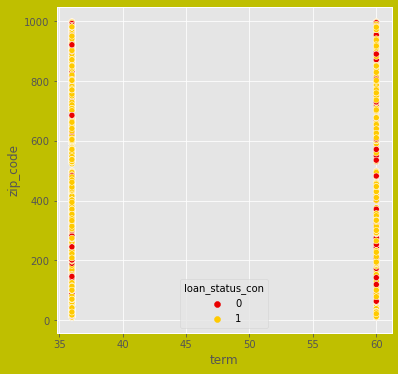

Relationship with term,dti & loan_status_con


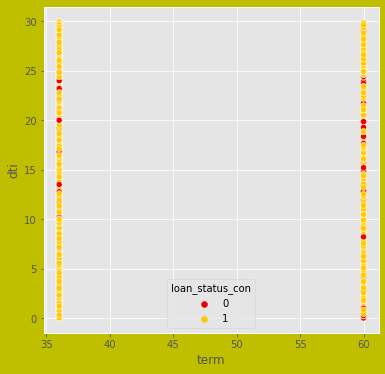

Relationship with term,open_acc & loan_status_con


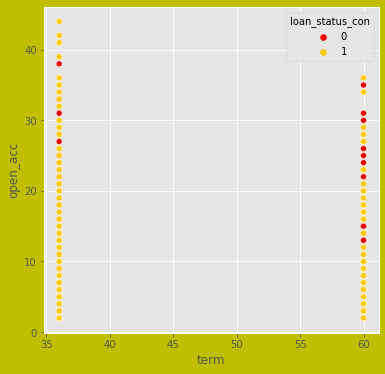

Relationship with term,pub_rec & loan_status_con


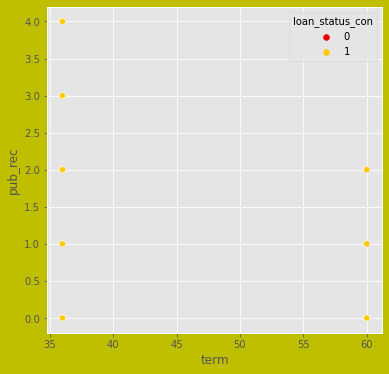

Relationship with term,revol_bal & loan_status_con


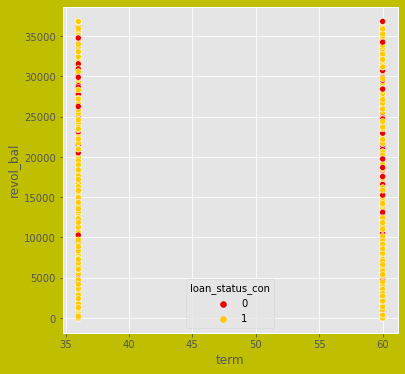

Relationship with term,revol_util & loan_status_con


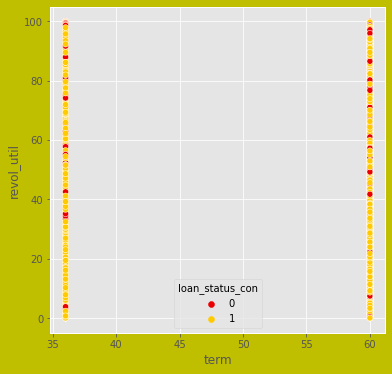

Relationship with term,total_acc & loan_status_con


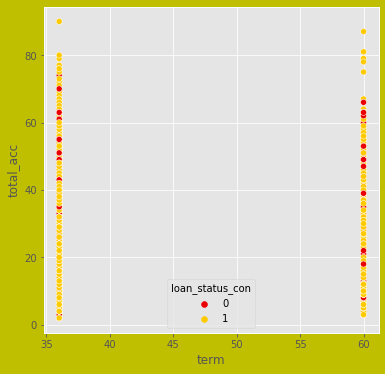

In [105]:
#Analysis#

#term# relation with all variables

# Term is not related with continuous variables

for i in con :
        bivariate_continuous(['scatter'],'term',i,'loan_status_con')

Relationship with int_rate,loan_amnt & loan_status_con


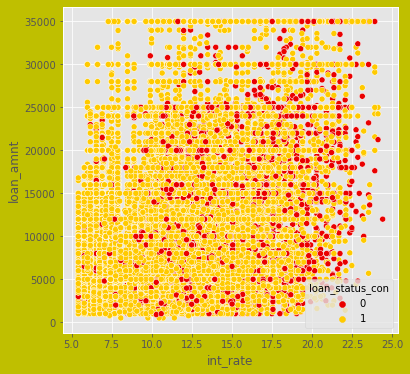

Relationship with int_rate,term & loan_status_con


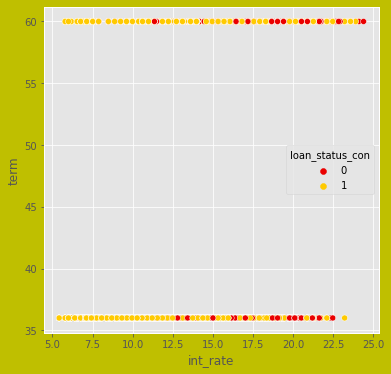

Relationship with int_rate,installment & loan_status_con


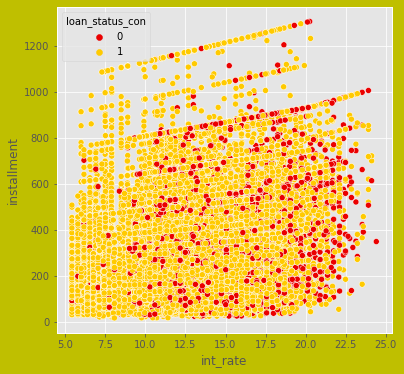

Relationship with int_rate,emp_length & loan_status_con


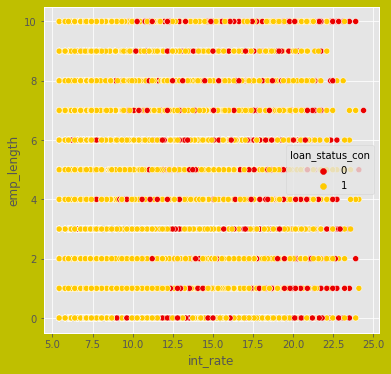

Relationship with int_rate,annual_inc & loan_status_con


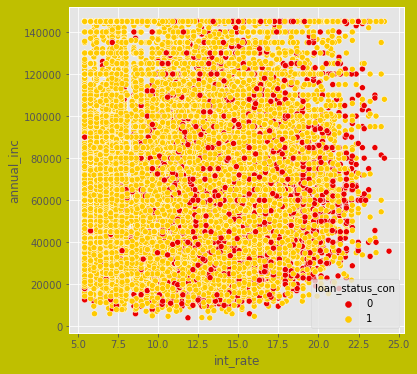

Relationship with int_rate,zip_code & loan_status_con


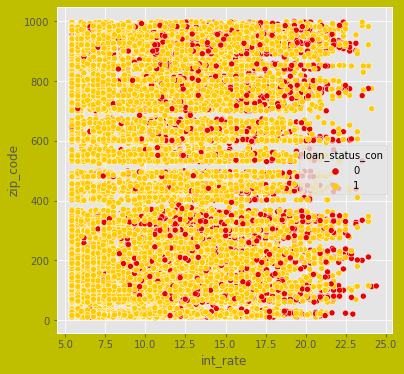

Relationship with int_rate,dti & loan_status_con


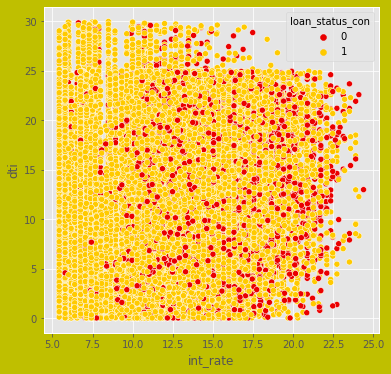

Relationship with int_rate,open_acc & loan_status_con


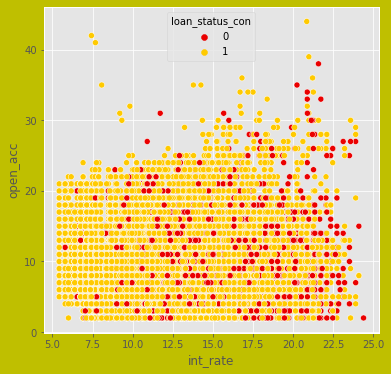

Relationship with int_rate,pub_rec & loan_status_con


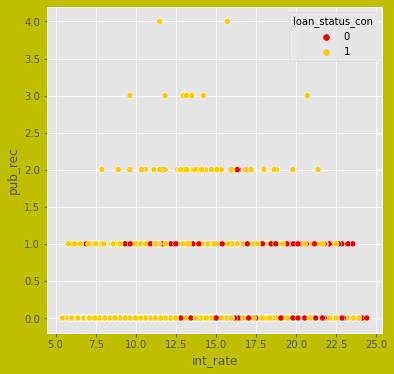

Relationship with int_rate,revol_bal & loan_status_con


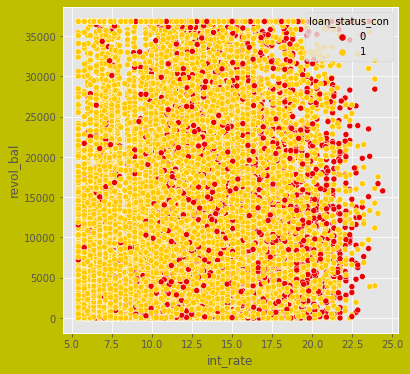

Relationship with int_rate,revol_util & loan_status_con


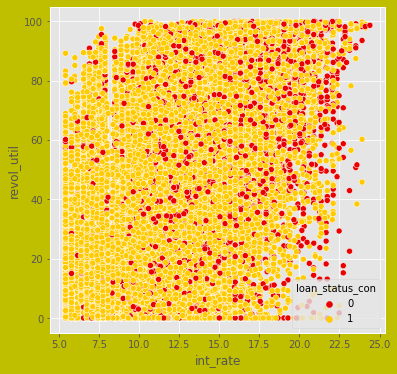

Relationship with int_rate,total_acc & loan_status_con


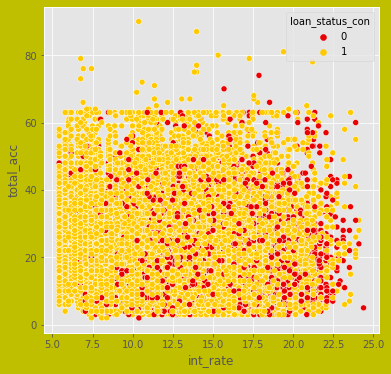

In [106]:
#Analysis#

#int_rate# relation with all variables

#Related : small correlation with loan_amnt, installment

# small Negative correlation with open_acc


for i in con : 
        bivariate_continuous(['scatter'],'int_rate',i,'loan_status_con')

Relationship with zip_code,loan_amnt & loan_status_con


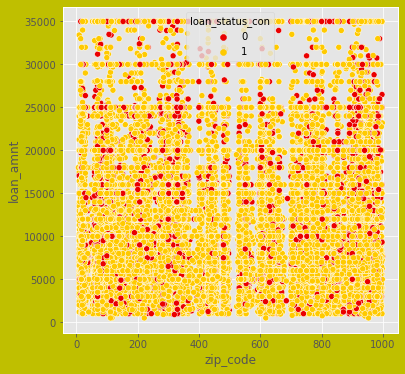

Relationship with zip_code,term & loan_status_con


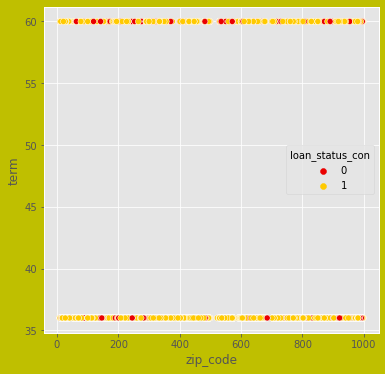

Relationship with zip_code,int_rate & loan_status_con


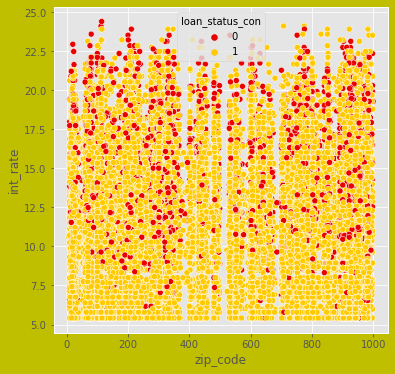

Relationship with zip_code,installment & loan_status_con


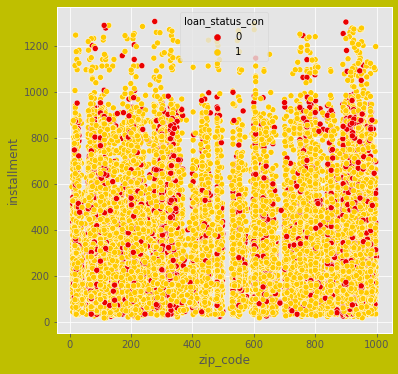

Relationship with zip_code,emp_length & loan_status_con


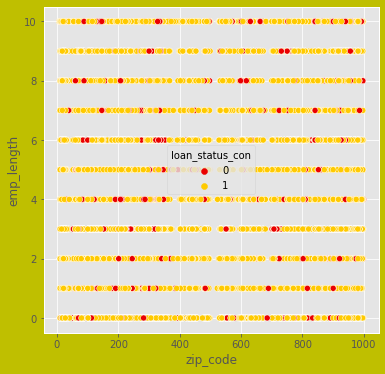

Relationship with zip_code,annual_inc & loan_status_con


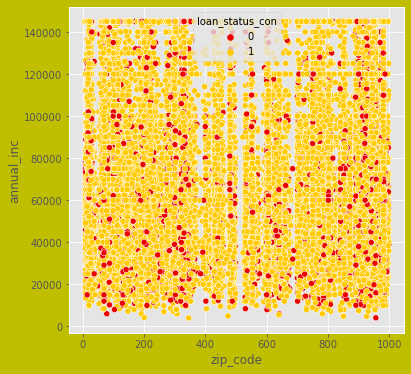

Relationship with zip_code,dti & loan_status_con


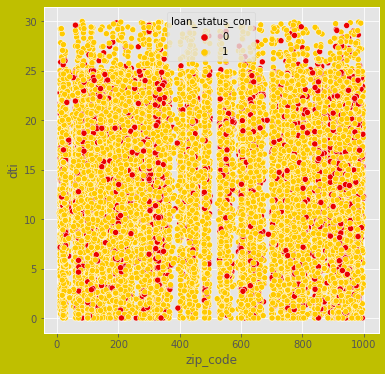

Relationship with zip_code,open_acc & loan_status_con


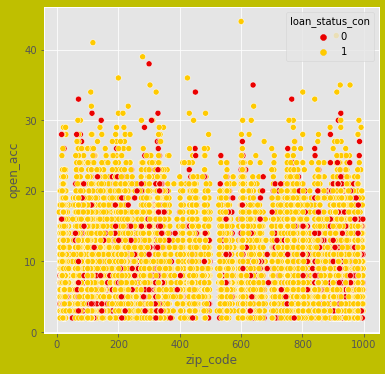

Relationship with zip_code,pub_rec & loan_status_con


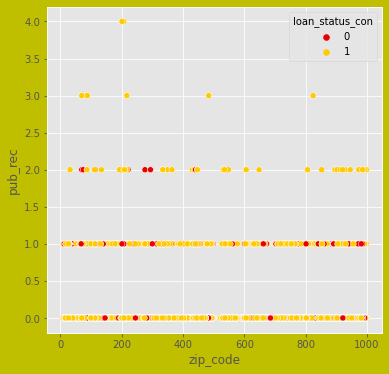

Relationship with zip_code,revol_bal & loan_status_con


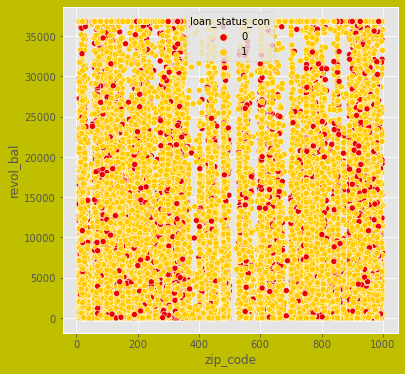

Relationship with zip_code,revol_util & loan_status_con


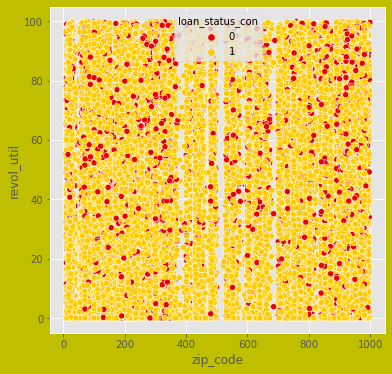

Relationship with zip_code,total_acc & loan_status_con


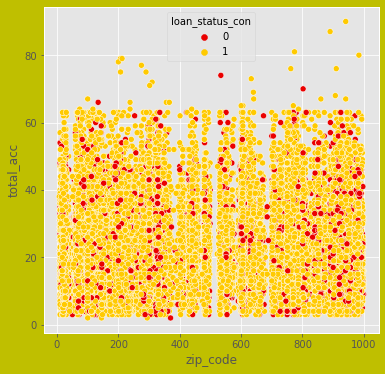

In [107]:
#Analysis#

#zip_code# not much related with continuous variables

for i in con : 
        bivariate_continuous(['scatter'],'zip_code',i,'loan_status_con')

Relationship with emp_length,loan_amnt & loan_status_con


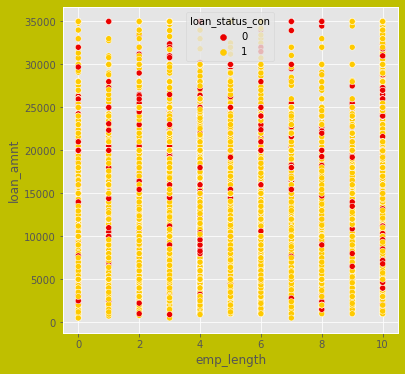

Relationship with emp_length,term & loan_status_con


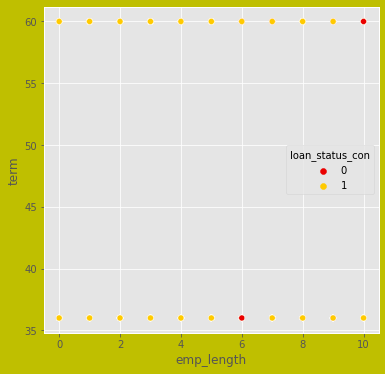

Relationship with emp_length,int_rate & loan_status_con


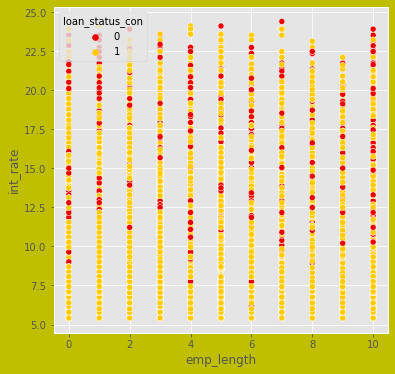

Relationship with emp_length,installment & loan_status_con


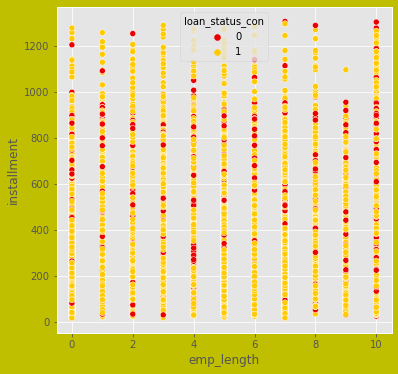

Relationship with emp_length,annual_inc & loan_status_con


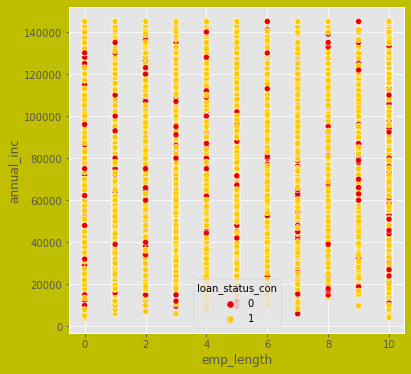

Relationship with emp_length,zip_code & loan_status_con


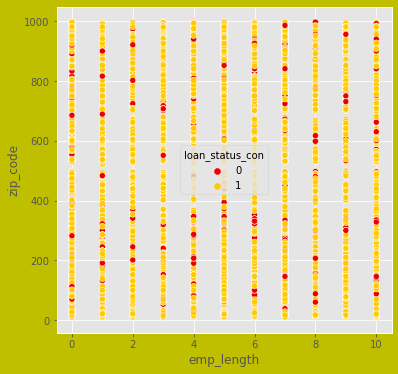

Relationship with emp_length,dti & loan_status_con


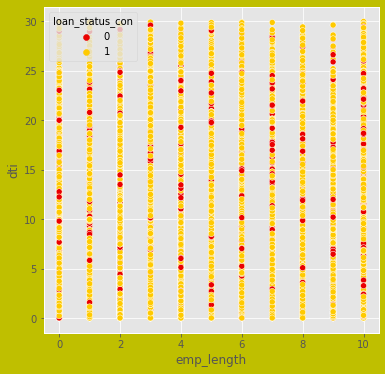

Relationship with emp_length,open_acc & loan_status_con


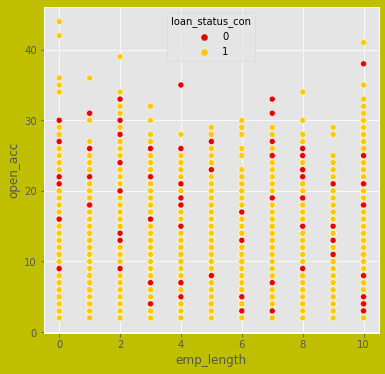

Relationship with emp_length,pub_rec & loan_status_con


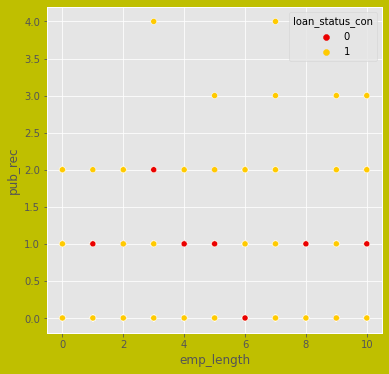

Relationship with emp_length,revol_bal & loan_status_con


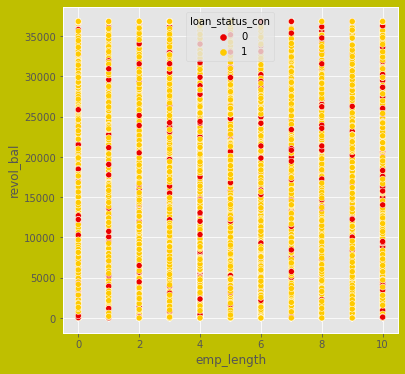

Relationship with emp_length,revol_util & loan_status_con


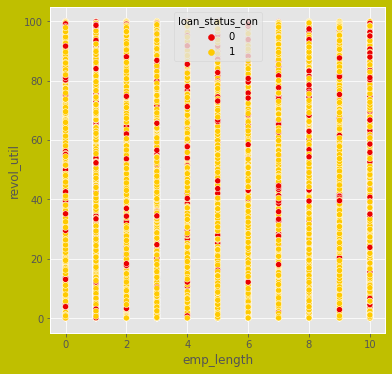

Relationship with emp_length,total_acc & loan_status_con


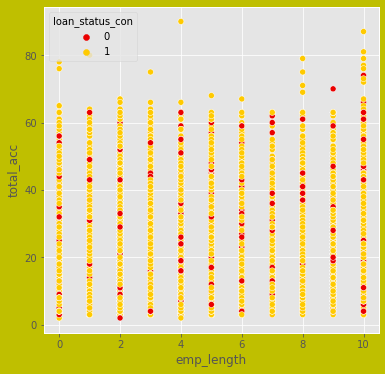

In [108]:
#Analysis#

#emp_length# not much related with continuous variables

for i in con : 
        bivariate_continuous(['scatter'],'emp_length',i,'loan_status_con')

Relationship with dti,loan_amnt & loan_status_con


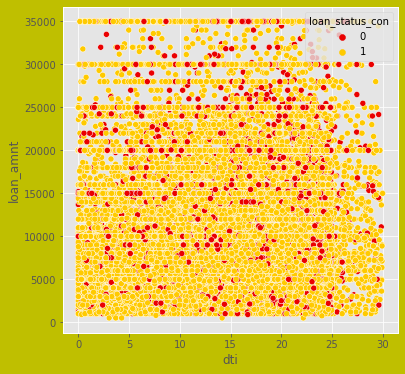

Relationship with dti,term & loan_status_con


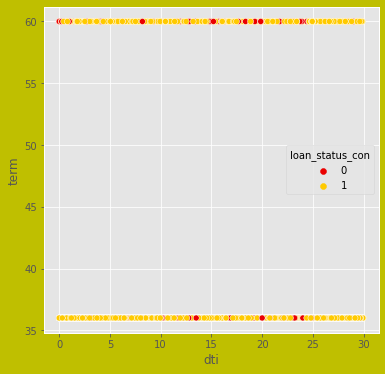

Relationship with dti,int_rate & loan_status_con


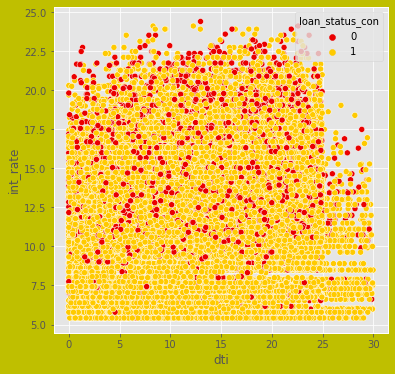

Relationship with dti,installment & loan_status_con


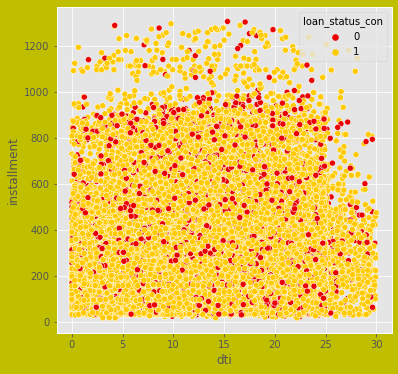

Relationship with dti,emp_length & loan_status_con


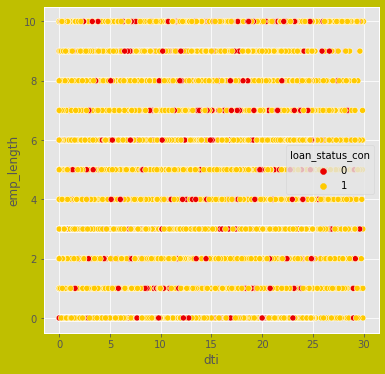

Relationship with dti,annual_inc & loan_status_con


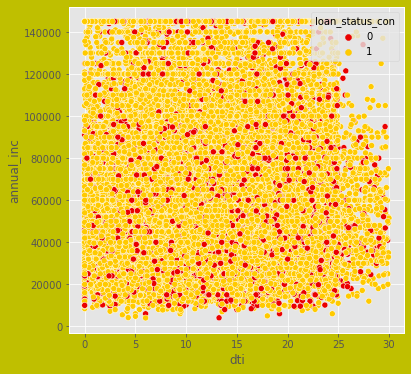

Relationship with dti,zip_code & loan_status_con


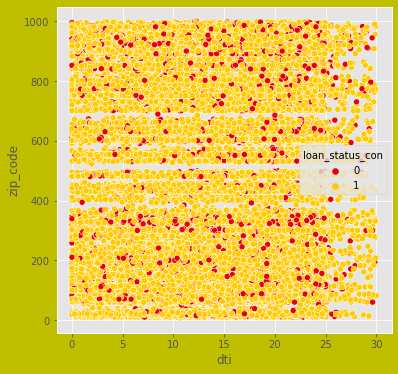

Relationship with dti,open_acc & loan_status_con


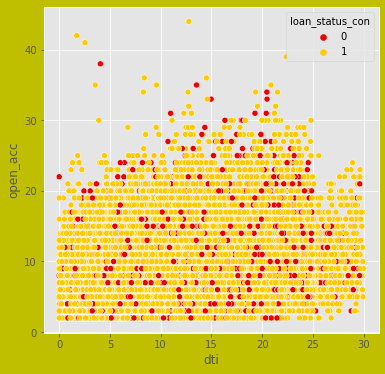

Relationship with dti,pub_rec & loan_status_con


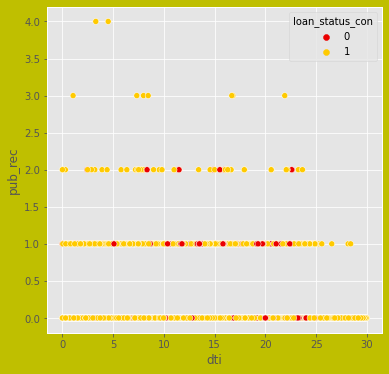

Relationship with dti,revol_bal & loan_status_con


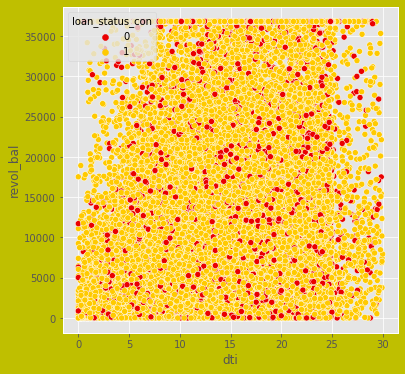

Relationship with dti,revol_util & loan_status_con


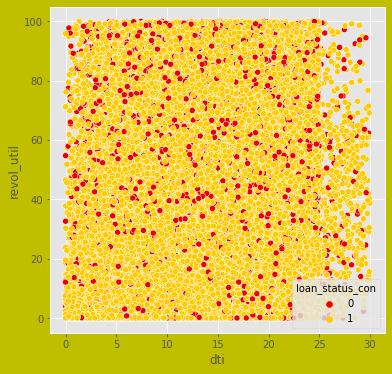

Relationship with dti,total_acc & loan_status_con


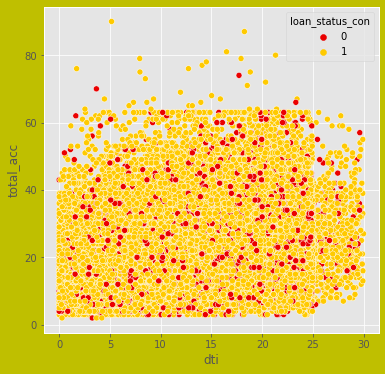

In [109]:
#Analysis#

#dti# not much related with continuous variables

for i in con : 
        bivariate_continuous(['scatter'],'dti',i,'loan_status_con')

Relationship with open_acc,loan_amnt & loan_status_con


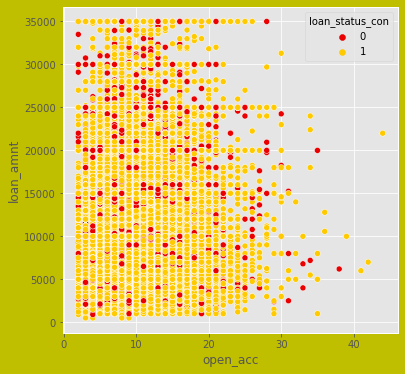

Relationship with open_acc,term & loan_status_con


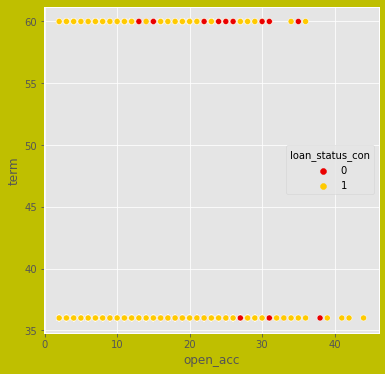

Relationship with open_acc,int_rate & loan_status_con


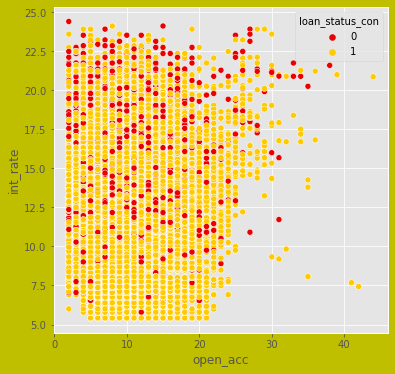

Relationship with open_acc,installment & loan_status_con


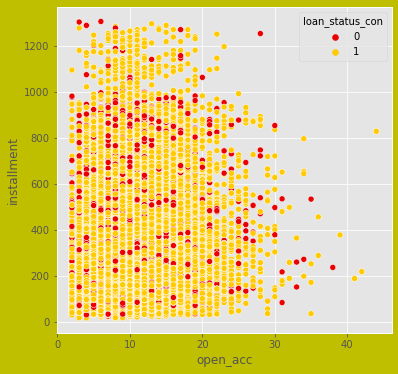

Relationship with open_acc,emp_length & loan_status_con


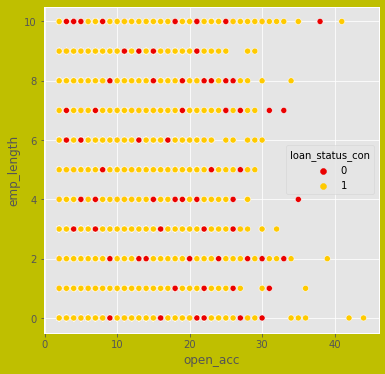

Relationship with open_acc,annual_inc & loan_status_con


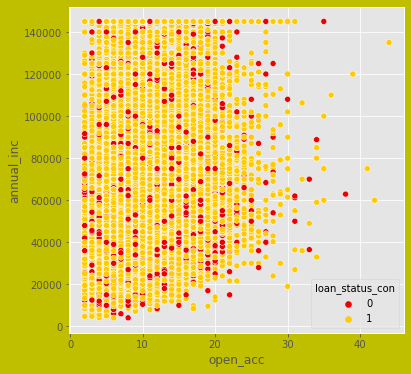

Relationship with open_acc,zip_code & loan_status_con


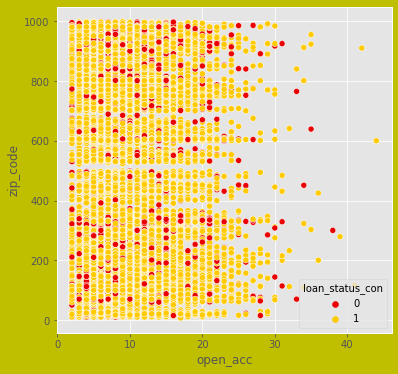

Relationship with open_acc,dti & loan_status_con


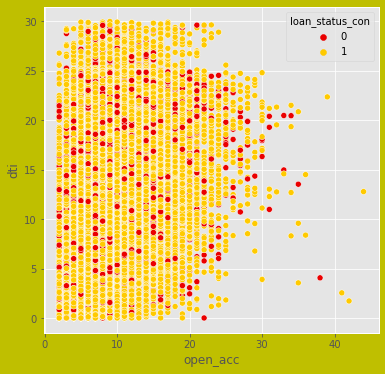

Relationship with open_acc,pub_rec & loan_status_con


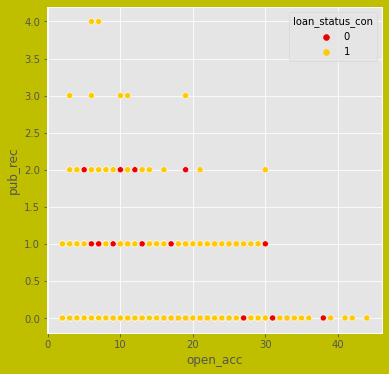

Relationship with open_acc,revol_bal & loan_status_con


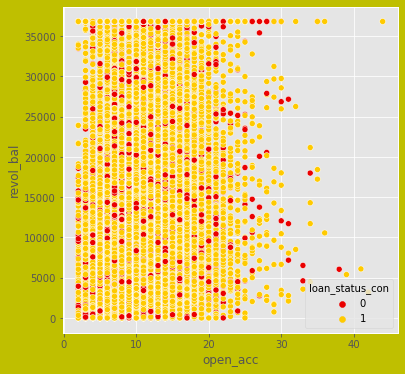

Relationship with open_acc,revol_util & loan_status_con


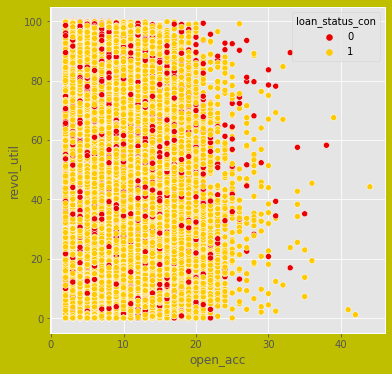

Relationship with open_acc,total_acc & loan_status_con


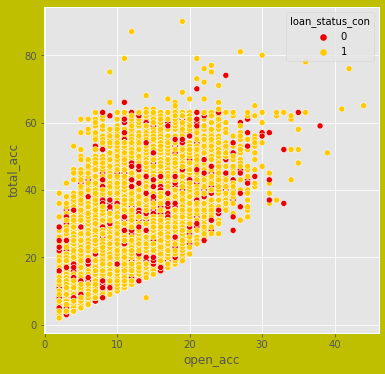

In [110]:
#Analysis#

#open_acc# not much related with continuous variables

# Open acct shared relation ship with int_rate, installment, total_acc

for i in con : 
        bivariate_continuous(['scatter'],'open_acc',i,'loan_status_con')

Relationship with pub_rec,loan_amnt & loan_status_con


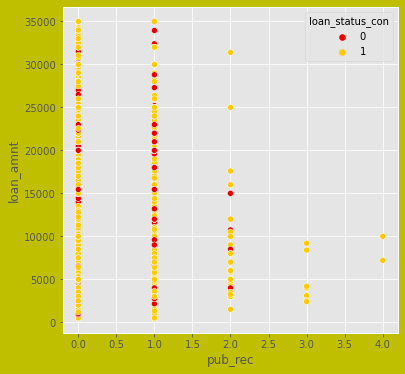

Relationship with pub_rec,term & loan_status_con


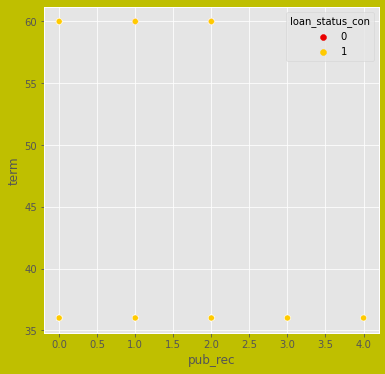

Relationship with pub_rec,int_rate & loan_status_con


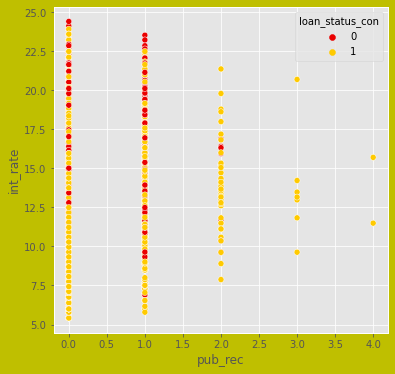

Relationship with pub_rec,installment & loan_status_con


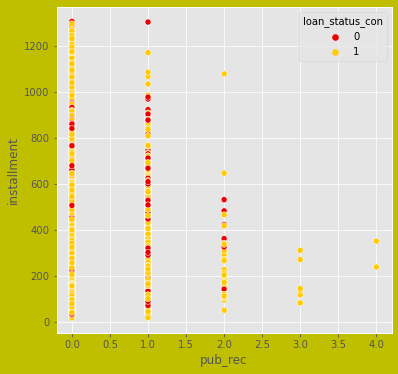

Relationship with pub_rec,emp_length & loan_status_con


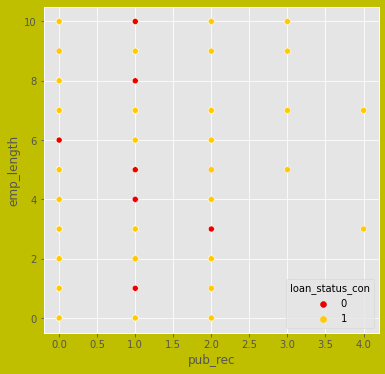

Relationship with pub_rec,annual_inc & loan_status_con


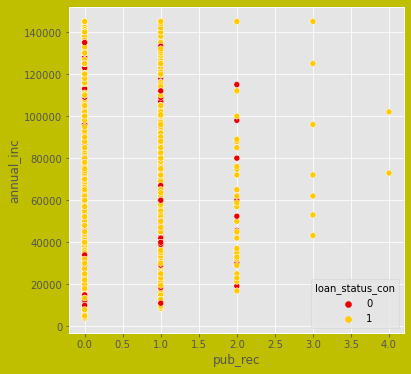

Relationship with pub_rec,zip_code & loan_status_con


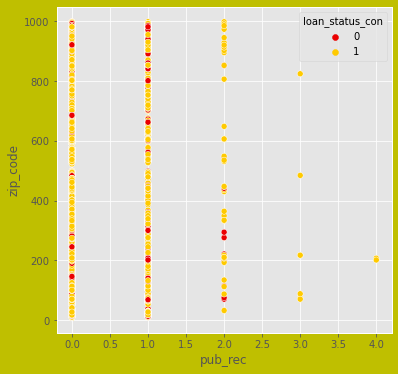

Relationship with pub_rec,dti & loan_status_con


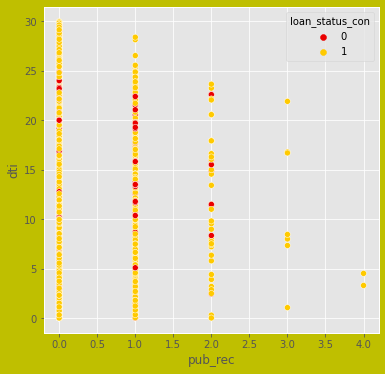

Relationship with pub_rec,open_acc & loan_status_con


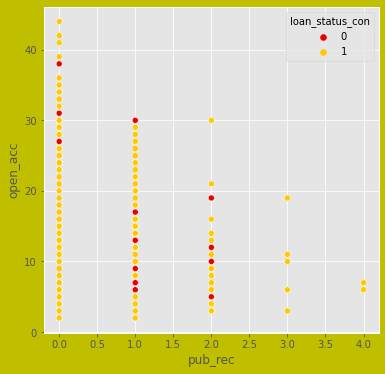

Relationship with pub_rec,revol_bal & loan_status_con


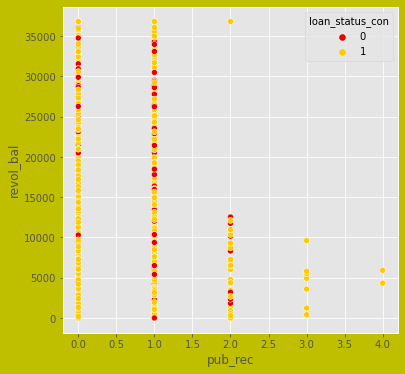

Relationship with pub_rec,revol_util & loan_status_con


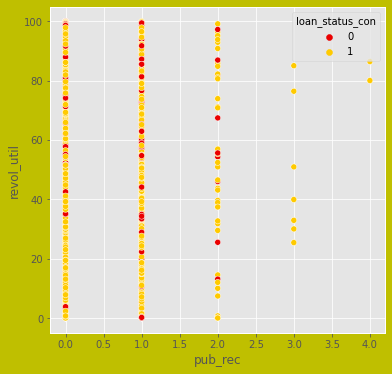

Relationship with pub_rec,total_acc & loan_status_con


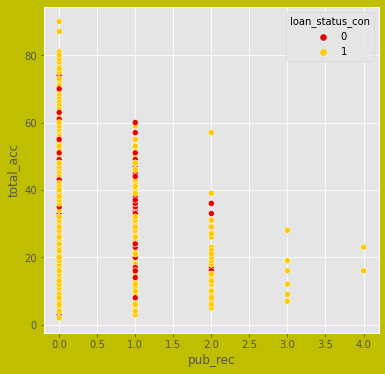

In [111]:
#pub_rec - no relationships

for i in con : 
        bivariate_continuous(['scatter'],'pub_rec',i,'loan_status_con')

Relationship with revol_bal,loan_amnt & loan_status_con


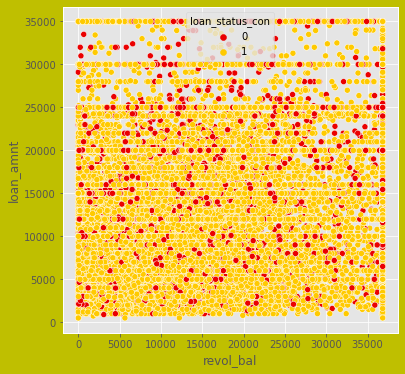

Relationship with revol_bal,term & loan_status_con


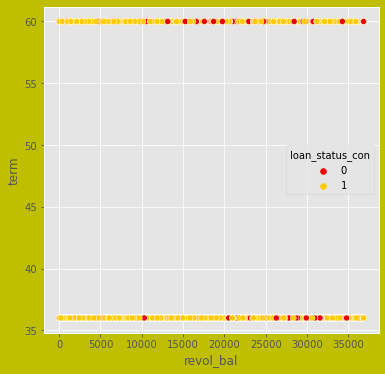

Relationship with revol_bal,int_rate & loan_status_con


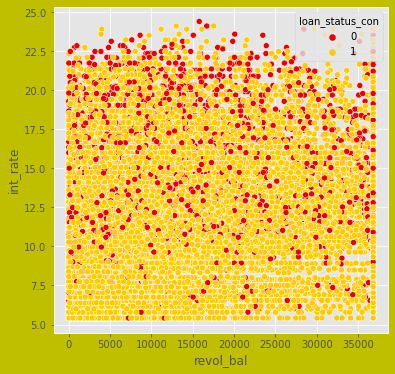

Relationship with revol_bal,installment & loan_status_con


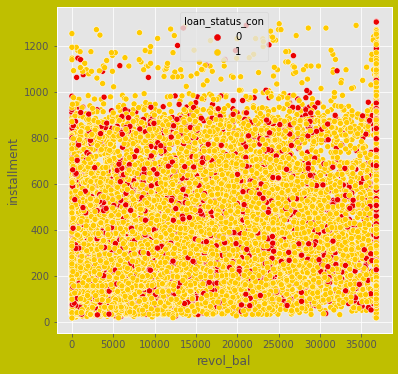

Relationship with revol_bal,emp_length & loan_status_con


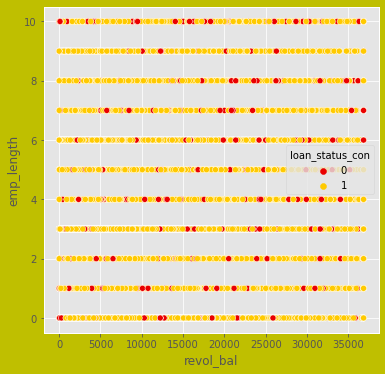

Relationship with revol_bal,annual_inc & loan_status_con


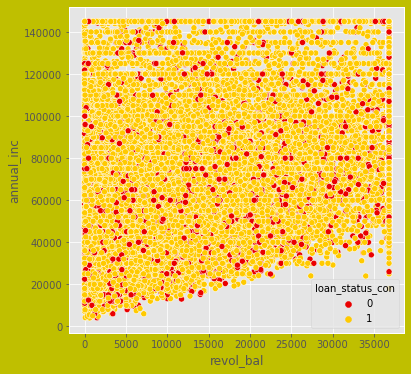

Relationship with revol_bal,zip_code & loan_status_con


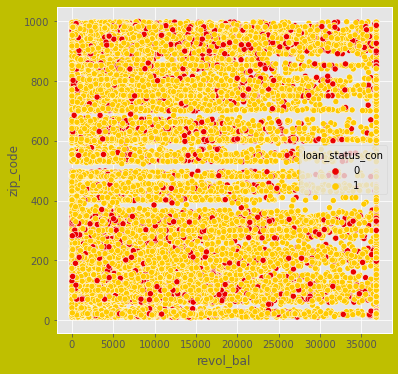

Relationship with revol_bal,dti & loan_status_con


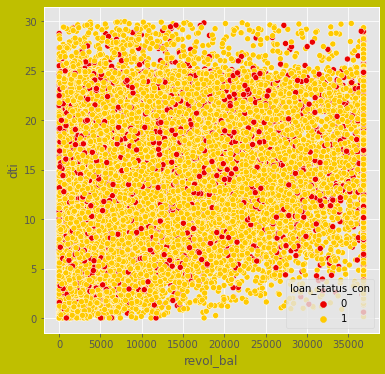

Relationship with revol_bal,open_acc & loan_status_con


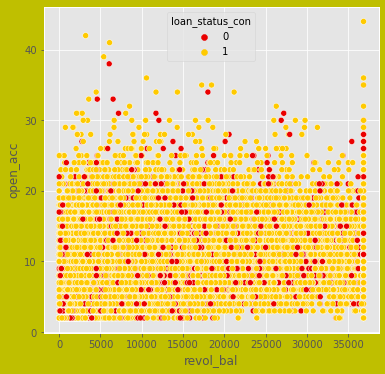

Relationship with revol_bal,pub_rec & loan_status_con


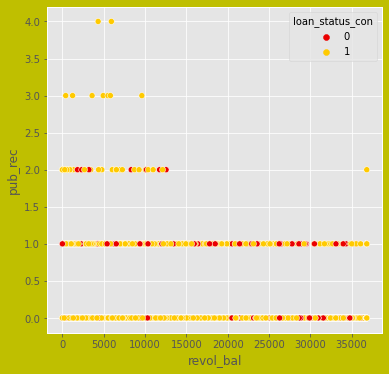

Relationship with revol_bal,revol_util & loan_status_con


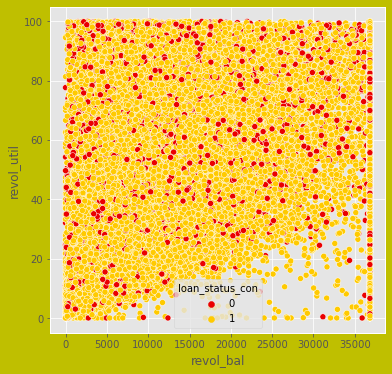

Relationship with revol_bal,total_acc & loan_status_con


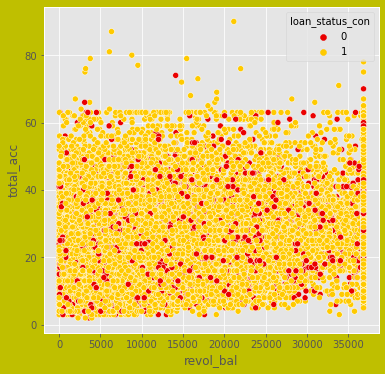

In [112]:
#revol_bal - no relationship

for i in con : 
        bivariate_continuous(['scatter'],'revol_bal',i,'loan_status_con')

Relationship with revol_util,loan_amnt & loan_status_con


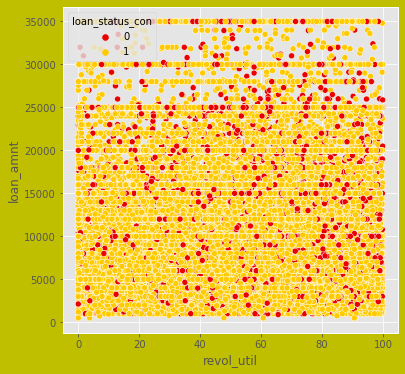

Relationship with revol_util,term & loan_status_con


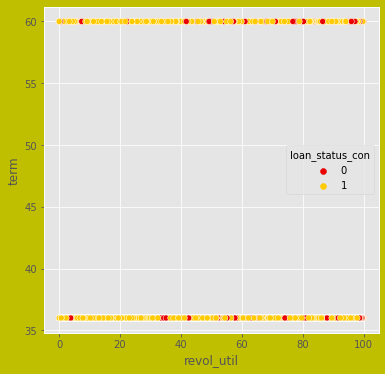

Relationship with revol_util,int_rate & loan_status_con


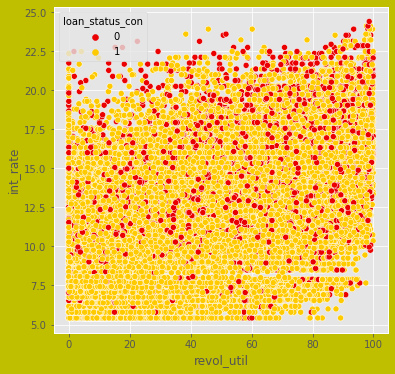

Relationship with revol_util,installment & loan_status_con


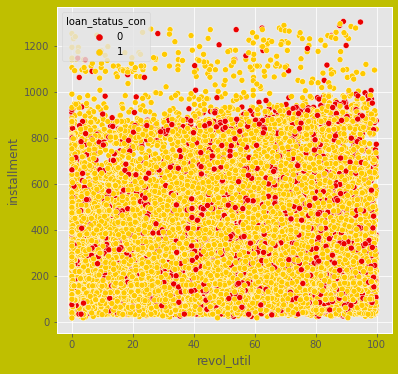

Relationship with revol_util,emp_length & loan_status_con


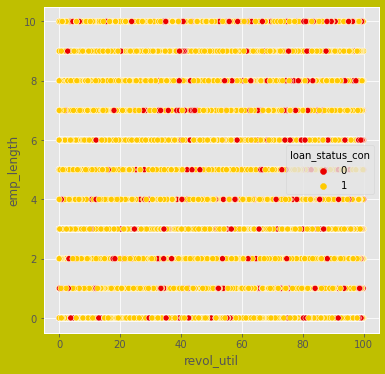

Relationship with revol_util,annual_inc & loan_status_con


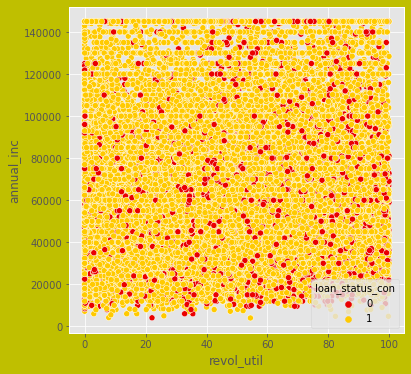

Relationship with revol_util,zip_code & loan_status_con


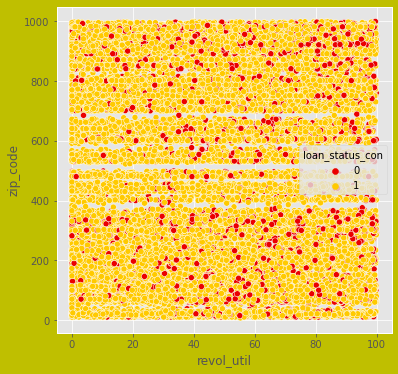

Relationship with revol_util,dti & loan_status_con


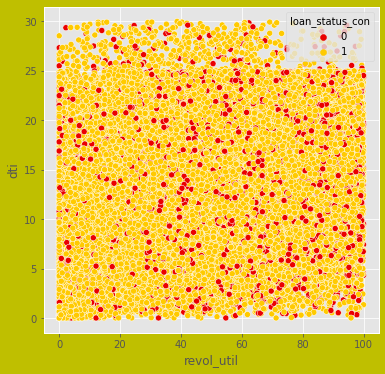

Relationship with revol_util,open_acc & loan_status_con


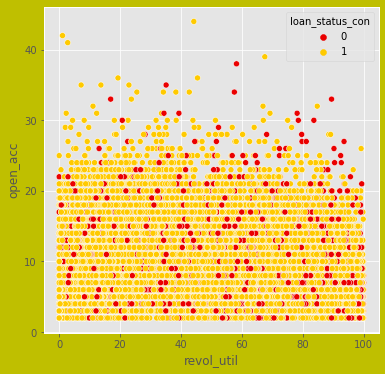

Relationship with revol_util,pub_rec & loan_status_con


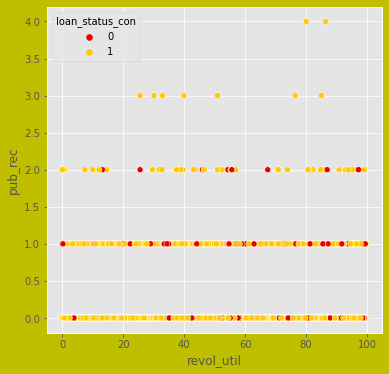

Relationship with revol_util,revol_bal & loan_status_con


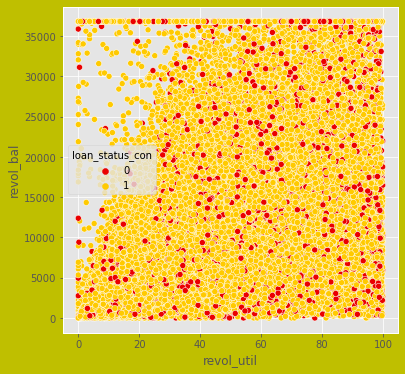

Relationship with revol_util,total_acc & loan_status_con


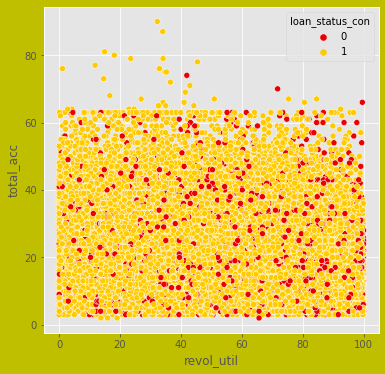

In [113]:
#revol_util 

# Related with int rate

for i in con : 
        bivariate_continuous(['scatter'],'revol_util',i,'loan_status_con')

# Continuous vs Categorical

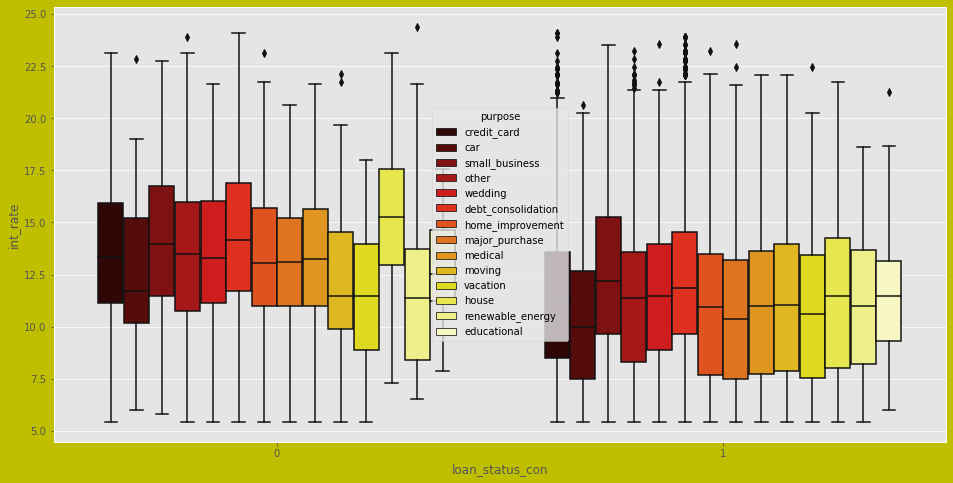

<Figure size 1152x576 with 0 Axes>

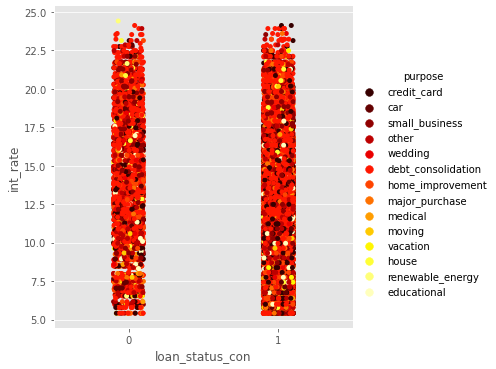

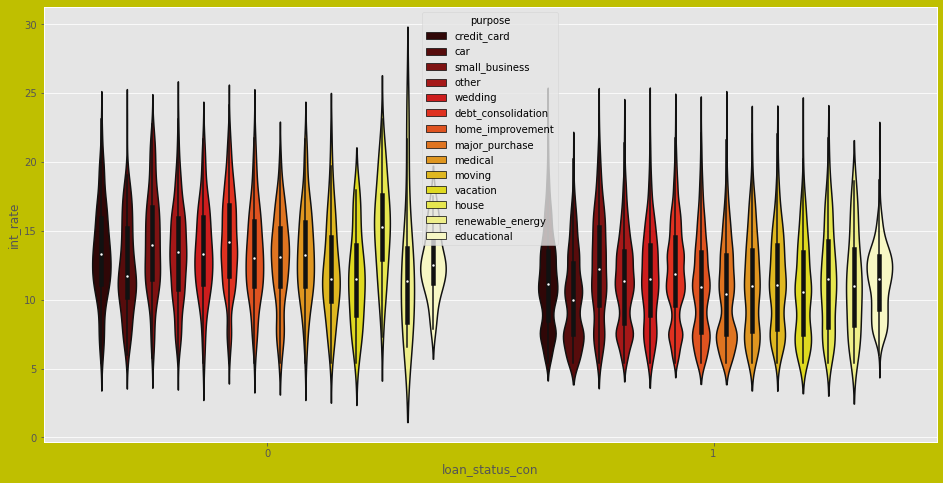

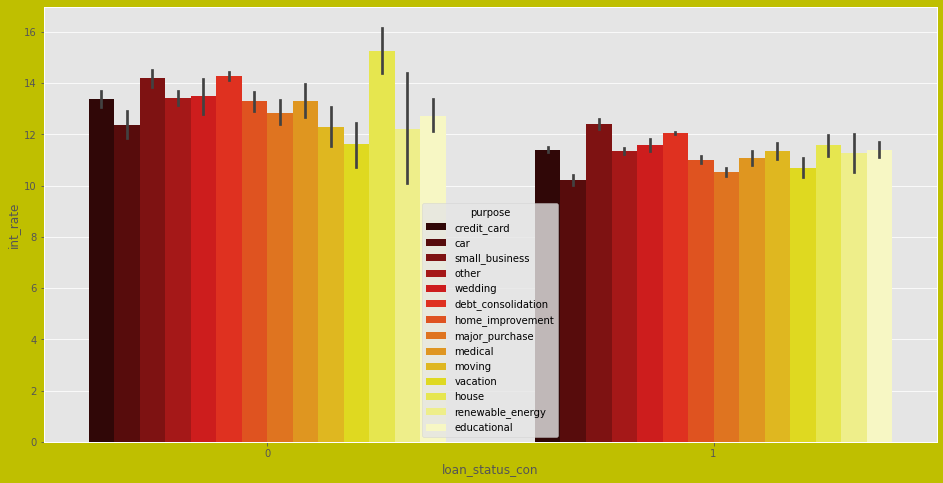

In [114]:
# Relationship between int_rate, loan_status_con and purpose
# Interest Rate for Defaulters are quite high 
bivariate_categorical(['box','cat','violin','bar'],'loan_status_con','int_rate','purpose',16,8)

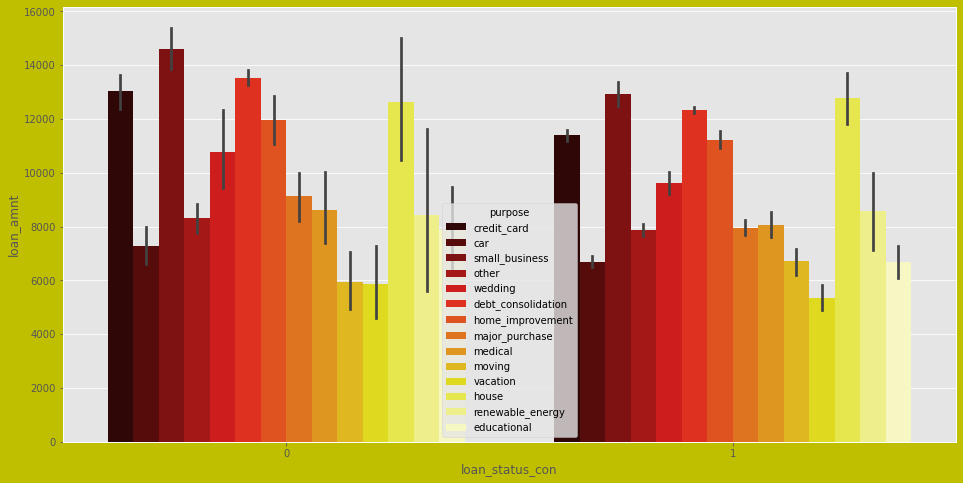

In [115]:
# Relationship between loan_amnt, loan_status_con and purpose
# Loan amount for most of defaulters are high for each purpose
bivariate_categorical(['bar'],'loan_status_con','loan_amnt','purpose',16,8)

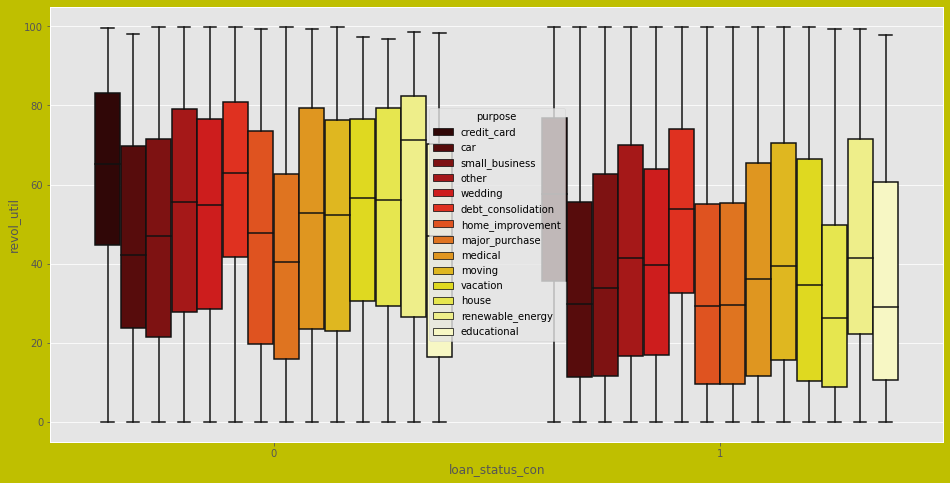

<Figure size 1152x576 with 0 Axes>

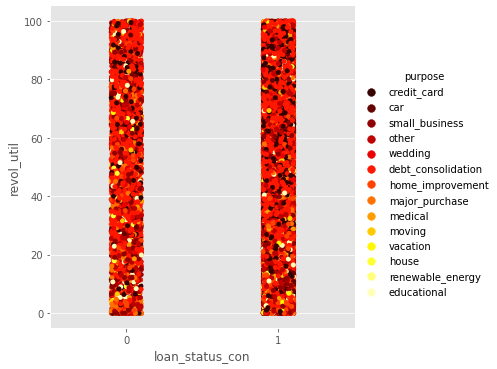

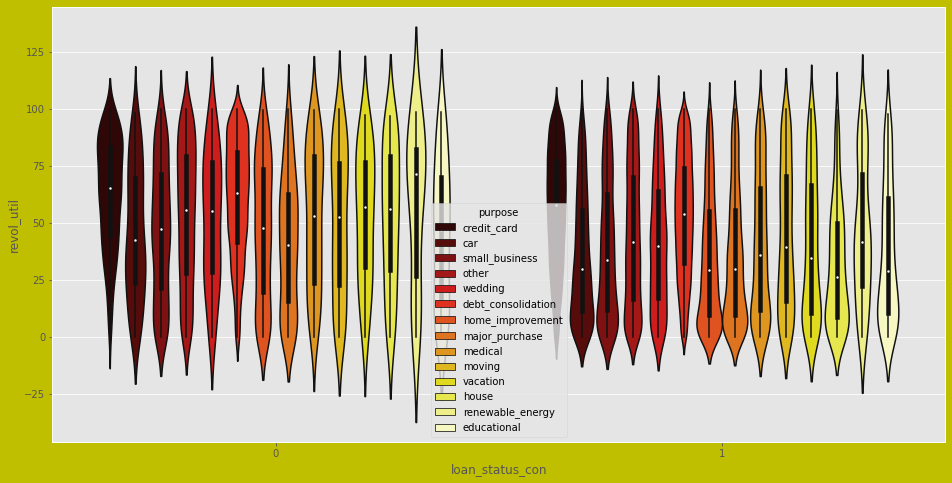

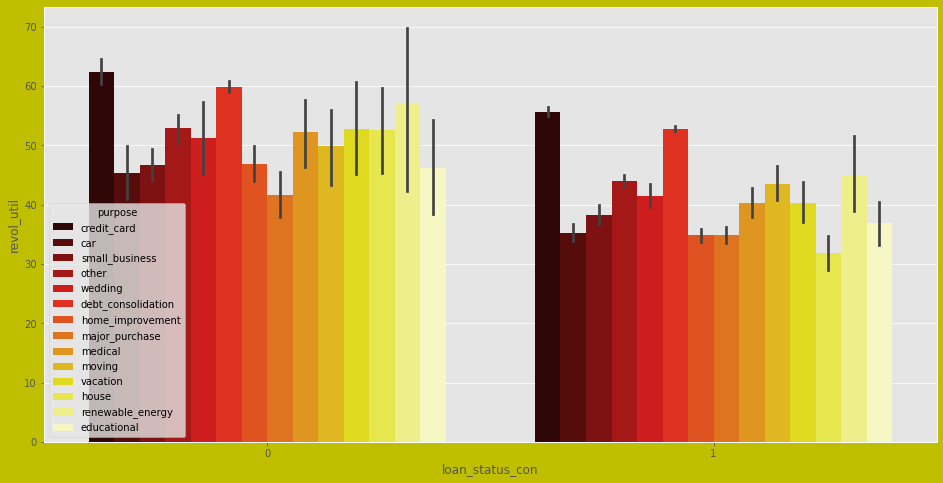

In [116]:
# Relationship between revol_util, loan_status_con and purpose
# revol credit utilization for defaulters are high 
# revol credit utlization is quite high for renewable energy and credit_card
bivariate_categorical(['box','cat','violin','bar'],'loan_status_con','revol_util','purpose',16,8)

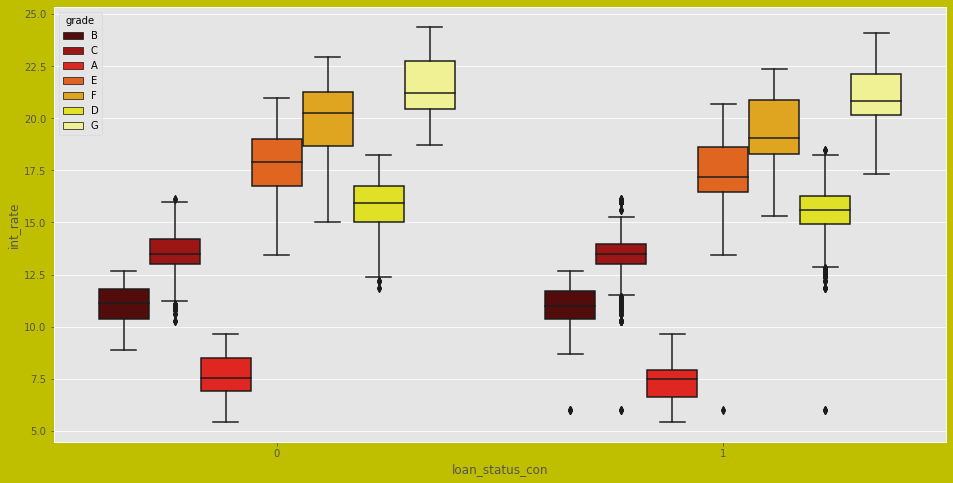

<Figure size 1152x576 with 0 Axes>

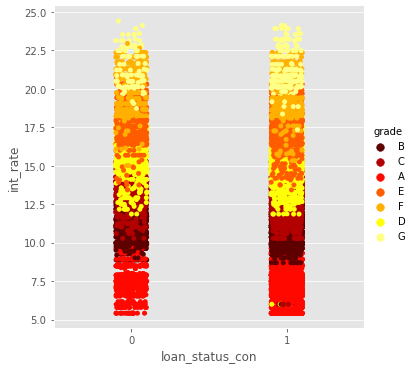

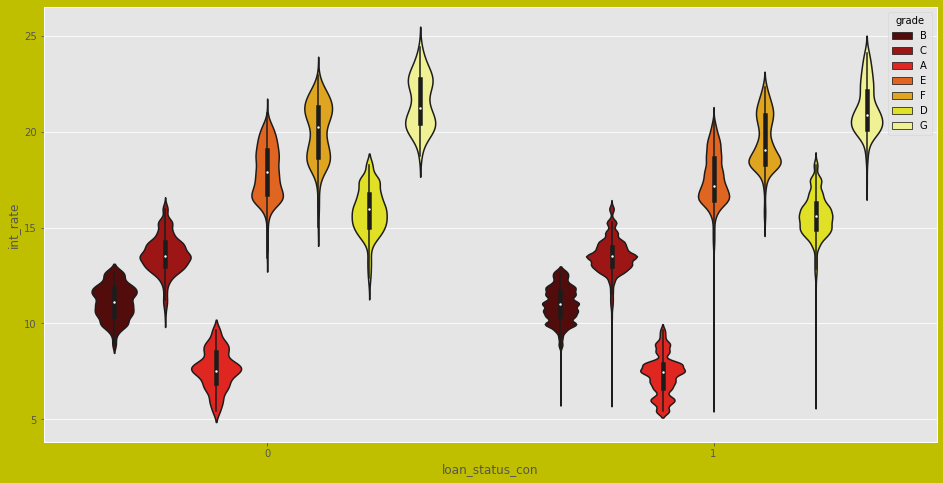

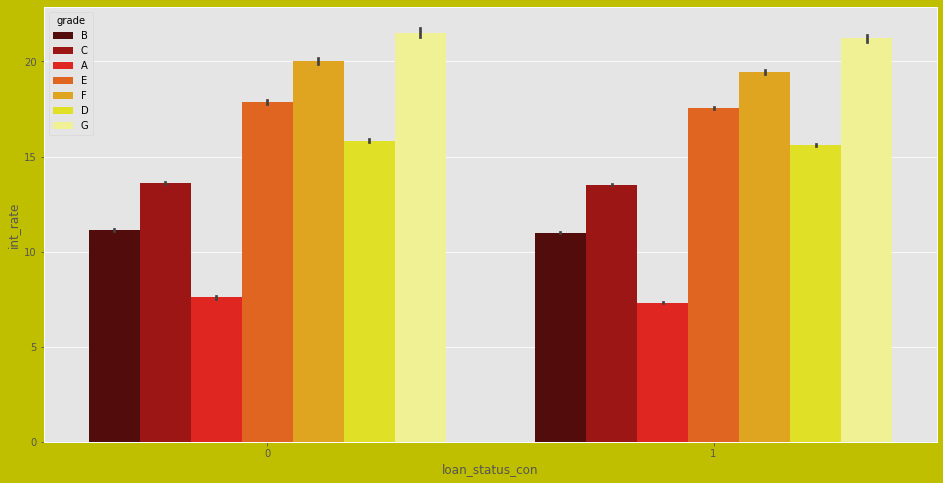

In [117]:
# Relationship between int_rate, loan_status_con and grade
# Interest Rate for Defaulters are quite high
# Grade G have the highest Default rate and then grade F
# Most of of the defaulters of Grade E,F,G,D have their median greater than 75% Q3 of int_rate
bivariate_categorical(['box','cat','violin','bar'],'loan_status_con','int_rate','grade',16,8)

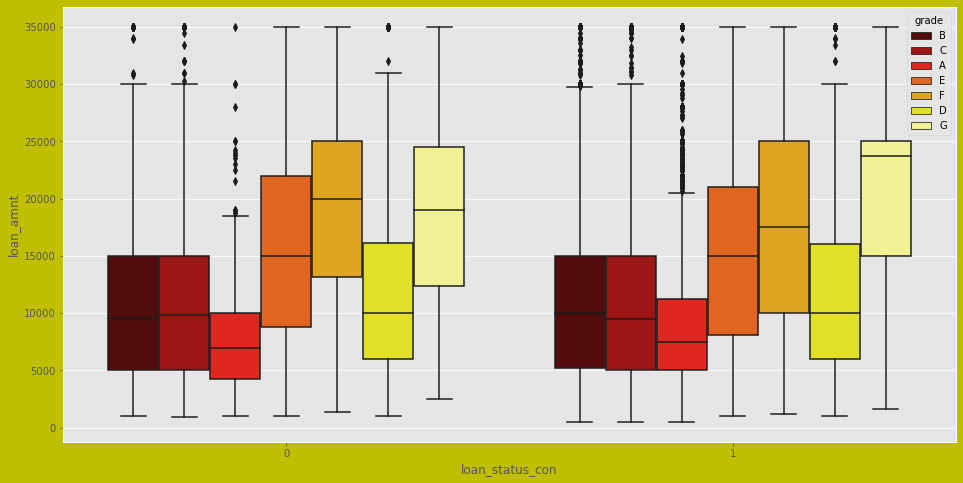

<Figure size 1152x576 with 0 Axes>

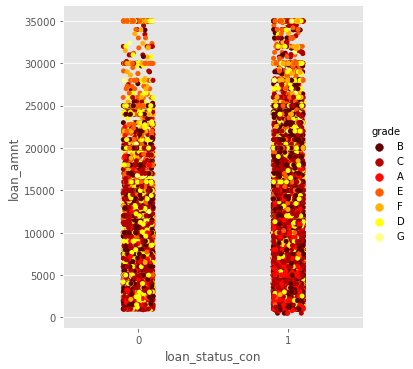

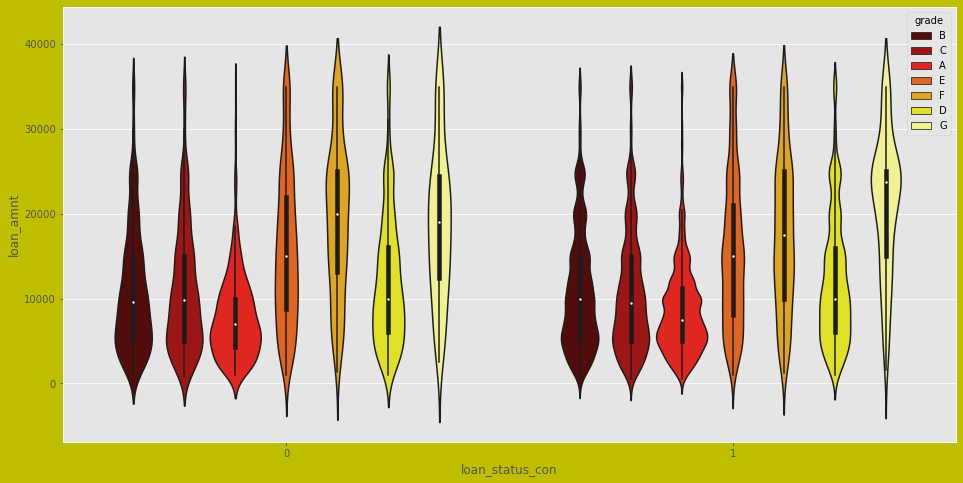

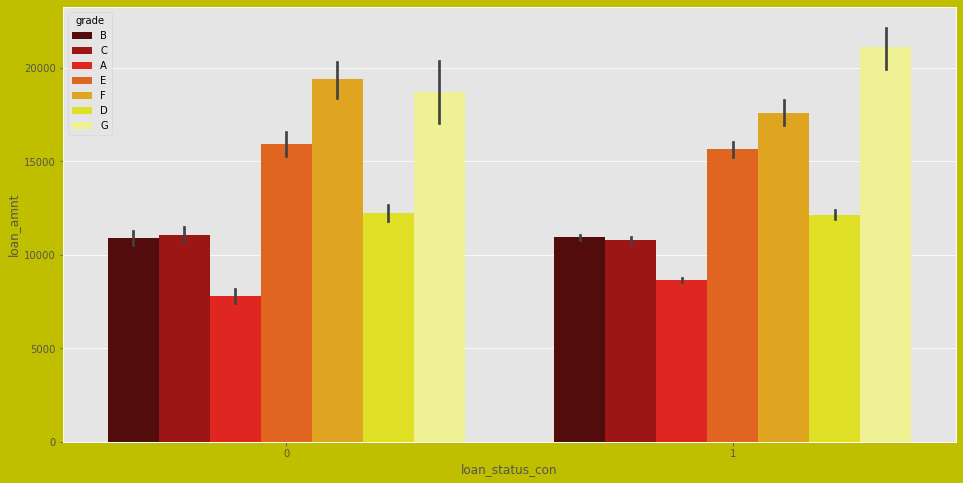

In [118]:
# Relationship between loan_amnt, loan_status_con and grade
# loan amnt for Defaulters are quite high specifically for G & F its quite high
bivariate_categorical(['box','cat','violin','bar'],'loan_status_con','loan_amnt','grade',16,8)

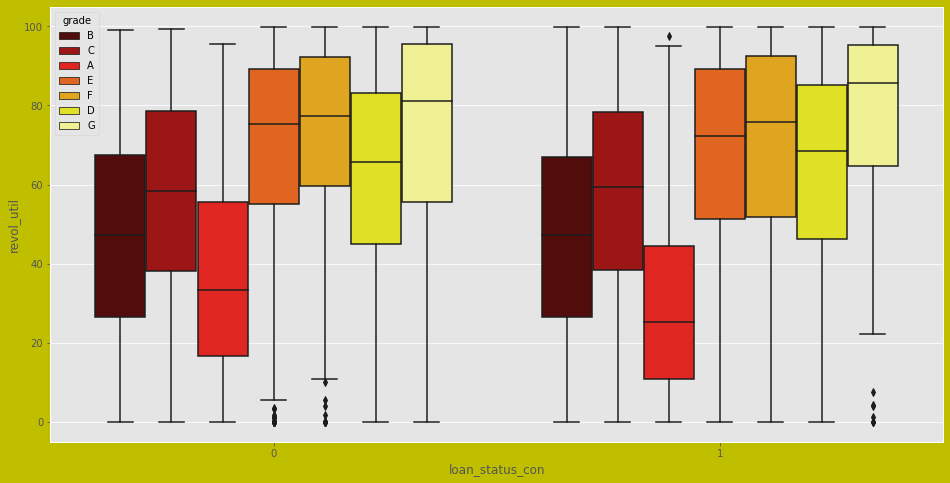

<Figure size 1152x576 with 0 Axes>

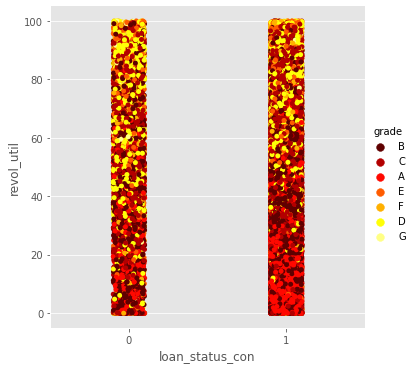

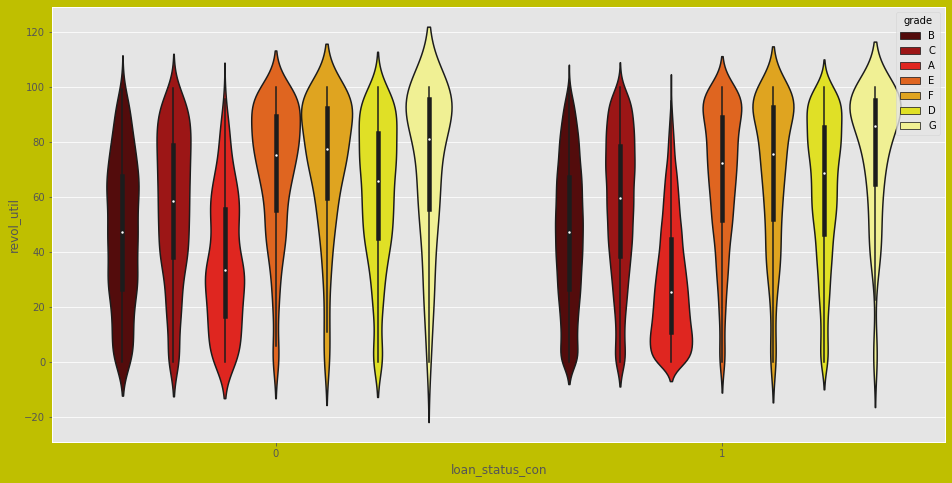

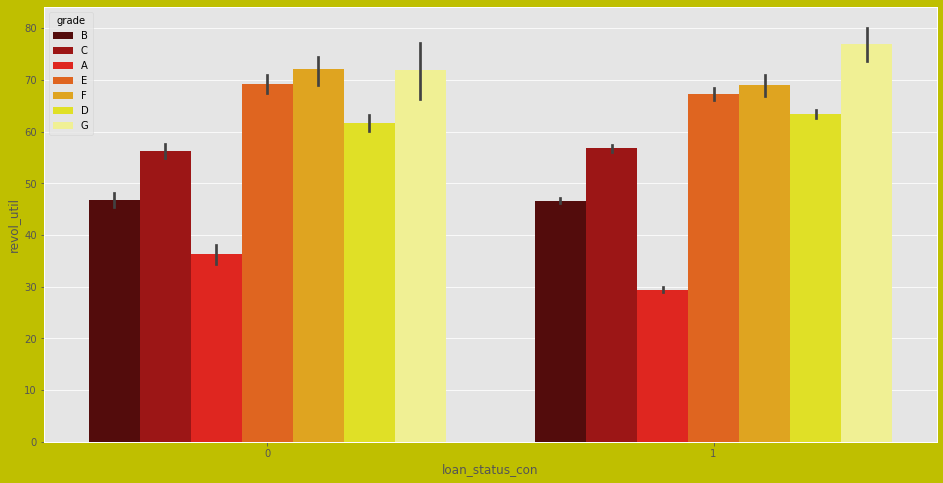

count    38516.00000
mean        48.70412
std         28.36331
min          0.00000
25%         25.20000
50%         49.10000
75%         72.30000
max         99.90000
Name: revol_util, dtype: float64

In [119]:
# Relationship between revol_util, loan_status_con and grade
# revol_util for Defaulters are quite high specifically for Grade G & Grade F
bivariate_categorical(['box','cat','violin','bar'],'loan_status_con','revol_util','grade',16,8)
loan_v1['revol_util'].describe()

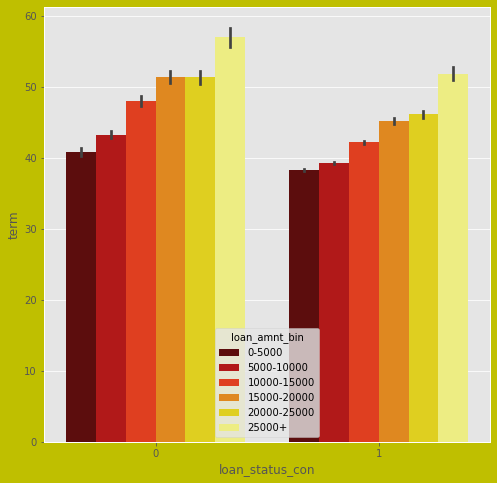

In [120]:
# Relationship between loan_amnt_bin, loan_status_con and term
# term for Defaulters are quite high specifically for loan_amnt > 25000
bivariate_categorical(['bar'],'loan_status_con','term','loan_amnt_bin',8,8)

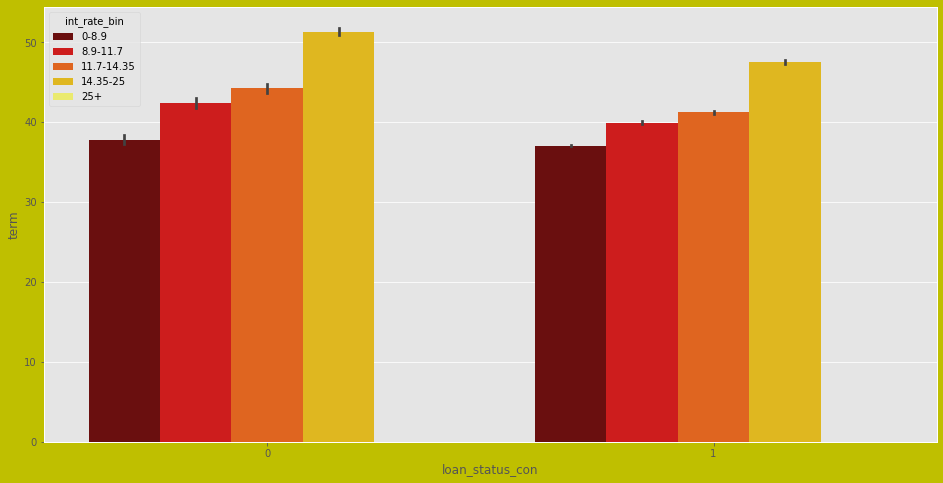

In [121]:
# Relationship between term, loan_status_con and int_rate_bin
# Interest Rate for Defaulters are quite high and increasing with term
bivariate_categorical(['bar'],'loan_status_con','term','int_rate_bin',16,8)

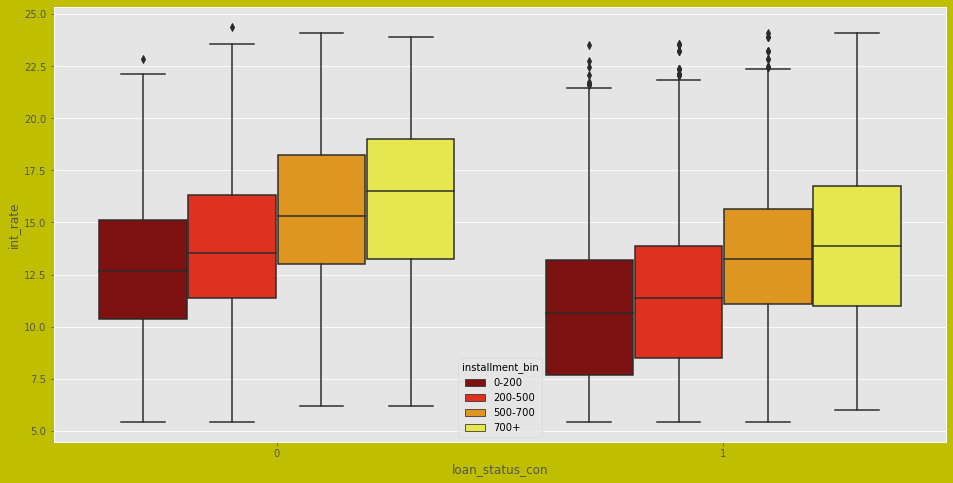

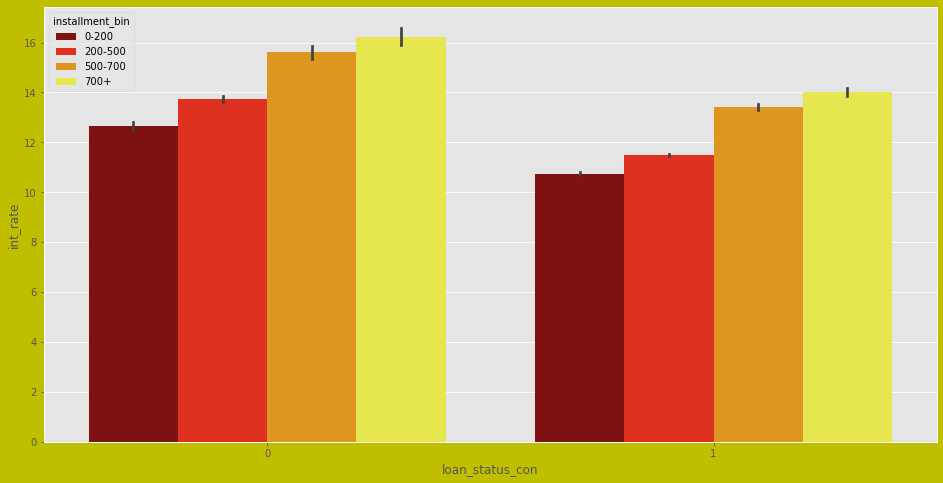

count    38516.000000
mean        11.926877
std          3.690111
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
max         24.400000
Name: int_rate, dtype: float64

In [122]:
# Relationship between int_rate, loan_status_con and installment
# Interest rate and installments of defaulters are quite high
# Most of the defaulters of each installment bin have their median close to Q3 value of int_rate
bivariate_categorical(['bar','box'],'loan_status_con','int_rate','installment_bin',16,8)
loan_v1['int_rate'].describe()

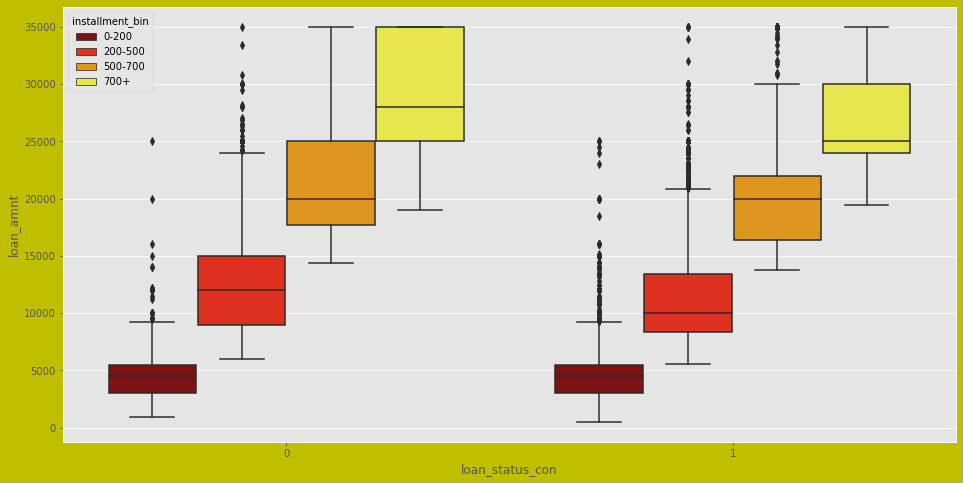

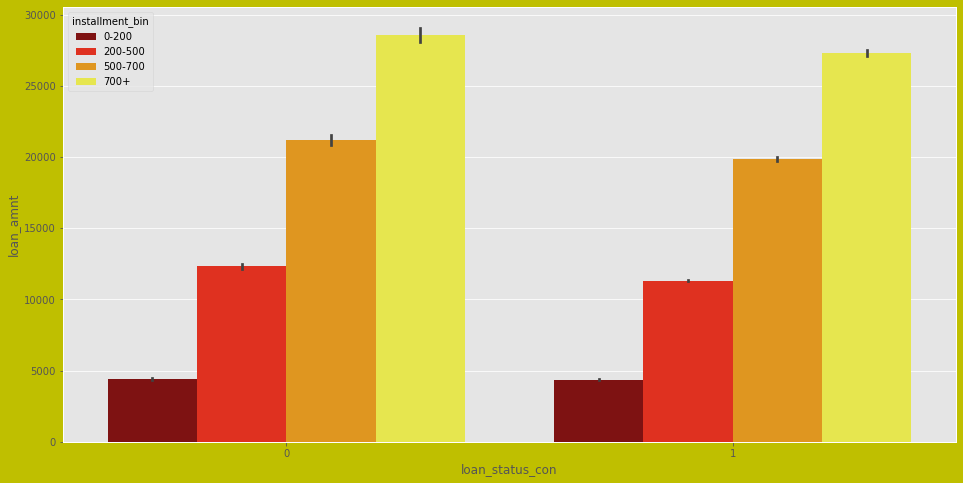

In [123]:
# Relationship between loan_amnt, loan_status_con and installment
#loan amount and installments of defaulters are very high
# Median for installment bin 500-700 & 700+ is greater then the Q3 value of loan_amount
bivariate_categorical(['bar','box'],'loan_status_con','loan_amnt','installment_bin',16,8)

# Categorical vs Categorical variable 

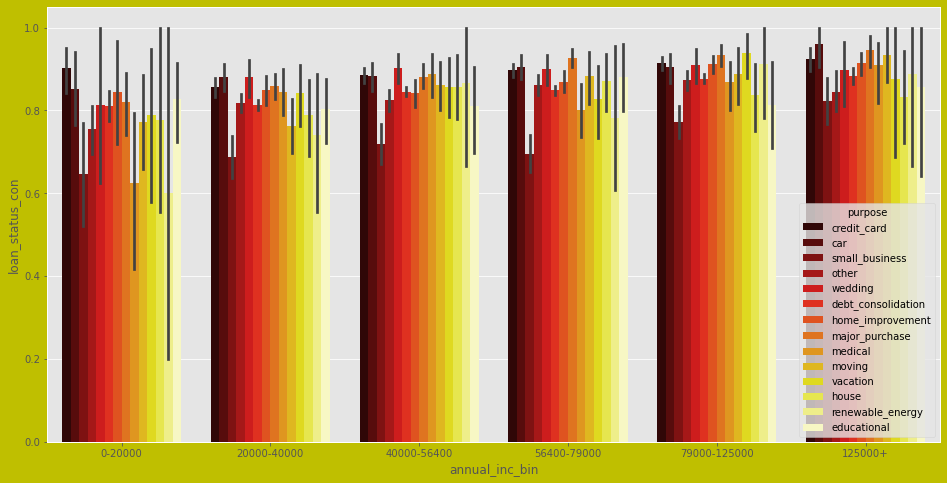

In [124]:
# Relationship between annual_inc_bin, loan_status_con and purpose

# It doesnot exhibit much relation

bivariate_categorical(['bar'],'annual_inc_bin','loan_status_con','purpose',16,8)

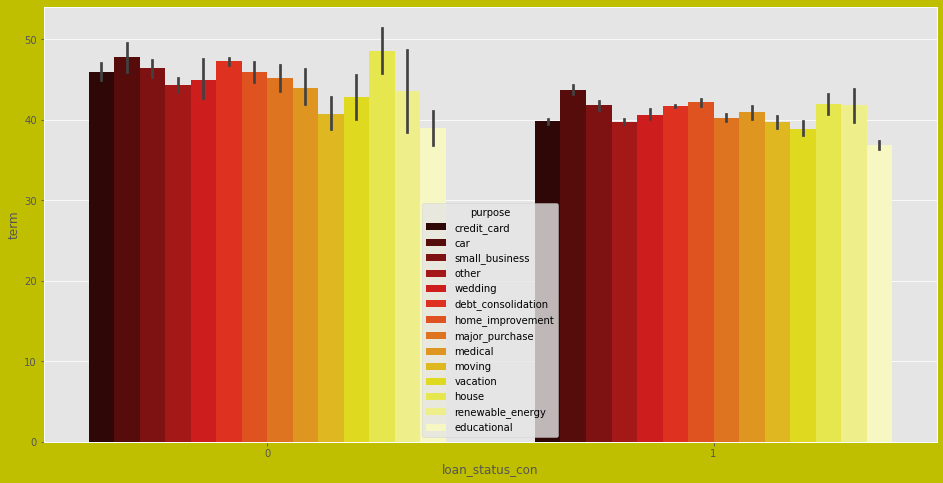

In [125]:
# Relationship between term, loan_status_con and purpose

# Defaulters have highest term for each purpose

bivariate_categorical(['bar'],'loan_status_con','term','purpose',16,8)

In [ ]:
# Relationship between installment_bin, loan_status_con and purpose

# Default rate is increasing for each purpose with the increase in the installment

bivariate_categorical(['bar'],'installment_bin','loan_status_con','purpose',16,8)

In [ ]:
# Relationship between pub_rec, loan_status and purpose

# Default rate is increasing for each purpose with the increase in public rec

bivariate_categorical(['bar'],'loan_status','pub_rec','purpose',16,8)

# Multivariate Analysis

In [ ]:
#Important Features & correlation

#loan_amnt , annual_inc , installment , int_rate
#int_rate , revol_util , term , installment
# dti , revol_util
# term , int_rate, loan_amnt

sb.pairplot(loan_v1[con])

In [ ]:
con.append('loan_status_con')
# adding loan_status continuous variable to continuous variable list

In [ ]:
# Multi variate analysis Correlation 

#Important Features & correlation

#loan_amnt , annual_inc , installment , int_rate
#int_rate , revol_util , term , installment
# dti , revol_util
# term , int_rate, loan_amnt
 

plt.figure(figsize=(20,20))
sb.clustermap(loan_v1[['dti','int_rate','installment','loan_status_con','loan_amnt','revol_util','emp_length','pub_rec','annual_inc','term']].corr(),cmap="Reds",annot=True,figsize=(20,20),vmin=-1.0,vmax=1.0)

plt.show()

loan_v1.corr()

>> ###       DATA Cleaning - Missing Value Treatment Analysis Report

                                  # Data Cleaning #
                                  
                          # MISSING DATA TREATMENT ANALYSIS SUMMARY #

 Removing funded_amnt & funded_amnt_inv columns since we are interested in loan_amnt columns only before approval

 Dropped columns which have null values in all the rows i.e. 100 % Null Values

           
        
> ### Columns which are left with Null Values Updating status followed by sequential steps and analysis below

- emp_title   - Dropping Column since Percentage of unique values  is 72.65 imputing this column is insignificant.

- emp_length  - It can be a significant column imputing values with mode since its a categorical column.

- desc        - Dropping Column since 32.47 % values are missing from this columns and have significant unique    values cannot be use for EDA.

- mths_since_last_delinq     - Dropping Column since 64.56 % of values are null imputing this column will add bias

- mths_since_last_record     - Dropping Column since it has more than 80 % of Null values

- last_pymnt_d               - Dropping Column since this feature will be useful once the loan is approved and user  starts making payments 

- next_pymnt_d               - Dropping Column since it has more than 80 % of Null values

- title                      - Dropping Rows we have 0.03 % Missing Values i.e 10 rows and 50 % Distinct value instead of removing this columns we will remove the rows which are null

- revol_util                 - Dropping Rows where this column is null revolving credit utilization is an imp aspect

- last_credit_pull_d         - Dropping column Since column is not much significant in taking the decision for approvals

- collections_12_mths_ex_med - Dropping Column Since Only 1 unique value is present for all the rows i.e 0.0 hence this column is insignificant  hence no use of replaceing 56 Nan values

- chargeoff_within_12_mths   - Dropping Column Since Only 1 unique value is present for all the rows i.e 0.0 hence this column is insignificant  hence no use of replaceing 56 Nan values

- tax_liens                  - Dropping since All the rows have sing value 0.0 hence this column is insignificant for analysis

- pub_rec_bankruptcies       - Dropping Column Please refer below analysis
-                                 Have outliers Considering Outliers imputed median and observed we have only one value 0.0 
-                               Hence it is not significant for analysis hence dropped the columns 


>               ## Dropping Below columns based on analysis #
                
- out_prncp & out_prncp_inv    - contains single values 0.0 in all the rows hence dropping these columns
- policy_code column           - contain single value 1 in all the rows hence dropping this column
- acc_now_delinq               - column contain single value 0 in all the rows hence dropping this column
- delinq_amnt                  - column contain single value o in all the rows hence dropping this column
- application_type             - single valued Individual not useful

> Removed Customer Behavior Variables and which have least correlation : 

    - 'collection_recovery_fee', 'recoveries', 'total_rec_late_fee' ,'inq_last_6mnths,delinq_2yrs'
    
> Removed Customer Behavior Variables and which will be in use for loan tracking and once loan approved

    - 'total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','last_pymnt_amnt'

- Removed 'pymnt_plan' since it has single value n for all the rows

- Removed 'URL' since its not significant
 
- Removed 'initial_list_status' constant value f for all the columns

- Removed title since it has multiple distinct values for all the columns


                                
    
>                                    # Assumption #

Considering values greater than Q3+1.5*IQR(Upper Bound) & Q1-1.5*IQR(Lower Bound) for Outliers treatment provided we got approval from Business


>                              ##Data Summary After Cleaning##


Rows     :  38516
Columns  :  22

Features : 
 ['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'zip_code', 'addr_state', 'dti', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']

Missing values :   0

Percentage of rows deleted : 3.02%

### Removed rows where loan_status = 'Current' since we are not sure whether it will be defaulted or Fully paid

#Total Rows deleted loan_status = 'Current' is 3 %

List of Categorical Variables:

 ['grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'earliest_cr_line']

List of Continous Variables :

 ['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'zip_code', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc']


>> # Univariate Analysis Report

                        # Univariate Analysis Categorical Features #
    
>> Converting Categorical column loan_status by replacing Fully Paid as 1 and Charged Off as 0 
    
## Categorical Columns
    
### grade || Type - categorical 

Analysis 

- Excluding Grade B which has constituted to 30.3% of loan application Relative change in grade will decrease in the no of loan application recieved 57.4 % of loan applications are from Grade A & B

### sub_grade || Type - categorical

Analysis

Highest no of Loan application are received from sub-Grade A4

- 57.4 % of loan applications are from Grade A & B
- 34.9% of total applications belongs to sub category A - A4, A5 & B - B3,B4,B5


### loan_status || Type -Categorical
Analysis 

- Around 14.6%  of applications are Charged off 85.4 % of loans are fully paid

### home_ownership 

#Power Law Distribution 

Analysis  

- A relative change in home_ownership loan type result in proportional change in loan applied i.e. The Most of loan applied by the Customers are usually living on Rent i.e 47.9% and then having Mortgage around 44.2%

### verification_status

Analysis 

- Maximum no around 44.3 % of loan applications are present for which the verification_status is not verified

### purpose

Analysis

- The relative change change in purpose will result in no of loans applied Majority of loans were taken for Debt Consolidation around 46.8 %


### addr_state 

Analysis 

- Most no of loans are applied from addr_state "CA" i.e 18 % of totall loan applied

### issue_date_month 

analysis

- We can see a trend most of the loan application are received in Dec 

- Dec to Jan a continous decrease in the amount of loan application applied except Feb which have more application than Jan

### issue_date_year 

analysis

- 53.2 % of total applications were received in 2011 itself and no of applications are decreasing with no of years

### earliest_cr_line_month & earliest_cr_line_year

analysis

- Its seems to be distributed across no much information deducted here





In [ ]:
print("\n                                     Univariate Summary Statistics\n")
loan_v1.describe()

                            # Univariate Analysis - Continous Variable

Analysis

### loan_amnt: 

Maximum no of loans are applied for loan_amnt : 10000 around 2807 loan applicants

- Percentage of total loan applicants in Q1 & Q3  range : 52.63 %
- Percentage of total loan applicants greater than Q3  range : 22.37 %
- Percentage of total loan applicants less than Q1  range : 25.0 %

### term

- Based on the Analysis there are two loan terms exits 36 & 60 

- Maximum number of loans has been applied for the term 36 months

### int_rate

-- Maximum no of approved loans are on 10.99 int rate

> Q3  Percentile Value : 14.35 and Q1 Value : 5.42 and IQR Value : 8.93

- Percentage of total loan applicants in Q1 & Q3 interest rate range : 51.36 %
- Percentage of total loan applicants greater than Q3 interest rate  range : 25.25 %
- Percentage of total loan applicants less than Q1 interest rate  range : 24.7 %

### installment

> Q3  Percentile Value : 426.1 and Q1 Value : 15.69 and IQR Value : 410.41

- Percentage of total loan applicants where installment between Q1 and Q3 range : 75.05 %
- Percentage of total loan applicants greater than Q3 installment : 24.

### emp_length

- Percentage of total loan applicants when length of employment between Q1 and Q3 : 55.42 %
- Percentage of total loan applicants when length of employment greater than Q3 : 24.7 %
- Percentage of total loan applicants when length of employment less than Q1 : 19.88 %
- Max no of loans applied  by the employee whose emp_length is greater than 10 years

### annual_inc

- Percentage of total loan applicants where annual Income between Q1 and Q3 : 52.26 %
- Percentage of total loan applicants where annual Income greater Q3 : 24.88 %
- Percentage of total loan applicants where annual Income  less Q1 : 22.86 %

### zip_code

- Highest no of loan application are applied from the region where the zip code = 100

### dti

- Percentage of total loan applicants where Debt to income ratio between Q1 and Q3 : 50.03 % - Moderate
- Percentage of total loan applicants where  Debt to income ratio greater Q3 : 24.97 %  -    Highly Risky
- Percentage of total loan applicants where Debt to income ratio less then Q1 : 24.99 % -    Less Risky

### pub_rec

- Percentage of total loan applicants where no Degoratory Public Record availaible : 94.63 % 
- Percentage of total loan applicants where  Degoratory Public Record greater than 0: 5.37 % -- Could be Risky

### revol_util

- Percentage of total loan applicants where revolving credit utilization between Q1 and Q3  : 49.97 %
- Percentage of total loan applicants where  where revolving credit utilization greater than Q3 : 25.26 % - Could be Risky



### Segmented Univariate Analysis 

> ### Relationship between Grades and Loan_status
- Highest no of charged off - Belongs to Grade G
- Grade A have less no of Defaulters

> ### Relationship between Grades , SubGrades and loan_status

- Highest % of sub grades defaulters are in F5

- From Below plot we can infer that the probability of Charged Off is increasing from A1 - A5

- Below grades & Sub grades have highest Percentage of Defaulters

- A-> A5 - 7.99  % 
- B-> B5 - 13.62 %
- C-> C3 - 18.17 %
- D-> D5 - 25.18 %
- E-> E4 - 29.72 %
- F-> F5 - 48.21 %
- G-> G3 - 42.22 %

> ### Relationship between home_ownership & loan_status

- Highest No of Defaulters are observed with home_ownership OTHER Type 
- Other types home_ownership are unknown

> ### Relationship between addr_state and loan_status

-  60 % of Defaulters  are observed from addr_state 'NE' but no of loan application are very less

- Top 5 states where most no of defaulters are observed
- addr_state
-  NE    60.00
-  NV    22.59
-  SD    19.67
-  FL    19.23
-  HI    18.11

> ## Relationship between verification_status , addr_state & loan_status

- Below verification_status and addr state have more no of defaulters

- Not Verified         NE            60.00
- Verified             TN            50.00
-                      AK            30.43
-                      NV            25.88
-                      SD            25.00

-  Source Verified     NM.           25.00

> ### Relationship between Purpose , loan_status

- loans applied for small_business are most likely to be defaulted Percentage will be 27.07%

> ### Relationship between issue_date_year , loan_status

-  Highest no loans were defaulted in Year 2007

> ### Relationship between purpose , loan_status & loan amount

- Out of the amount invested around 29.57 % of amount has been defaluted in small business

-  Small business loans are more likely to be defaulted

> ### Relationship betweenn emp_length, loan_status & loan_amnt

- Highest no of loan amount has been allocated to employee length 10 or 10 + , Also it has the highest defaullt percentage

> ### Relationship between loan_status & loan_amount_bin range

- Analysis : Defaulter percentage on loan > 25000 is more around 24.49 %

- Higher the loan amount higher the chances of getting defaulted

> ### Relation dti range & loan_status

- Between 20-25 Defaulter percentage is highest

- Higher the DTI rate higher the defaulter percentage

> ### Binning int_rate range

- Defaulter Percentage is more between int range 14.35-25 around 24.67 %

- Default rate is decreasing with decrease in interest rate

> ### Relationship between installment & loan_status

-  Binning installment 

-  Around 17.06 % of defaulters re in range of installments 700+ 

-  Default rate is highest for higher installment

> ### Relationship between Binning annual_inc & loan_status

- Around 20 % of defaulters are in range of installments 0-20000 and rate is decreasing with annual_inc ranges.

  #                               Bivariate Analysis Report


> ### Relationship between int_rate, loan_status and purpose
- Interest Rate for Defaulters are quite high 

> ### Relationship between loan_amnt, loan_status and purpose
- Loan amount for most of defaulters are high for each purpose

> ### Relationship between revol_util, loan_status and purpose
- revol credit utilization for defaulters are high 
-  revol credit utlization is quite high for renewable energy and credit_card

> ### Relationship between int_rate, loan_status and grade
-  Interest Rate for Defaulters are quite high
-  Grade G have the highest Default rate and then grade F
-  Most of of the defaulters of Grade E,F,G,D have their median greater than 75% Q3 of int_rate

> ### Relationship between loan_amnt, loan_status and grade
- loan amnt for Defaulters are quite high specifically for G & F its quite high

> ### Relationship between revol_util, loan_status and grade
-  revol_util for Defaulters are quite high specifically for Grade G & Grade F

> ### Relationship between loan_amnt_bin, loan_status and term
- term for Defaulters are quite high specifically for loan_amnt > 25000

> ### Relationship between term, loan_status and int_rate_bin
- Interest Rate for Defaulters are quite high and increasing with term

> ### Relationship between int_rate, loan_status and installment
- Interest rate and installments of defaulters are quite high
- Most of the defaulters of each installment bin have their median close to Q3 value of int_rate

> ### Relationship between loan_amnt, loan_status and installment
- loan amount and installments of defaulters are very high
- Median for installment bin 500-700 & 700+ is greater then the Q3 value of loan_amount

> ### Relationship between term, loan_status and purpose

-  Defaulters have highest term for each purpose

> ### # Relationship between installment_bin, loan_status and purpose

- Default rate is increasing for each purpose with the increase in the installment

> ### # Relationship between pub_rec, loan_status and purpose

- Default rate is increasing for each purpose with the increase in public rec

# Multivariate Analysis Report 

## Multi variate analysis  

- ### Important Features & correlation

#loan_amnt , annual_inc , installment , int_rate , revol_util , term , installment

# Results

### Univariate Analysis & Segmented Univariate Analysis - Result

Based on above analysis below columns contributes for taking Loan Approval/Rejection decision

grade , purpose , dti , int_rate , installment, loan_status, loan_amount , revol_util , emp_length, pub_rec,
annual_inc, term

### Bivariate Analysis - Result

Based on above analysis below columns contributes for taking Loan Approval/Rejection decision

int_rate,loan_amnt ,loan_status, revol_util, Grade, term, installment,purpose,pub_rec

### Multivariate Analysis - Result

Based on above analysis below columns contributes for taking Loan Approval/Rejection decision

loan_amnt , annual_inc , installment , int_rate , revol_util , term , installment

> # Final result for Analysis

### Below feature will play the most important role based on analysis 
- It will help us in taking decision for the loan application which can be defaulted or deliquanted which may be used for taking actions such as denying the loan,reducing the amount of loan, lending (to risky applicants) at a higher interest rate


## grade, purpose, int_rate, installment,loan_amnt,revol_util,annual_inc,term